In [26]:
import json
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

| Đặc trưng | Liên quan đến tiêu chí |
|---|----------------|
| Vị trí | Vị trí & môi trường |
| Chính sách |	An ninh, Giá trị (price) |
| Dịch vụ |	Dịch vụ & nhân viên, Cơ sở vật chất, An ninh |
| Tiện nghi |	Phòng nghỉ & tiện nghi, Sạch sẽ, Wi-Fi, Cơ sở vật chất |

#### REVIEW

In [26]:
with open("D:\\graduate_dissertation\\final\\mini_model\\recommenr_review_data\\review_processing_9_criteria.json", "r", encoding="utf-8") as f:
    data = json.load(f)

In [27]:
review = {}
for id in data.keys():
    criteria = {}
    for c in data[id]['summary']['criteria_summary'].keys():
        criteria[c] = data[id]['summary']['criteria_summary'][c]['total']
    review[id] = {
        'review_count': data[id]['summary']['review_count'],
        'criteria_summary': criteria
    }

In [28]:
len(review)

10570

Thống kê cơ bản:
Tổng số khách sạn: 10570
Tổng số đánh giá: 897892
Trung bình đánh giá mỗi khách sạn: 84.95
Khách sạn có nhiều đánh giá nhất: 5937937 (3625 đánh giá)


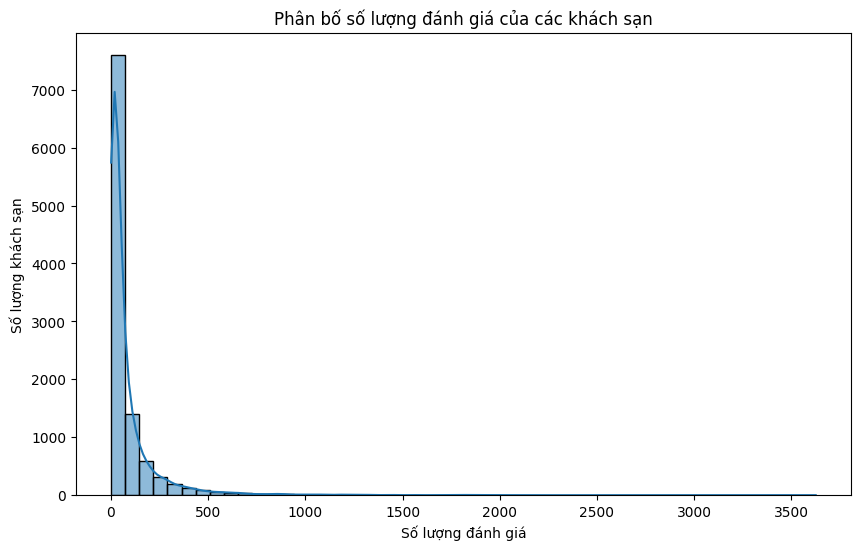

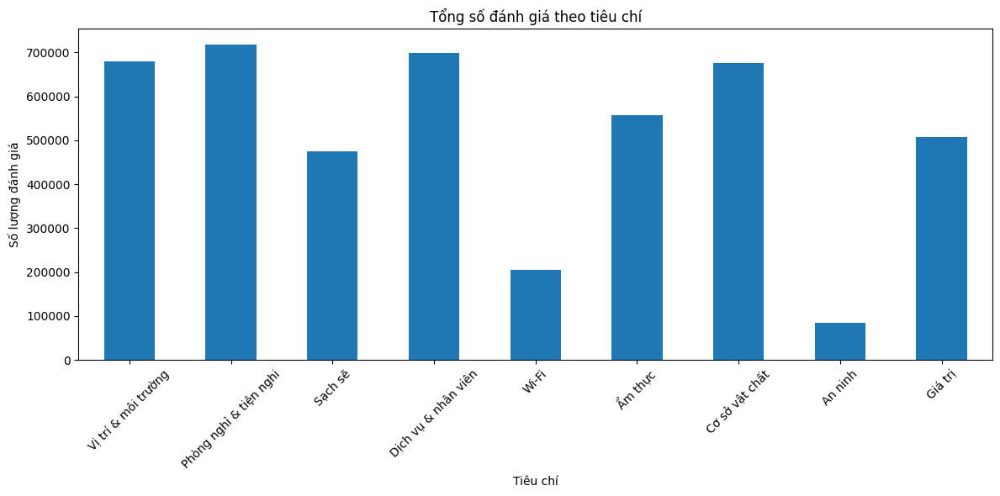

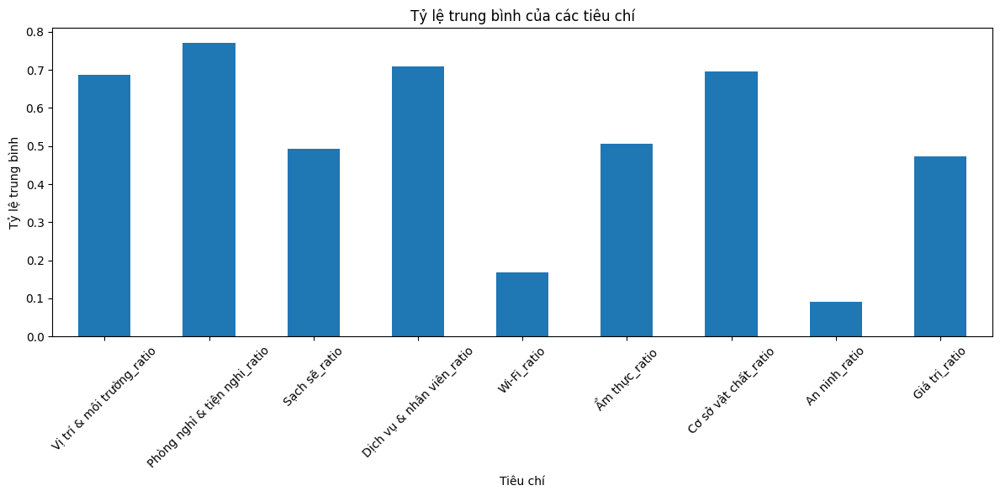


Đã lưu kết quả vào 'hotel_analysis_output.csv'


In [6]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from uuid import uuid4



# 1. Chuyển đổi dữ liệu thành DataFrame
def prepare_data(hotel_data):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]
    
    # Tạo danh sách để lưu dữ liệu
    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    
    # Tạo DataFrame
    df = pd.DataFrame(rows)
    
    # Đảm bảo tất cả tiêu chí đều có trong DataFrame, điền 0 nếu thiếu
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    
    return df, criteria

# 2. Chuẩn hóa dữ liệu (tính tỷ lệ đánh giá)
def normalize_data(df, criteria):
    # Tạo bản sao để tránh chỉnh sửa DataFrame gốc
    df_normalized = df.copy()
    
    # Tính tỷ lệ cho mỗi tiêu chí (số đánh giá / review_count)
    for criterion in criteria:
        df_normalized[f'{criterion}_ratio'] = df_normalized[criterion] / df_normalized['review_count'].replace(0, np.nan)
    
    # Điền NaN bằng 0 cho các khách sạn có review_count = 0
    df_normalized.fillna(0, inplace=True)
    
    return df_normalized

# 3. Phân cụm khách sạn bằng K-means
def cluster_hotels(df_normalized, criteria, n_clusters=3):
    # Lấy các cột tỷ lệ để phân cụm
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    X = df_normalized[ratio_columns]
    
    # Áp dụng K-means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_normalized['cluster'] = kmeans.fit_predict(X)
    
    return df_normalized, kmeans

# 4. Trực quan hóa
def visualize_data(df, df_normalized, criteria):
    # Biểu đồ phân bố số lượng đánh giá
    plt.figure(figsize=(10, 6))
    sns.histplot(df['review_count'], bins=50, kde=True)
    plt.title('Phân bố số lượng đánh giá của các khách sạn')
    plt.xlabel('Số lượng đánh giá')
    plt.ylabel('Số lượng khách sạn')
    plt.show()
    plt.close()
    
    # Biểu đồ tổng số đánh giá theo tiêu chí
    criteria_sums = df[criteria].sum()
    plt.figure(figsize=(12, 6))
    criteria_sums.plot(kind='bar')
    plt.title('Tổng số đánh giá theo tiêu chí')
    plt.xlabel('Tiêu chí')
    plt.ylabel('Số lượng đánh giá')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.close()
    
    # Biểu đồ tỷ lệ trung bình theo tiêu chí
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    mean_ratios = df_normalized[ratio_columns].mean()
    plt.figure(figsize=(12, 6))
    mean_ratios.plot(kind='bar')
    plt.title('Tỷ lệ trung bình của các tiêu chí')
    plt.xlabel('Tiêu chí')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.close()
    


# 5. Phân tích chính
def main(hotel_data):
    # Chuẩn bị dữ liệu
    df, criteria = prepare_data(hotel_data)
    
    # Thống kê cơ bản
    print("Thống kê cơ bản:")
    print(f"Tổng số khách sạn: {len(df)}")
    print(f"Tổng số đánh giá: {df['review_count'].sum()}")
    print(f"Trung bình đánh giá mỗi khách sạn: {df['review_count'].mean():.2f}")
    print(f"Khách sạn có nhiều đánh giá nhất: {df.loc[df['review_count'].idxmax(), 'hotel_id']} ({df['review_count'].max()} đánh giá)")
    
    # Chuẩn hóa dữ liệu
    df_normalized = normalize_data(df, criteria)
    
    # Phân cụm
    #df_normalized, kmeans = cluster_hotels(df_normalized, criteria, n_clusters=3)
    
    # In thông tin phân cụm
    # print("\nKết quả phân cụm:")
    # for cluster in range(3):
    #     cluster_hotels = df_normalized[df_normalized['cluster'] == cluster]
    #     print(f"\nCụm {cluster} ({len(cluster_hotels)} khách sạn):")
    #     print(cluster_hotels[['hotel_id', 'review_count'] + [f'{c}_ratio' for c in criteria]].mean())
    
    # Trực quan hóa
    visualize_data(df, df_normalized, criteria)
    
    # Lưu DataFrame đã xử lý
    df_normalized.to_csv('hotel_analysis_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_analysis_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    main(review)


Thống kê mô tả tỷ lệ các tiêu chí:
       Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  Sạch sẽ_ratio  \
count               10570.000000                  10570.000000   10570.000000   
mean                    0.687292                      0.771261       0.493589   
std                     0.187831                      0.147978       0.171707   
min                     0.000000                      0.000000       0.000000   
25%                     0.590909                      0.714286       0.400000   
50%                     0.723747                      0.800000       0.500000   
75%                     0.819149                      0.857668       0.600000   
max                     1.000000                      1.000000       1.000000   

       Dịch vụ & nhân viên_ratio   Wi-Fi_ratio  Ẩm thực_ratio  \
count               10570.000000  10570.000000   10570.000000   
mean                    0.709546      0.169295       0.506307   
std                     0.179399      0

C:\Users\nguye\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


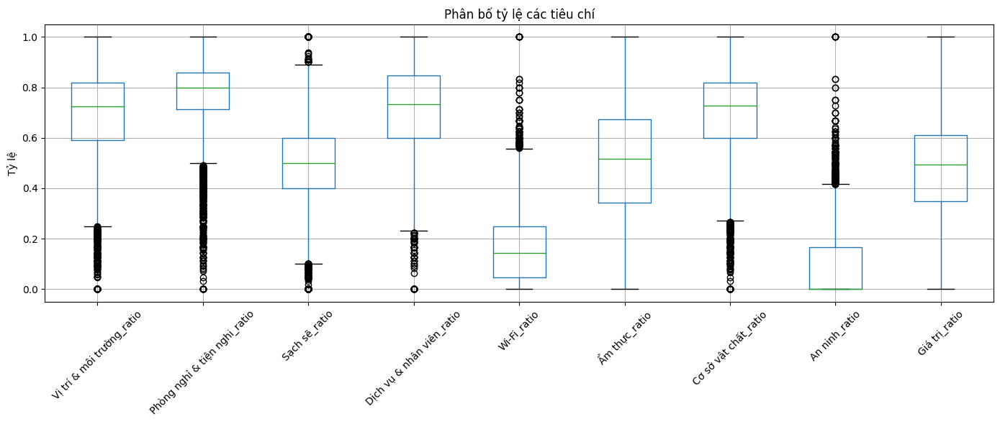

C:\Users\nguye\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Tỷ lệ trung bình theo cụm:

Cụm 0 (4417 khách sạn):
Vị trí & môi trường_ratio       0.815623
Phòng nghỉ & tiện nghi_ratio    0.845296
Sạch sẽ_ratio                   0.585326
Dịch vụ & nhân viên_ratio       0.818711
Wi-Fi_ratio                     0.292140
Ẩm thực_ratio                   0.690749
Cơ sở vật chất_ratio            0.813795
An ninh_ratio                   0.168799
Giá trị_ratio                   0.628080
dtype: float64

Cụm 1 (4504 khách sạn):
Vị trí & môi trường_ratio       0.662289
Phòng nghỉ & tiện nghi_ratio    0.774658
Sạch sẽ_ratio                   0.472117
Dịch vụ & nhân viên_ratio       0.623872
Wi-Fi_ratio                     0.096901
Ẩm thực_ratio                   0.428411
Cơ sở vật chất_ratio            0.679558
An ninh_ratio                   0.041076
Giá trị_ratio                   0.408600
dtype: float64

Cụm 2 (1649 khách sạn):
Vị trí & môi trường_ratio       0.411836
Phòng nghỉ & tiện nghi_ratio    0.563669
Sạch sẽ_ratio                   0.306510
Dịch v

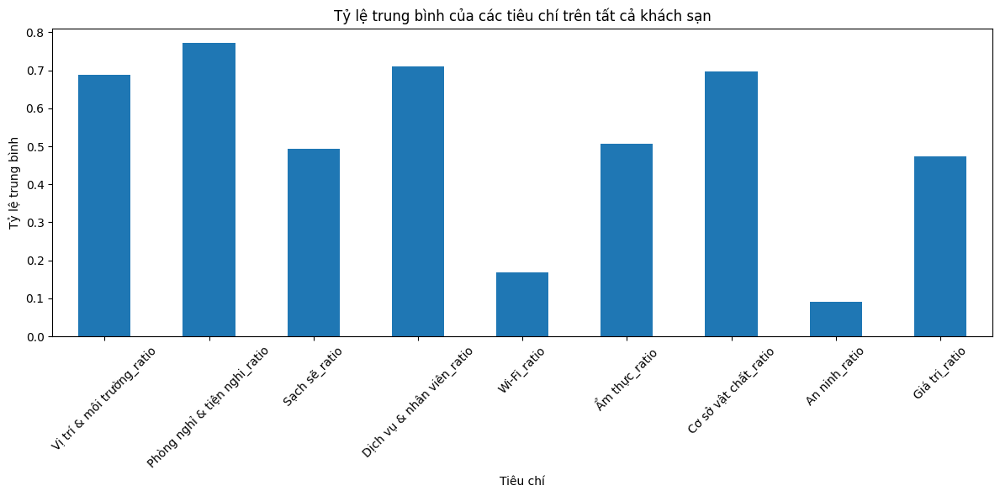

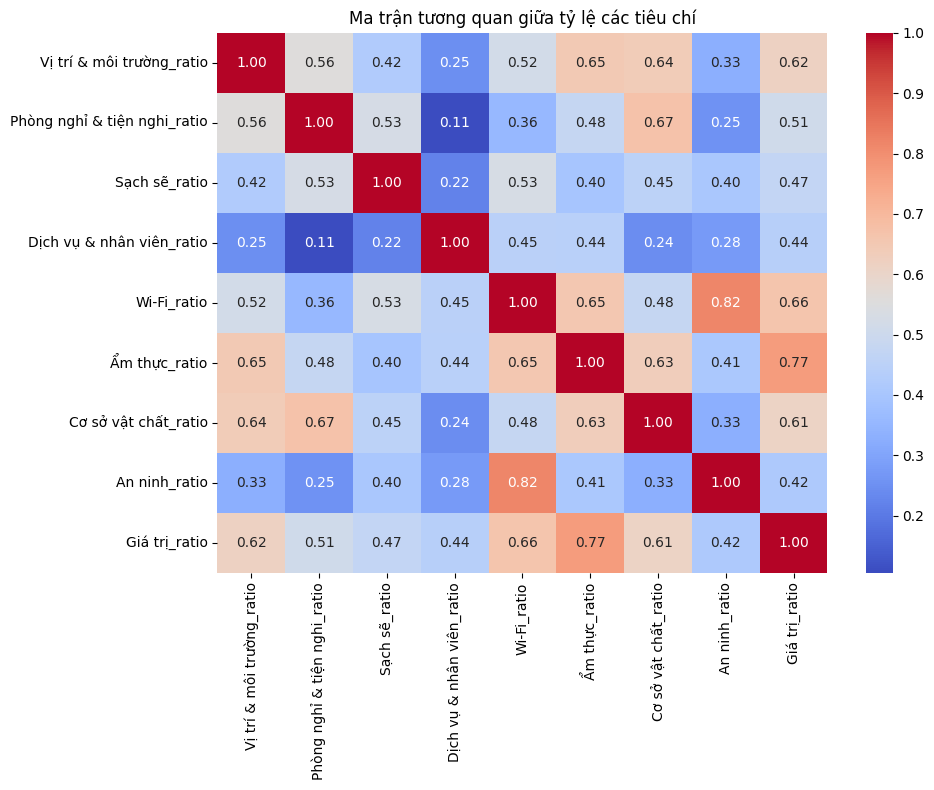


Đã lưu kết quả vào 'hotel_ratio_analysis_output.csv'


In [7]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Chuẩn bị dữ liệu
def prepare_data(hotel_data):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]

    
    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    
    df = pd.DataFrame(rows)
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    
    return df, criteria

# 2. Tính tỷ lệ các tiêu chí
def calculate_ratios(df, criteria):
    df_ratios = df.copy()
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
    df_ratios.fillna(0, inplace=True)
    return df_ratios

# 3. Kiểm tra tính phù hợp của tỷ lệ
def check_ratio_stability(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Tính thống kê mô tả
    stats_summary = df_ratios[ratio_columns].describe()
    print("\nThống kê mô tả tỷ lệ các tiêu chí:")
    print(stats_summary)
    
    # Kiểm tra phân bố chuẩn (Shapiro-Wilk test)
    print("\nKiểm tra phân bố chuẩn (p-value từ Shapiro-Wilk test):")
    for col in ratio_columns:
        stat, p_value = stats.shapiro(df_ratios[col].replace(0, np.nan).dropna())
        print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => gần phân bố chuẩn)")
    
    # Biểu đồ boxplot để kiểm tra phân bố
    plt.figure(figsize=(14, 6))
    df_ratios[ratio_columns].boxplot()
    plt.title('Phân bố tỷ lệ các tiêu chí')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ')
    plt.tight_layout()
    plt.show()
    plt.close()

# 4. Phân cụm để tìm xu hướng
def cluster_hotels(df_ratios, criteria, n_clusters=3):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    X = df_ratios[ratio_columns]
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_ratios['cluster'] = kmeans.fit_predict(X)
    
    # Tính tỷ lệ trung bình theo cụm
    print("\nTỷ lệ trung bình theo cụm:")
    for cluster in range(n_clusters):
        cluster_data = df_ratios[df_ratios['cluster'] == cluster]
        print(f"\nCụm {cluster} ({len(cluster_data)} khách sạn):")
        print(cluster_data[ratio_columns].mean())
    
    return df_ratios

# 5. Trực quan hóa và suy ra xu hướng
def visualize_trends(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Biểu đồ tỷ lệ trung bình
    mean_ratios = df_ratios[ratio_columns].mean()
    plt.figure(figsize=(12, 6))
    mean_ratios.plot(kind='bar')
    plt.title('Tỷ lệ trung bình của các tiêu chí trên tất cả khách sạn')
    plt.xlabel('Tiêu chí')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.close()
    
    # Ma trận tương quan
    plt.figure(figsize=(10, 8))
    sns.heatmap(df_ratios[ratio_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Ma trận tương quan giữa tỷ lệ các tiêu chí')
    plt.tight_layout()
    plt.show()
    plt.close()

# 6. Hàm chính
def main(hotel_data):
    # Chuẩn bị dữ liệu
    df, criteria = prepare_data(hotel_data)
    
    # Tính tỷ lệ
    df_ratios = calculate_ratios(df, criteria)
    
    # Kiểm tra tính phù hợp
    check_ratio_stability(df_ratios, criteria)
    
    # Phân cụm
    df_ratios = cluster_hotels(df_ratios, criteria, n_clusters=3)
    
    # Trực quan hóa và suy ra xu hướng
    visualize_trends(df_ratios, criteria)
    
    # Lưu kết quả
    df_ratios.to_csv('hotel_ratio_analysis_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_ratio_analysis_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    main(review)

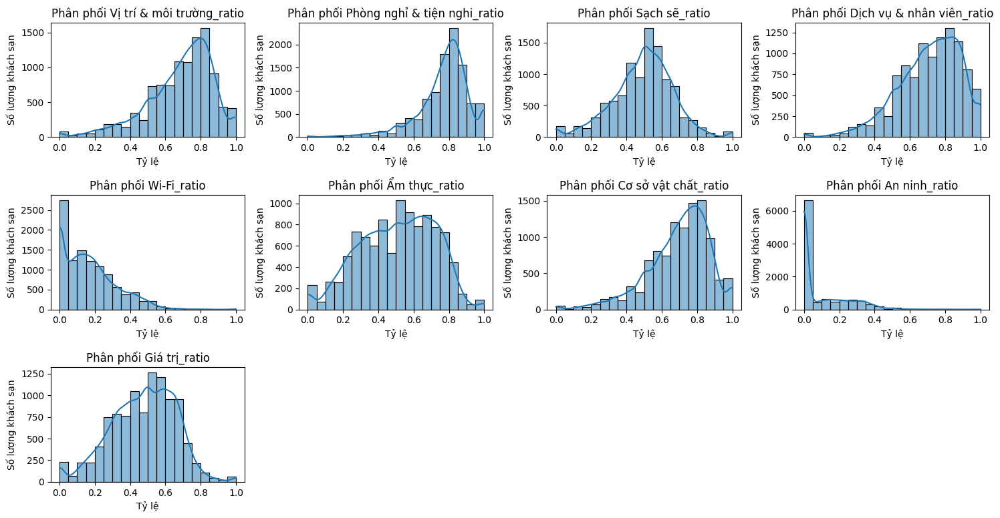

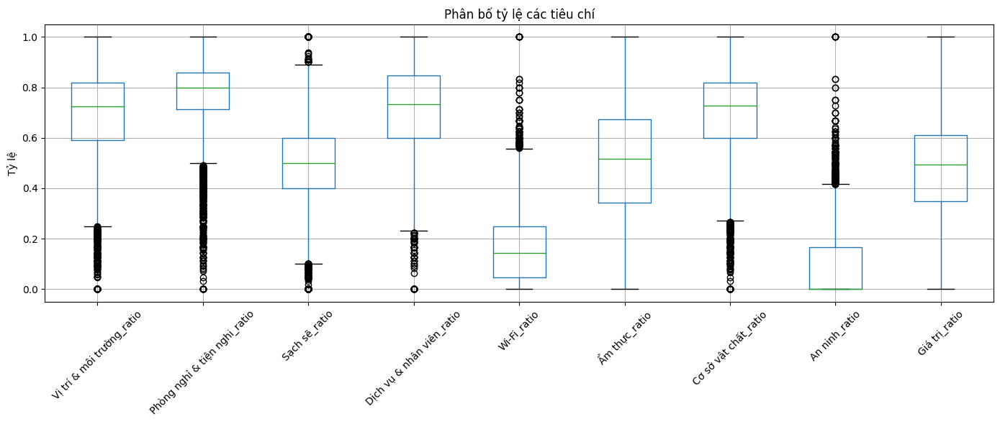

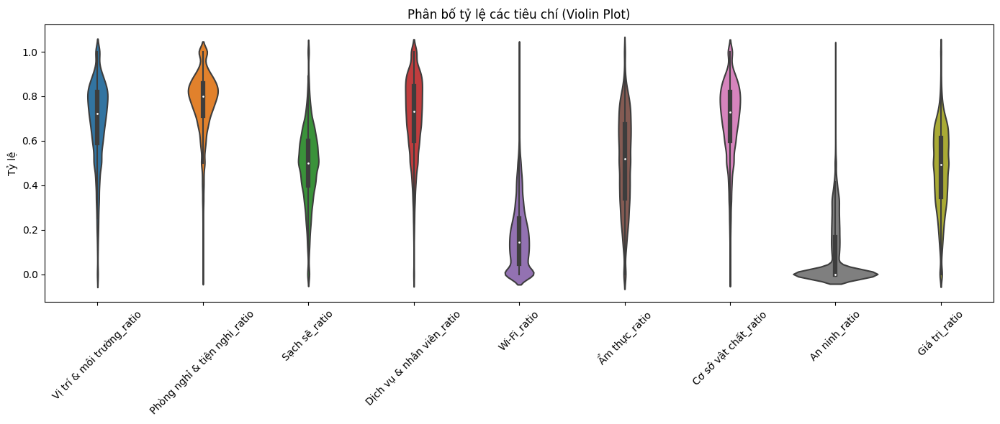


Thống kê mô tả tỷ lệ các tiêu chí:
       Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  Sạch sẽ_ratio  \
count               10570.000000                  10570.000000   10570.000000   
mean                    0.687292                      0.771261       0.493589   
std                     0.187831                      0.147978       0.171707   
min                     0.000000                      0.000000       0.000000   
25%                     0.590909                      0.714286       0.400000   
50%                     0.723747                      0.800000       0.500000   
75%                     0.819149                      0.857668       0.600000   
max                     1.000000                      1.000000       1.000000   

       Dịch vụ & nhân viên_ratio   Wi-Fi_ratio  Ẩm thực_ratio  \
count               10570.000000  10570.000000   10570.000000   
mean                    0.709546      0.169295       0.506307   
std                     0.179399      0

In [8]:
# 1. Chuẩn bị dữ liệu
def prepare_data(hotel_data):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]

    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    df = pd.DataFrame(rows)
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    return df, criteria

# 2. Tính tỷ lệ các tiêu chí
def calculate_ratios(df, criteria):
    df_ratios = df.copy()
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
    df_ratios.fillna(0, inplace=True)
    return df_ratios

# 3. Trực quan hóa phân phối
def visualize_distributions(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Histogram cho từng tiêu chí
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(ratio_columns, 1):
        plt.subplot(4, 4, i)
        sns.histplot(df_ratios[col], bins=20, kde=True)
        plt.title(f'Phân phối {col}')
        plt.xlabel('Tỷ lệ')
        plt.ylabel('Số lượng khách sạn')
    plt.tight_layout()
    plt.show()
    plt.close()
    
    # Boxplot cho tất cả tiêu chí
    plt.figure(figsize=(14, 6))
    df_ratios[ratio_columns].boxplot()
    plt.title('Phân bố tỷ lệ các tiêu chí')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ')
    plt.tight_layout()
    plt.show()
    plt.close()
    
    # Violin plot cho tất cả tiêu chí
    plt.figure(figsize=(14, 6))
    sns.violinplot(data=df_ratios[ratio_columns])
    plt.title('Phân bố tỷ lệ các tiêu chí (Violin Plot)')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ')
    plt.tight_layout()
    plt.show()
    plt.close()

# 4. Phân tích thống kê phân phối
def analyze_distributions(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    print("\nThống kê mô tả tỷ lệ các tiêu chí:")
    print(df_ratios[ratio_columns].describe())
    
    # Nhận xét về phân phối
    print("\nNhận xét về phân phối:")
    for col in ratio_columns:
        skewness = df_ratios[col].skew()
        kurtosis = df_ratios[col].kurtosis()
        print(f"{col}:")
        print(f" - Độ lệch (Skewness): {skewness:.2f} (0: đối xứng, >0: lệch phải, <0: lệch trái)")
        print(f" - Độ nhọn (Kurtosis): {kurtosis:.2f} (3: phân bố chuẩn, >3: nhọn, <3: phẳng)")

# 5. Hàm chính
def main(hotel_data):
    df, criteria = prepare_data(hotel_data)
    df_ratios = calculate_ratios(df, criteria)
    visualize_distributions(df_ratios, criteria)
    analyze_distributions(df_ratios, criteria)
    df_ratios.to_csv('hotel_ratio_distribution_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_ratio_distribution_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    main(review)


Thống kê mô tả tỷ lệ các tiêu chí:

Nhận xét về độ lệch chuẩn:
Vị trí & môi trường_ratio: std = 0.1878 (Ổn định)
Phòng nghỉ & tiện nghi_ratio: std = 0.1480 (Ổn định)
Sạch sẽ_ratio: std = 0.1717 (Ổn định)
Dịch vụ & nhân viên_ratio: std = 0.1794 (Ổn định)
Wi-Fi_ratio: std = 0.1491 (Ổn định)
Ẩm thực_ratio: std = 0.2137 (Ổn định)
Cơ sở vật chất_ratio: std = 0.1762 (Ổn định)
An ninh_ratio: std = 0.1388 (Ổn định)
Giá trị_ratio: std = 0.1835 (Ổn định)

Kiểm tra Kolmogorov-Smirnov (so sánh với phân bố trung bình):
Vị trí & môi trường_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Phòng nghỉ & tiện nghi_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Sạch sẽ_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Dịch vụ & nhân viên_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Wi-Fi_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Ẩm thực_ratio: p-value = 0.0000 (p > 0.05 => phân bố tương tự trung bình)
Cơ sở 

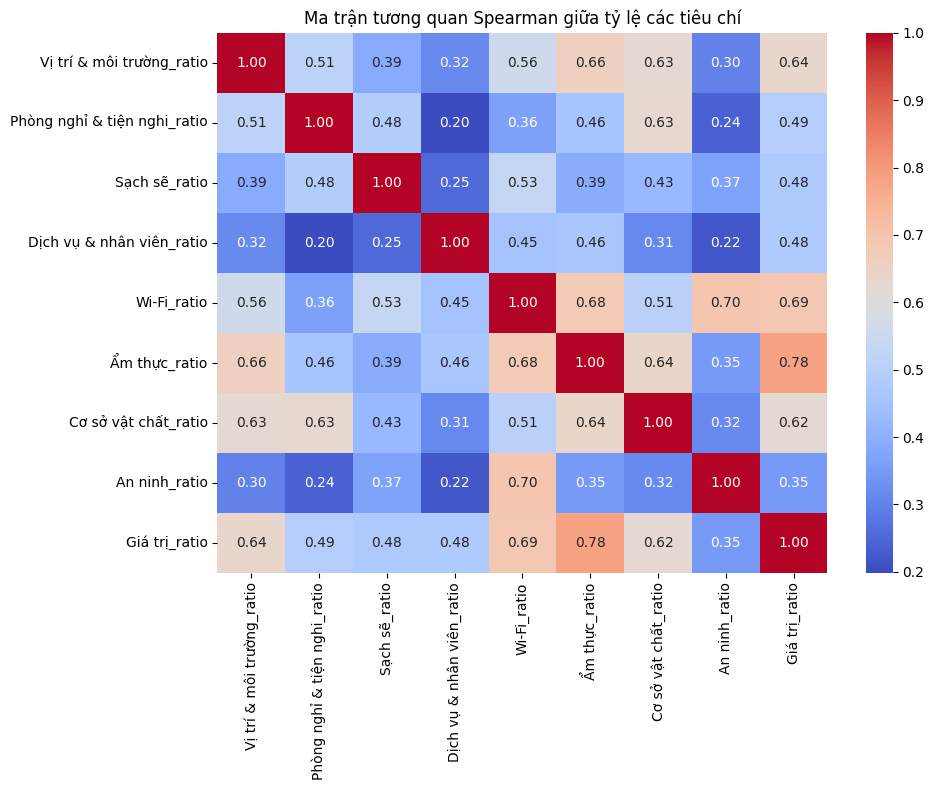

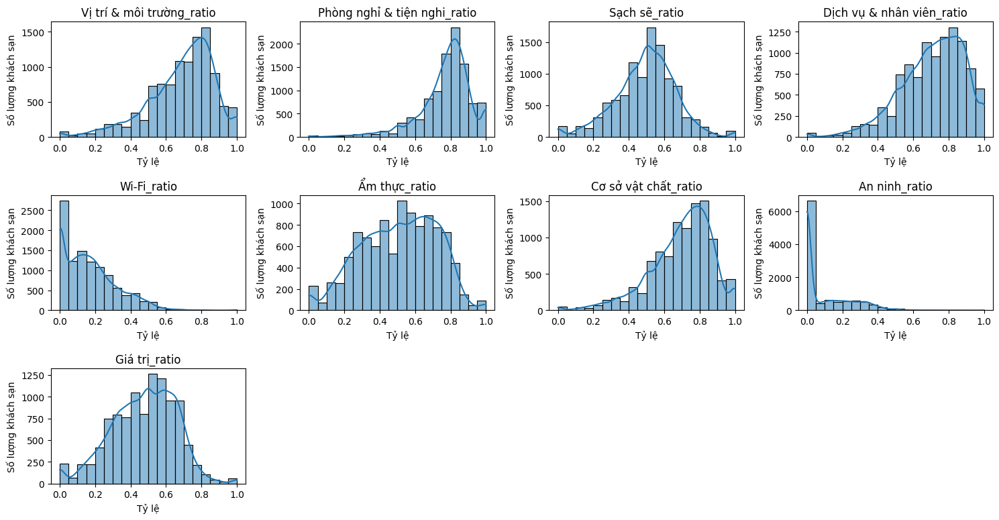

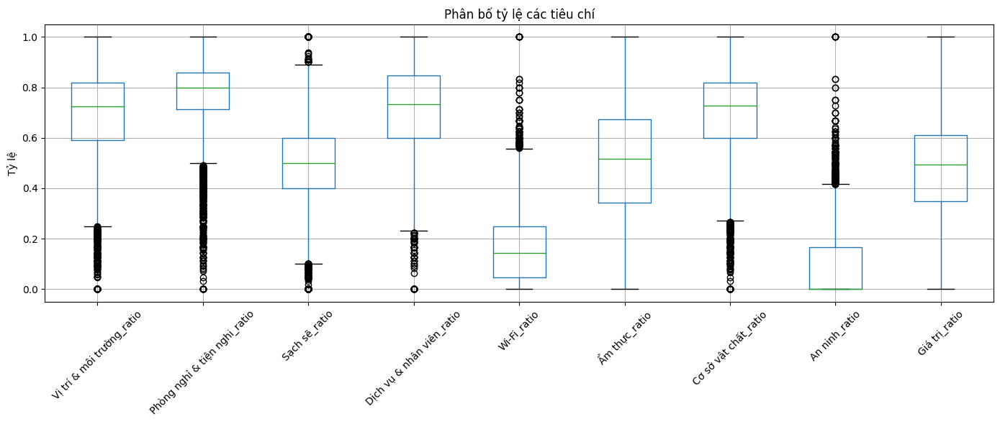


Đã lưu kết quả vào 'hotel_ratio_validation_output.csv'


In [13]:

# 1. Chuẩn bị dữ liệu
def prepare_data(hotel_data):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]

    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    df = pd.DataFrame(rows)
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    return df, criteria

# 2. Tính tỷ lệ các tiêu chí
def calculate_ratios(df, criteria):
    df_ratios = df.copy()
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
    df_ratios.fillna(0, inplace=True)
    return df_ratios

# 3. Kiểm định độ lệch chuẩn
def check_std_deviation(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    stats_summary = df_ratios[ratio_columns].describe()
    print("\nThống kê mô tả tỷ lệ các tiêu chí:")
    #print(stats_summary[['mean', 'std']])
    
    # Nhận xét về độ lệch chuẩn
    print("\nNhận xét về độ lệch chuẩn:")
    for col in ratio_columns:
        std = df_ratios[col].std()
        print(f"{col}: std = {std:.4f} ({'Ổn định' if std < 0.3 else 'Không ổn định'})")

# 4. Kiểm tra không tham số
def non_parametric_tests(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Kolmogorov-Smirnov test
    print("\nKiểm tra Kolmogorov-Smirnov (so sánh với phân bố trung bình):")
    mean_ratios = df_ratios[ratio_columns].mean()
    for col in ratio_columns:
        stat, p_value = stats.ks_1samp(df_ratios[col].replace(0, np.nan).dropna(), 
                                      lambda x: stats.norm.cdf(x, loc=mean_ratios.mean(), scale=mean_ratios.std()))
        print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => phân bố tương tự trung bình)")

    # Mann-Whitney U test (so sánh giữa ít và nhiều đánh giá)
    df_ratios['review_group'] = pd.cut(df_ratios['review_count'], 
                                      bins=[-1, 50, 500, float('inf')], 
                                      labels=['Ít (<50)', 'Trung bình (51-500)', 'Nhiều (>500)'])
    if 'Ít (<50)' in df_ratios['review_group'].values and 'Nhiều (>500)' in df_ratios['review_group'].values:
        print("\nKiểm tra Mann-Whitney U (so sánh Ít và Nhiều đánh giá):")
        for col in ratio_columns:
            stat, p_value = stats.mannwhitneyu(
                df_ratios[df_ratios['review_group'] == 'Ít (<50)'][col],
                df_ratios[df_ratios['review_group'] == 'Nhiều (>500)'][col],
                alternative='two-sided'
            )
            print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => không khác biệt đáng kể)")

# 5. Phân tích phân bố theo phân khúc
def analyze_segments(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    df_ratios['review_group'] = pd.cut(df_ratios['review_count'], 
                                      bins=[-1, 50, 500, float('inf')], 
                                      labels=['Ít (<50)', 'Trung bình (51-500)', 'Nhiều (>500)'])
    
    print("\nTỷ lệ trung bình theo phân khúc:")
    for group in df_ratios['review_group'].unique():
        group_data = df_ratios[df_ratios['review_group'] == group]
        print(f"\nPhân khúc {group} ({len(group_data)} khách sạn):")
        print(group_data[ratio_columns].mean())
    
    # Kruskal-Wallis test
    print("\nKiểm tra Kruskal-Wallis (so sánh giữa các phân khúc):")
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['review_group'] == g][col].dropna() 
                  for g in df_ratios['review_group'].unique() if g in df_ratios['review_group'].values]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => không khác biệt đáng kể)")

# 6. Phân tích tương quan
def correlation_analysis(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    corr_matrix = df_ratios[ratio_columns].corr(method='spearman')
    
    print("\nMa trận tương quan Spearman:")
    print(corr_matrix)
    
    # Trực quan hóa ma trận tương quan
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Ma trận tương quan Spearman giữa tỷ lệ các tiêu chí')
    plt.tight_layout()
    plt.show()
    plt.close()

# 7. Trực quan hóa phân phối
def visualize_distributions(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Histogram
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(ratio_columns, 1):
        plt.subplot(4, 4, i)
        sns.histplot(df_ratios[col], bins=20, kde=True)
        plt.title(f'{col}')
        plt.xlabel('Tỷ lệ')
        plt.ylabel('Số lượng khách sạn')
    plt.tight_layout()
    plt.show()
    plt.close()
    
    # Boxplot
    plt.figure(figsize=(14, 6))
    df_ratios[ratio_columns].boxplot()
    plt.title('Phân bố tỷ lệ các tiêu chí')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ')
    plt.tight_layout()
    plt.show()
    plt.close()

# 8. Hàm chính
def main(hotel_data):
    df, criteria = prepare_data(hotel_data)
    df_ratios = calculate_ratios(df, criteria)
    
    check_std_deviation(df_ratios, criteria)
    non_parametric_tests(df_ratios, criteria)
    analyze_segments(df_ratios, criteria)
    correlation_analysis(df_ratios, criteria)
    visualize_distributions(df_ratios, criteria)
    
    df_ratios.to_csv('hotel_ratio_validation_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_ratio_validation_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    main(review)


Thống kê mô tả tỷ lệ các tiêu chí:

Nhận xét về độ lệch chuẩn:
Vị trí & môi trường_ratio: std = 0.1878 (Ổn định)
Phòng nghỉ & tiện nghi_ratio: std = 0.1480 (Ổn định)
Sạch sẽ_ratio: std = 0.1717 (Ổn định)
Dịch vụ & nhân viên_ratio: std = 0.1794 (Ổn định)
Wi-Fi_ratio: std = 0.1491 (Ổn định)
Ẩm thực_ratio: std = 0.2137 (Ổn định)
Cơ sở vật chất_ratio: std = 0.1762 (Ổn định)
An ninh_ratio: std = 0.1388 (Ổn định)
Giá trị_ratio: std = 0.1835 (Ổn định)

Phân tích phân bố (khách sạn có đánh giá):
Vị trí & môi trường_ratio:
 - Độ lệch (Skewness): -0.98 (0: đối xứng, >0: lệch phải, <0: lệch trái)
 - Độ nhọn (Kurtosis): 1.09 (3: phân bố chuẩn, >3: nhọn, <3: phẳng)
Phòng nghỉ & tiện nghi_ratio:
 - Độ lệch (Skewness): -1.44 (0: đối xứng, >0: lệch phải, <0: lệch trái)
 - Độ nhọn (Kurtosis): 3.53 (3: phân bố chuẩn, >3: nhọn, <3: phẳng)
Sạch sẽ_ratio:
 - Độ lệch (Skewness): -0.29 (0: đối xứng, >0: lệch phải, <0: lệch trái)
 - Độ nhọn (Kurtosis): 0.60 (3: phân bố chuẩn, >3: nhọn, <3: phẳng)
Dịch vụ & n

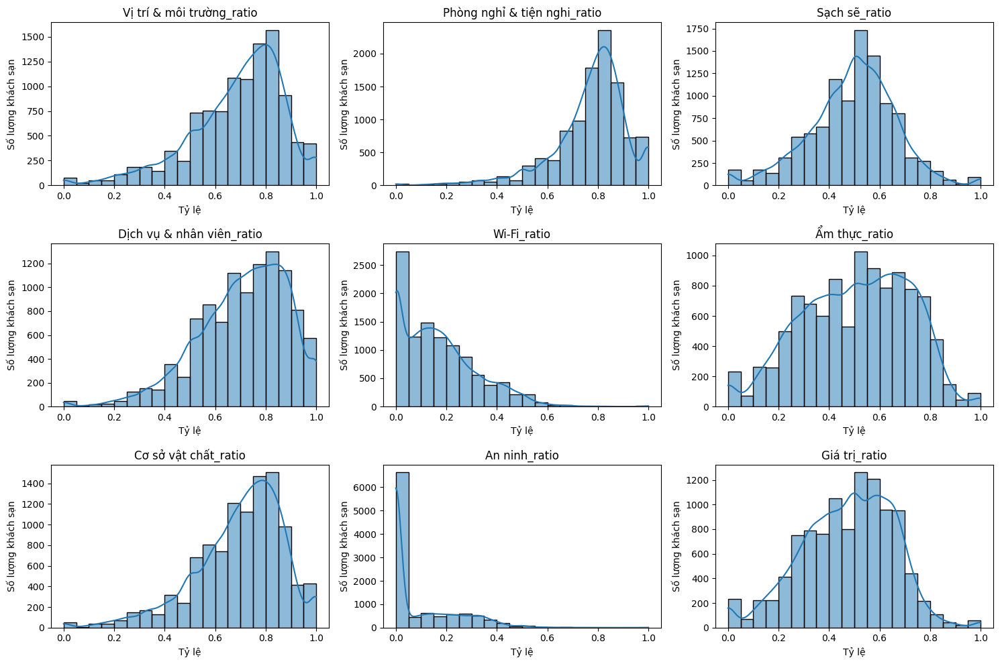

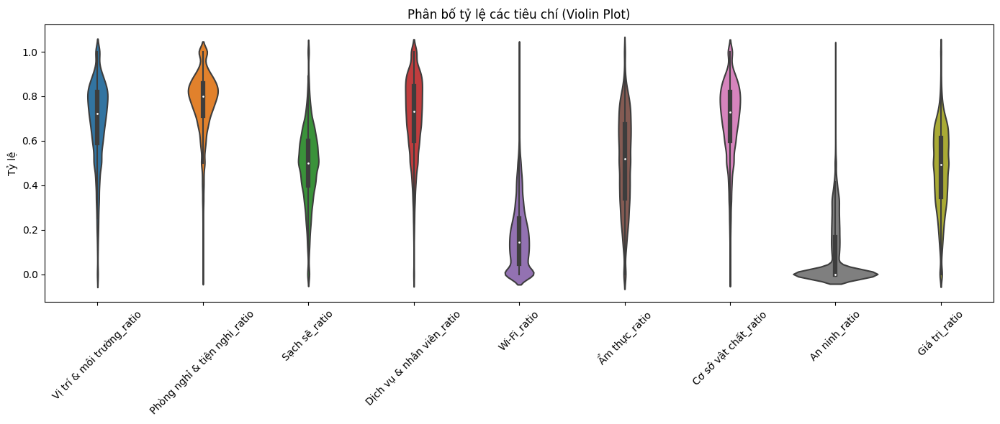


Tỷ lệ trung bình theo phân khúc:

Phân khúc Trung bình (51-500) (3571 khách sạn):
Vị trí & môi trường_ratio       0.739047
Phòng nghỉ & tiện nghi_ratio    0.792432
Sạch sẽ_ratio                   0.521146
Dịch vụ & nhân viên_ratio       0.755556
Wi-Fi_ratio                     0.207708
Ẩm thực_ratio                   0.582392
Cơ sở vật chất_ratio            0.735682
An ninh_ratio                   0.095772
Giá trị_ratio                   0.535461
dtype: float64

Phân khúc Ít (<50) (6724 khách sạn):
Vị trí & môi trường_ratio       0.655061
Phòng nghỉ & tiện nghi_ratio    0.758134
Sạch sẽ_ratio                   0.476669
Dịch vụ & nhân viên_ratio       0.680130
Wi-Fi_ratio                     0.144447
Ẩm thực_ratio                   0.457672
Cơ sở vật chất_ratio            0.672133
An ninh_ratio                   0.087785
Giá trị_ratio                   0.433872
dtype: float64

Phân khúc Nhiều (>500) (275 khách sạn):
Vị trí & môi trường_ratio       0.803283
Phòng nghỉ & tiện nghi_ratio 

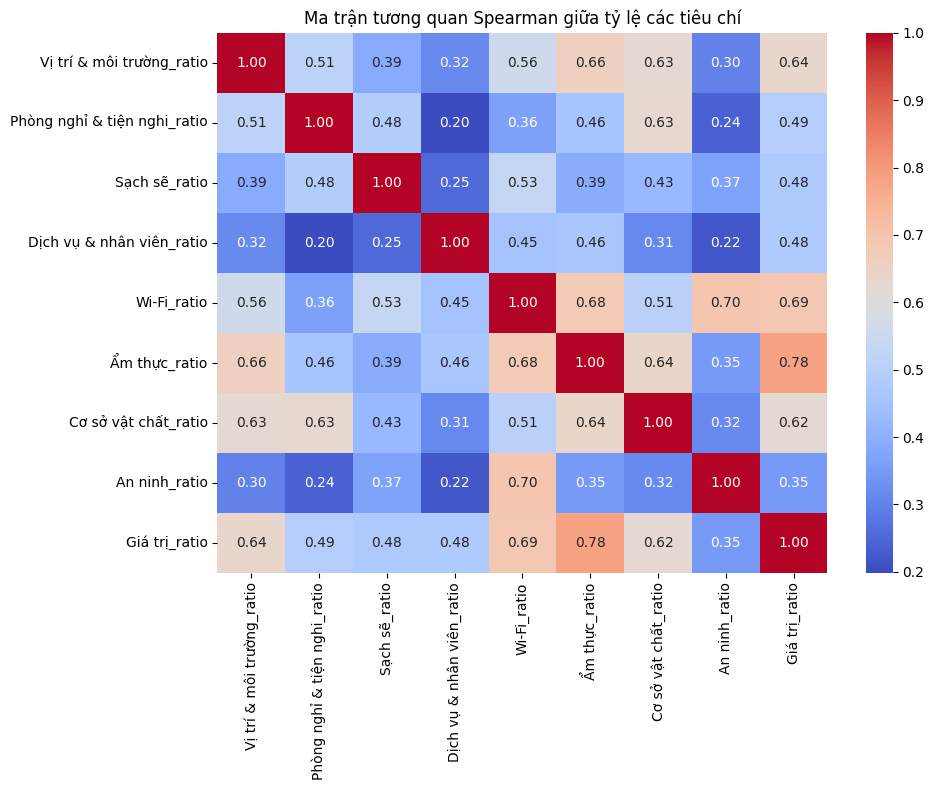


Đã lưu kết quả vào 'hotel_ratio_validation_advanced_output.csv'


In [16]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns



# 1. Chuẩn bị dữ liệu
def prepare_data(hotel_data):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]
    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    df = pd.DataFrame(rows)
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    return df, criteria

# 2. Tính tỷ lệ các tiêu chí
def calculate_ratios(df, criteria):
    df_ratios = df.copy()
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
    df_ratios.fillna(0, inplace=True)
    return df_ratios

# 3. Kiểm tra độ lệch chuẩn
def check_std_deviation(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    stats_summary = df_ratios[ratio_columns].describe()
    print("\nThống kê mô tả tỷ lệ các tiêu chí:")
    #print(stats_summary[['mean', 'std']])
    
    print("\nNhận xét về độ lệch chuẩn:")
    for col in ratio_columns:
        std = df_ratios[col].std()
        print(f"{col}: std = {std:.4f} ({'Ổn định' if std < 0.3 else 'Không ổn định'})")

# 4. Kiểm tra phân bố và phân tích skewness/kurtosis
def analyze_distribution(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Loại bỏ khách sạn không có đánh giá
    df_nonzero = df_ratios[df_ratios['review_count'] > 0]
    
    print("\nPhân tích phân bố (khách sạn có đánh giá):")
    for col in ratio_columns:
        skewness = df_nonzero[col].skew()
        kurtosis = df_nonzero[col].kurtosis()
        print(f"{col}:")
        print(f" - Độ lệch (Skewness): {skewness:.2f} (0: đối xứng, >0: lệch phải, <0: lệch trái)")
        print(f" - Độ nhọn (Kurtosis): {kurtosis:.2f} (3: phân bố chuẩn, >3: nhọn, <3: phẳng)")
    
    # Histogram và Violin plot
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(ratio_columns, 1):
        plt.subplot(3, 3, i)
        sns.histplot(df_nonzero[col], bins=20, kde=True)
        plt.title(f'{col}')
        plt.xlabel('Tỷ lệ')
        plt.ylabel('Số lượng khách sạn')
    plt.tight_layout()
    plt.show()
    plt.close()
    
    plt.figure(figsize=(14, 6))
    sns.violinplot(data=df_nonzero[ratio_columns])
    plt.title('Phân bố tỷ lệ các tiêu chí (Violin Plot)')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ')
    plt.tight_layout()
    plt.show()
    plt.close()

# 5. Phân tích phân khúc và Kruskal-Wallis test
def analyze_segments(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    df_ratios['review_group'] = pd.cut(df_ratios['review_count'], 
                                      bins=[-1, 50, 500, float('inf')], 
                                      labels=['Ít (<50)', 'Trung bình (51-500)', 'Nhiều (>500)'])
    
    print("\nTỷ lệ trung bình theo phân khúc:")
    for group in df_ratios['review_group'].unique():
        group_data = df_ratios[df_ratios['review_group'] == group]
        print(f"\nPhân khúc {group} ({len(group_data)} khách sạn):")
        print(group_data[ratio_columns].mean())
    
    # Kruskal-Wallis test
    print("\nKiểm tra Kruskal-Wallis (so sánh giữa các phân khúc):")
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['review_group'] == g][col].dropna() 
                  for g in df_ratios['review_group'].unique() if g in df_ratios['review_group'].values]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => không khác biệt đáng kể)")

# 6. Phân tích tương quan
def correlation_analysis(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    corr_matrix = df_ratios[ratio_columns].corr(method='spearman')
    
    print("\nMa trận tương quan Spearman:")
    print(corr_matrix)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Ma trận tương quan Spearman giữa tỷ lệ các tiêu chí')
    plt.tight_layout()
    plt.show()
    plt.close()

# 7. Hàm chính
def main(hotel_data):
    df, criteria = prepare_data(hotel_data)
    df_ratios = calculate_ratios(df, criteria)
    
    check_std_deviation(df_ratios, criteria)
    analyze_distribution(df_ratios, criteria)
    analyze_segments(df_ratios, criteria)
    correlation_analysis(df_ratios, criteria)
    
    df_ratios.to_csv('hotel_ratio_validation_advanced_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_ratio_validation_advanced_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    main(review)


Kiểm tra dữ liệu sau khi làm sạch:
Tổng số khách sạn ban đầu: 10570
Tổng số khách sạn sau khi làm sạch: 8565
Khách sạn bị loại bỏ (review_count < 10): 2005

Phân bố review_count sau khi làm sạch:
count    8565.000000
mean      103.375365
std       182.212506
min        10.000000
25%        20.000000
50%        42.000000
75%       108.000000
max      3625.000000
Name: review_count, dtype: float64

Số lượng khách sạn trong mỗi phân khúc:
Ít (10-50)             4719
Trung bình (51-500)    3571
Nhiều (>500)            275
Name: review_group, dtype: int64

Thống kê mô tả tỷ lệ các tiêu chí:

Nhận xét về xu hướng đánh giá:
Vị trí & môi trường_ratio: Trung bình = 0.7020, Std = 0.1634 (Thường được đánh giá)
Phòng nghỉ & tiện nghi_ratio: Trung bình = 0.7754, Std = 0.1272 (Thường được đánh giá)
Sạch sẽ_ratio: Trung bình = 0.4994, Std = 0.1482 (Ít được đánh giá)
Dịch vụ & nhân viên_ratio: Trung bình = 0.7243, Std = 0.1568 (Thường được đánh giá)
Wi-Fi_ratio: Trung bình = 0.1787, Std = 0.1402 (Ít 

C:\Users\nguye\AppData\Local\Temp\ipykernel_2488\3206861979.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['review_group'] = pd.cut(df_cleaned['review_count'],
C:\Users\nguye\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


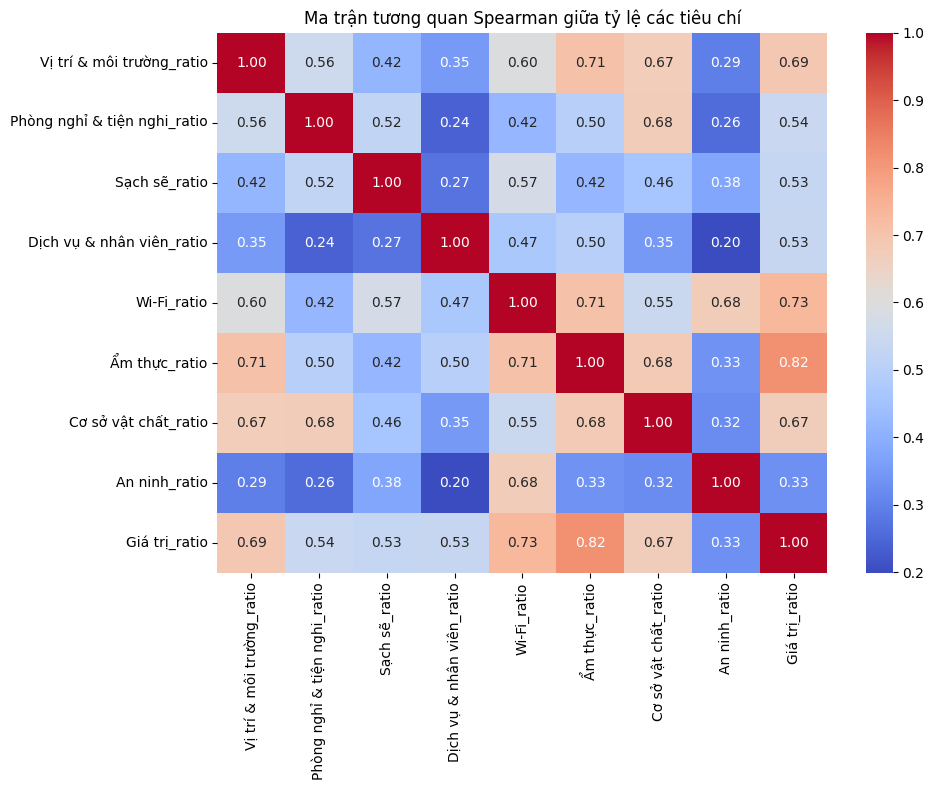

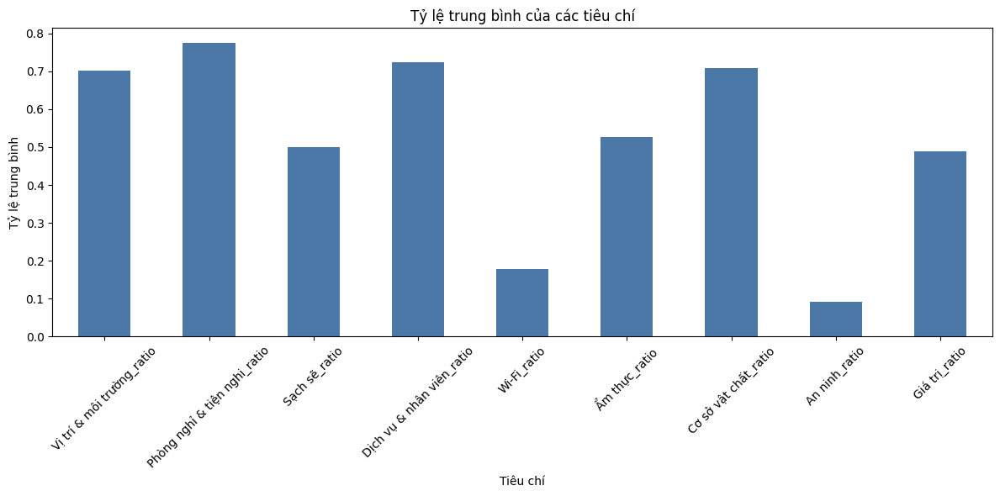


Kiểm tra bootstrap (khoảng tin cậy 95%):
       Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  Sạch sẽ_ratio  \
0.025                   0.698607                      0.772494       0.496305   
0.975                   0.705548                      0.778284       0.502599   

       Dịch vụ & nhân viên_ratio  Wi-Fi_ratio  Ẩm thực_ratio  \
0.025                   0.720680     0.175660       0.521199   
0.975                   0.727387     0.181632       0.529689   

       Cơ sở vật chất_ratio  An ninh_ratio  Giá trị_ratio  
0.025              0.704355       0.088807       0.484738  
0.975              0.711338       0.094527       0.491802  

Đã lưu kết quả vào 'hotel_ratio_trend_output.csv'


In [11]:

import pandas as pd
import numpy as np
from scipy import stats
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


# 1. Làm sạch dữ liệu
def prepare_and_clean_data(hotel_data, min_reviews=10):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]
    rows = []
    for hotel_id, info in hotel_data.items():
        row = {'hotel_id': hotel_id, 'review_count': info['review_count']}
        row.update(info['criteria_summary'])
        rows.append(row)
    df = pd.DataFrame(rows)
    for criterion in criteria:
        if criterion not in df.columns:
            df[criterion] = 0
    
    # Làm sạch: Loại bỏ khách sạn có review_count < min_reviews
    df_cleaned = df[df['review_count'] >= min_reviews]
    
    # Kiểm tra dữ liệu
    print("\nKiểm tra dữ liệu sau khi làm sạch:")
    print(f"Tổng số khách sạn ban đầu: {len(df)}")
    print(f"Tổng số khách sạn sau khi làm sạch: {len(df_cleaned)}")
    print(f"Khách sạn bị loại bỏ (review_count < {min_reviews}): {len(df) - len(df_cleaned)}")
    print("\nPhân bố review_count sau khi làm sạch:")
    print(df_cleaned['review_count'].describe())
    
    # Kiểm tra phân khúc
    df_cleaned['review_group'] = pd.cut(df_cleaned['review_count'], 
                                       bins=[min_reviews-1, 50, 500, float('inf')], 
                                       labels=['Ít (10-50)', 'Trung bình (51-500)', 'Nhiều (>500)'])
    print("\nSố lượng khách sạn trong mỗi phân khúc:")
    print(df_cleaned['review_group'].value_counts())
    
    return df_cleaned, criteria

# 2. Tính tỷ lệ
def calculate_ratios(df, criteria):
    df_ratios = df.copy()
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
    df_ratios.fillna(0, inplace=True)
    return df_ratios

# 3. Phân tích thống kê mô tả
def descriptive_analysis(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    stats_summary = df_ratios[ratio_columns].describe()
    print("\nThống kê mô tả tỷ lệ các tiêu chí:")
    #print(stats_summary[['mean', 'std']])
    
    print("\nNhận xét về xu hướng đánh giá:")
    for col in ratio_columns:
        mean = df_ratios[col].mean()
        std = df_ratios[col].std()
        print(f"{col}: Trung bình = {mean:.4f}, Std = {std:.4f} ({'Thường được đánh giá' if mean > 0.5 else 'Ít được đánh giá'})")

# 4. Phân tích theo phân khúc
def analyze_segments(df_ratios, criteria, min_reviews):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    df_ratios['review_group'] = pd.cut(df_ratios['review_count'], 
                                      bins=[min_reviews-1, 50, 500, float('inf')], 
                                      labels=['Ít (10-50)', 'Trung bình (51-500)', 'Nhiều (>500)'])
    
    print("\nTỷ lệ trung bình theo phân khúc:")
    for group in df_ratios['review_group'].unique():
        group_data = df_ratios[df_ratios['review_group'] == group]
        print(f"\nPhân khúc {group} ({len(group_data)} khách sạn):")
        print(group_data[ratio_columns].mean())
    
    # Kruskal-Wallis test
    print("\nKiểm tra Kruskal-Wallis:")
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['review_group'] == g][col].dropna() 
                  for g in df_ratios['review_group'].unique() if g in df_ratios['review_group'].values]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            print(f"{col}: p-value = {p_value:.4f} (p > 0.05 => không khác biệt đáng kể)")
    
    # Kích thước hiệu ứng
    if 'Ít (10-50)' in df_ratios['review_group'].values and 'Nhiều (>500)' in df_ratios['review_group'].values:
        print("\nKích thước hiệu ứng (Mann-Whitney U giữa Ít và Nhiều):")
        for col in ratio_columns:
            u_stat, p_value = stats.mannwhitneyu(
                df_ratios[df_ratios['review_group'] == 'Ít (10-50)'][col],
                df_ratios[df_ratios['review_group'] == 'Nhiều (>500)'][col],
                alternative='two-sided'
            )
            n1 = len(df_ratios[df_ratios['review_group'] == 'Ít (10-50)'])
            n2 = len(df_ratios[df_ratios['review_group'] == 'Nhiều (>500)'])
            effect_size = u_stat / (n1 * n2)  # Cohen's r approximation
            print(f"{col}: Effect size = {effect_size:.4f} (0.1: nhỏ, 0.3: trung bình, 0.5: lớn)")

# 5. Phân cụm
def cluster_analysis(df_ratios, criteria, n_clusters=3):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    X = df_ratios[ratio_columns]
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_ratios['cluster'] = kmeans.fit_predict(X)
    
    print("\nTỷ lệ trung bình theo cụm:")
    for cluster in range(n_clusters):
        cluster_data = df_ratios[df_ratios['cluster'] == cluster]
        print(f"\nCụm {cluster} ({len(cluster_data)} khách sạn):")
        print(cluster_data[ratio_columns].mean())

# 6. Phân tích tương quan
def correlation_analysis(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    corr_matrix = df_ratios[ratio_columns].corr(method='spearman')
    
    print("\nMa trận tương quan Spearman:")
    print(corr_matrix)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Ma trận tương quan Spearman giữa tỷ lệ các tiêu chí')
    plt.tight_layout()
    plt.show()
    plt.close()

# 7. Trực quan hóa xu hướng
def visualize_trends(df_ratios, criteria):
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    
    # Biểu đồ cột cho tỷ lệ trung bình
    mean_ratios = df_ratios[ratio_columns].mean()
    plt.figure(figsize=(12, 6))
    mean_ratios.plot(kind='bar', color='#4C78A8')
    plt.title('Tỷ lệ trung bình của các tiêu chí')
    plt.xlabel('Tiêu chí')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.close()

# 8. Hàm chính
def main(hotel_data, min_reviews=10):
    df_cleaned, criteria = prepare_and_clean_data(hotel_data, min_reviews)
    if len(df_cleaned) == 0:
        print(f"\nKhông còn khách sạn nào sau khi loại bỏ review_count < {min_reviews}.")
        return
    
    df_ratios = calculate_ratios(df_cleaned, criteria)
    descriptive_analysis(df_ratios, criteria)
    analyze_segments(df_ratios, criteria, min_reviews)
    cluster_analysis(df_ratios, criteria)
    correlation_analysis(df_ratios, criteria)
    visualize_trends(df_ratios, criteria)
    ratio_columns = [f'{criterion}_ratio' for criterion in criteria]
    from sklearn.utils import resample
    bootstrap_means = []
    for _ in range(1000):
        sample = resample(df_ratios[ratio_columns], n_samples=len(df_ratios))
        bootstrap_means.append(sample.mean())
    bootstrap_means = pd.DataFrame(bootstrap_means)
    print("\nKiểm tra bootstrap (khoảng tin cậy 95%):")
    print(bootstrap_means.quantile([0.025, 0.975]))
    
    df_ratios.to_csv('hotel_ratio_trend_output.csv', index=False)
    print("\nĐã lưu kết quả vào 'hotel_ratio_trend_output.csv'")

# Chạy chương trình
if __name__ == "__main__":
    min_reviews = 10  # Có thể thay đổi (10, 20, 50)
    main(review, min_reviews)

#### REVIEW + INFO


In [20]:
with open("D:\\graduate_dissertation\\final\\mini_model\\recommenr_review_data\\review_processing_9_criteria.json", "r", encoding="utf-8") as f:
    data = json.load(f)
review = {}
for id in data.keys():
    criteria = {}
    for c in data[id]['summary']['criteria_summary'].keys():
        criteria[c] = data[id]['summary']['criteria_summary'][c]['total']
    review[id] = {
        'review_count': data[id]['summary']['review_count'],
        'criteria_summary': criteria
    }

In [3]:
ids = []
for id in review.keys():
    ids.append(id)
len(ids)

10570

In [21]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_allRoom.json", 'r', encoding='utf-8') as f:
    feature_allRoom = json.load(f)

In [5]:
room_data = []
for key in feature_allRoom:
    room_data.append({
        'id_room': key['id_room'],
        'id': key['id'],
        'original_price': key['original_price'],
    })


In [6]:
len(room_data)

42983

In [22]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_star_rating.json", 'r', encoding='utf-8') as f:
    feature_star_rating = json.load(f)

In [24]:
star_data = []
for key in feature_star_rating:
    star_data.append({
        'id': key['id'],
        'stars_rating': key['stars_rating']
    })

In [25]:
len(star_data)

11486

In [26]:
star_data[0]

{'id': '10000593', 'stars_rating': 3}

In [10]:
def filter_matching_elements(ids_A, B):
    """
    Lọc các phần tử B có id trong A.
    Nếu trong B không có key 'id' thì sẽ lọc theo key 'id_room'.
    """
    try:
        return [item for item in B if item['id'] in ids_A]  # Lọc các phần tử B có id trong A
    except:
        return [item for item in B if item['id_room'] in ids_A]

In [11]:
room_data = filter_matching_elements(ids, room_data)
star_data = filter_matching_elements(ids, star_data)

In [12]:
with open("hotel_review_score.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

In [13]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns



# 1. Làm sạch và tích hợp dữ liệu
def prepare_and_clean_data(hotel_data, room_data, star_data, reviewer_data, min_reviews=20):
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]

    
    # Lấy giao ID khách sạn
    hotel_ids = set(hotel_data.keys())
    room_ids = set(pd.DataFrame(room_data)['id'])
    star_ids = set(pd.DataFrame(star_data)['id'])
    reviewer_ids = set(pd.DataFrame(reviewer_data)['id_hotel'])
    common_ids = hotel_ids.intersection(room_ids, star_ids, reviewer_ids)
    print(f"\nSố ID khách sạn chung: {len(common_ids)}")
    if not common_ids:
        raise ValueError("Không có ID khách sạn nào chung trong 4 tập dữ liệu.")
    
    # Chuẩn bị dữ liệu gốc từ hotel_data
    rows = []
    for hotel_id in common_ids:
        info = hotel_data[hotel_id]
        row = {'id': hotel_id, 'review_count': info['review_count']}
        for crit in criteria:
            crit_key = crit.lower().strip()
            matched_key = next((k for k in info['criteria_summary'] if k.lower().strip() == crit_key), None)
            row[crit] = info['criteria_summary'].get(matched_key, 0)
        rows.append(row)
    df_hotels = pd.DataFrame(rows)
    
    # Kiểm tra cột
    print("\nCột trong df_hotels:", df_hotels.columns.tolist())
    
    # Làm sạch: Loại bỏ review_count < min_reviews
    df_hotels = df_hotels[df_hotels['review_count'] >= min_reviews]
    print(f"Số khách sạn sau khi loại review_count < {min_reviews}: {len(df_hotels)}")
    
    # Tích hợp dữ liệu phòng
    df_rooms = pd.DataFrame(room_data)
    df_rooms = df_rooms[df_rooms['id'].isin(common_ids)]
    room_stats = df_rooms.groupby('id').agg(
        avg_price=('original_price', 'mean'),
        num_rooms=('id_room', 'count')
    ).reset_index()
    # Lọc giá phòng bất thường
    room_stats = room_stats[room_stats['avg_price'] <= 50_000_000]
    df_hotels = df_hotels.merge(room_stats, on='id', how='inner')
    print(f"Số khách sạn sau khi gộp room_data: {len(df_hotels)}")
    
    # Tích hợp số sao
    df_stars = pd.DataFrame(star_data)
    df_stars = df_stars[df_stars['id'].isin(common_ids)]
    df_stars['stars_rating'] = df_stars['stars_rating'].fillna('Không xếp hạng')
    df_hotels = df_hotels.merge(df_stars, on='id', how='inner')
    print(f"Số khách sạn sau khi gộp star_data: {len(df_hotels)}")
    
    # Tích hợp dữ liệu người đánh giá
    df_reviewers = pd.DataFrame(reviewer_data)
    df_reviewers = df_reviewers[df_reviewers['id_hotel'].isin(common_ids)]
    df_reviewers['rating'] = df_reviewers['rating'].str.extract(r'(\d+)').astype(float).fillna(0)
    
    # Tính tỷ lệ Positive, không nhân bản theo state
    criteria_sentiment = []
    for _, row in df_reviewers.iterrows():
        for crit, sent in row['criteria']:
            crit_clean = crit.strip()
            if crit_clean not in criteria:
                continue
            criteria_sentiment.append({
                'id_hotel': row['id_hotel'],
                'criterion': crit_clean,
                'sentiment': 1 if sent == 'Positive' else 0
            })
    df_sentiment = pd.DataFrame(criteria_sentiment)
    if not df_sentiment.empty:
        sentiment_pivot = df_sentiment.pivot_table(
            index='id_hotel', columns='criterion', values='sentiment', aggfunc='mean'
        ).reset_index()
        # Đổi tên cột để tránh xung đột
        sentiment_columns = {crit: f'{crit}_positive' for crit in criteria if crit in sentiment_pivot.columns}
        sentiment_pivot = sentiment_pivot.rename(columns=sentiment_columns)
        df_hotels = df_hotels.merge(sentiment_pivot, left_on='id', right_on='id_hotel', how='inner')
        df_hotels = df_hotels.drop(columns=['id_hotel'], errors='ignore')
    
    # Kiểm tra nhân bản
    unique_hotels = df_hotels['id'].nunique()
    print(f"\nSố khách sạn duy nhất: {unique_hotels}")
    if unique_hotels != len(df_hotels):
        print(f"\nCảnh báo: Có {len(df_hotels) - unique_hotels} hàng nhân bản!")
        df_hotels = df_hotels.drop_duplicates(subset=['id'])
        print(f"Số khách sạn sau khi loại nhân bản: {len(df_hotels)}")
    
    # Kiểm tra dữ liệu
    print("\nPhân bố review_count:")
    print(df_hotels['review_count'].describe())
    print("\nPhân bố giá phòng trung bình:")
    print(df_hotels['avg_price'].describe())
    print("\nPhân bố số sao:")
    print(df_hotels['stars_rating'].value_counts())
    print("\nMẫu dữ liệu (5 hàng đầu tiên):")
    print(df_hotels.head())
    
    # Lưu dữ liệu trung gian
    df_hotels.to_csv('df_hotels_step1.csv', index=False)
    print("\nĐã lưu dữ liệu trung gian vào 'df_hotels_step1.csv'")

    return df_hotels, criteria


    



In [14]:
df_hotels, criteria = prepare_and_clean_data(review, room_data, star_data, reviewer_data, min_reviews = 20)


Số ID khách sạn chung: 7039

Cột trong df_hotels: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị']
Số khách sạn sau khi loại review_count < 20: 4638
Số khách sạn sau khi gộp room_data: 4634
Số khách sạn sau khi gộp star_data: 4634

Số khách sạn duy nhất: 4634

Phân bố review_count:
count    4634.000000
mean      148.984894
std       221.030894
min        20.000000
25%        37.000000
50%        75.000000
75%       164.000000
max      3625.000000
Name: review_count, dtype: float64

Phân bố giá phòng trung bình:
count    4.634000e+03
mean     2.404596e+06
std      3.707424e+06
min      7.000000e+04
25%      6.341719e+05
50%      1.217773e+06
75%      2.580023e+06
max      4.665418e+07
Name: avg_price, dtype: float64

Phân bố số sao:
3.0               1629
4.0               1070
2.0                847
Không xếp hạng     491
5.0                375
1.0                222
Na

In [15]:
import pandas as pd
import numpy as np

def calculate_ratios(df_hotels, criteria):
    """
    Tính tỷ lệ cho các tiêu chí bằng cách chia số lần xuất hiện cho review_count.
    """
    df_ratios = df_hotels.copy()
    ratio_columns = []
    
    # Kiểm tra cột đầu vào
    print("\nCột trong df_hotels:", df_ratios.columns.tolist())
    missing_criteria = [crit for crit in criteria if crit not in df_ratios.columns]
    if missing_criteria:
        raise ValueError(f"Các tiêu chí thiếu trong df_hotels: {missing_criteria}")
    
    # Tính tỷ lệ
    for criterion in criteria:
        df_ratios[f'{criterion}_ratio'] = df_ratios[criterion] / df_ratios['review_count'].replace(0, np.nan)
        ratio_columns.append(f'{criterion}_ratio')
    
    # Xử lý giá trị thiếu
    df_ratios[ratio_columns] = df_ratios[ratio_columns].fillna(0)
    
    # Kiểm tra dữ liệu
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    print("\nPhân bố các cột tỷ lệ:")
    print(df_ratios[ratio_columns].describe())
    print("\nMẫu dữ liệu (5 hàng đầu tiên):")
    print(df_ratios[['id', 'review_count'] + ratio_columns].head())
    
    # Lưu dữ liệu trung gian
    df_ratios.to_csv('df_ratios_step2.csv', index=False)
    print("\nĐã lưu dữ liệu trung gian vào 'df_ratios_step2.csv'")
    
    return df_ratios, ratio_columns



In [16]:
# Chạy bước 2

criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]


# Đọc df_hotels từ Bước 1
try:
    df_hotels = pd.read_csv('df_hotels_step1.csv')
    print("\nĐã đọc df_hotels từ 'df_hotels_step1.csv'")
except FileNotFoundError:
    print("\nLỗi: Không tìm thấy 'df_hotels_step1.csv'. Vui lòng chạy Bước 1 trước.")
    exit()

try:
    df_ratios, ratio_columns = calculate_ratios(df_hotels, criteria)
except Exception as e:
    print(f"Lỗi khi chạy bước 2: {str(e)}")


Đã đọc df_hotels từ 'df_hotels_step1.csv'

Cột trong df_hotels: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive']

Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện n

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def overall_analysis(df_ratios, criteria):
    """
    Phân tích tổng thể: Thống kê mô tả, tương quan, và trực quan hóa.
    """
    # Danh sách cột tỷ lệ
    ratio_columns = [f'{crit}_ratio' for crit in criteria]
    
    # Kiểm tra cột
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    missing_ratios = [col for col in ratio_columns if col not in df_ratios.columns]
    if missing_ratios:
        raise ValueError(f"Các cột tỷ lệ thiếu trong df_ratios: {missing_ratios}")
    
    # Thống kê mô tả
    stats_summary = df_ratios[ratio_columns].describe()
    print("\nThống kê mô tả tỷ lệ các tiêu chí (tổng thể):")
    print(stats_summary.round(4))
    
    # Tương quan Spearman
    corr_matrix = df_ratios[ratio_columns].corr(method='spearman')
    print("\nMa trận tương quan Spearman (mẫu 5x5):")
    print(corr_matrix.iloc[:5, :5].round(4))
    
    # Trực quan hóa: Heatmap tương quan
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Tương quan Spearman giữa các tiêu chí')
    plt.show()
    plt.close()
    print("\nĐã lưu heatmap tương quan vào 'correlation_matrix_step3.png'")
    
    # Trực quan hóa: Biểu đồ cột tỷ lệ trung bình
    mean_ratios = df_ratios[ratio_columns].mean()
    plt.figure(figsize=(12, 6))
    mean_ratios.plot(kind='bar', color='#4C78A8')
    plt.title('Tỷ lệ trung bình các tiêu chí')
    plt.xticks(rotation=45)
    plt.ylabel('Tỷ lệ trung bình')
    plt.tight_layout()
    plt.show()
    plt.close()
    print("\nĐã lưu biểu đồ cột vào 'mean_ratio_bar_step3.png'")
    
    # Lưu kết quả thống kê
    stats_summary.to_csv('stats_summary_step3.csv')
    print("\nĐã lưu thống kê mô tả vào 'stats_summary_step3.csv'")
    
    return df_ratios, ratio_columns





Đã đọc df_ratios từ 'df_ratios_step2.csv'

Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Thống kê mô tả tỷ lệ các tiêu chí (tổng thể):
       Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  Sạch sẽ_ratio  \
count                  4634.0000                     4634.0000      4634.0000   
mean                      0.7289                        0.7875         0.5156   
std             

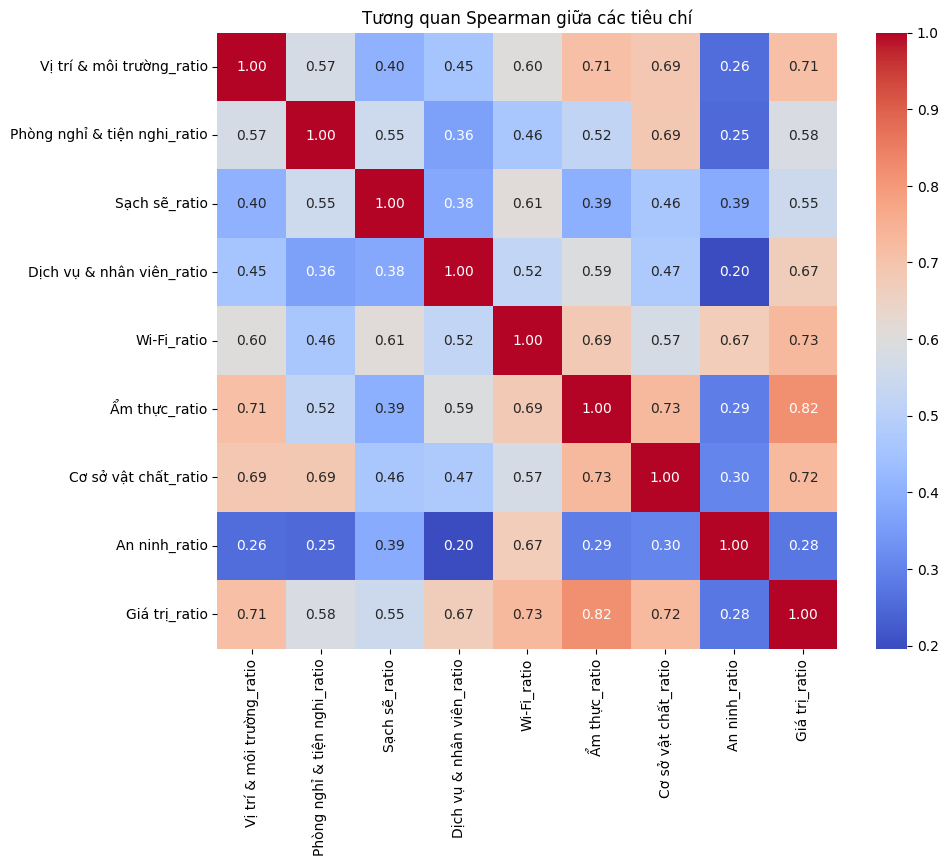


Đã lưu heatmap tương quan vào 'correlation_matrix_step3.png'


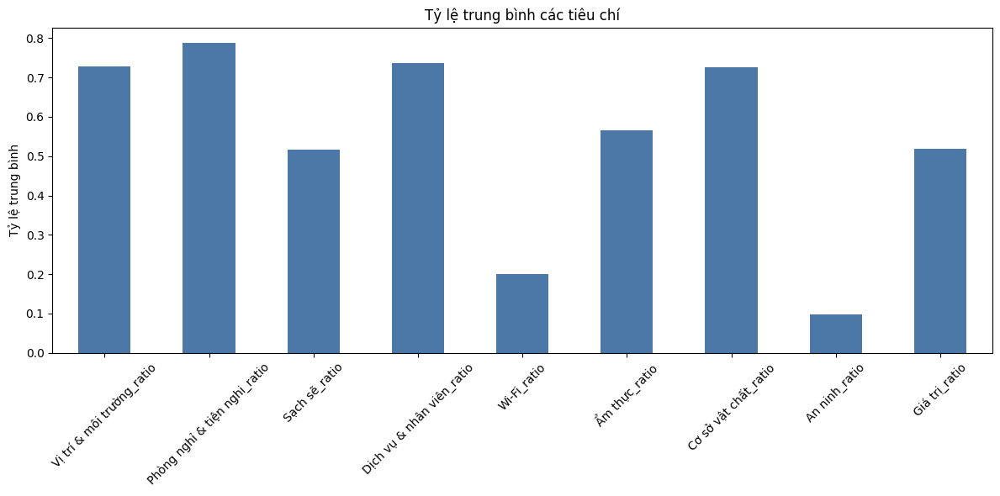


Đã lưu biểu đồ cột vào 'mean_ratio_bar_step3.png'

Đã lưu thống kê mô tả vào 'stats_summary_step3.csv'


In [18]:

# Đọc df_ratios từ Bước 2
try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    print("\nĐã đọc df_ratios từ 'df_ratios_step2.csv'")
except FileNotFoundError:
    print("\nLỗi: Không tìm thấy 'df_ratios_step2.csv'. Vui lòng chạy Bước 2 trước.")
    exit()

try:
    df_ratios, ratio_columns = overall_analysis(df_ratios, criteria)
except Exception as e:
    print(f"Lỗi khi chạy bước 3: {str(e)}")

In [19]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns

def local_analysis(df_ratios, criteria, ratio_columns):
    """
    Phân tích cục bộ: Theo số sao, giá phòng, và kiểm định thống kê.
    """
    # Kiểm tra cột
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    missing_ratios = [col for col in ratio_columns if col not in df_ratios.columns]
    if missing_ratios:
        raise ValueError(f"Các cột tỷ lệ thiếu trong df_ratios: {missing_ratios}")
    
    # 1. Theo số sao
    print("\nTỷ lệ trung bình theo số sao:")
    star_group = df_ratios.groupby('stars_rating')[ratio_columns].mean().round(4)
    print(star_group)
    star_group.to_csv('star_group_step4.csv')
    print("\nĐã lưu tỷ lệ theo số sao vào 'star_group_step4.csv'")
    
    # Kiểm định Kruskal-Wallis
    print("\nKiểm tra Kruskal-Wallis theo số sao:")
    kruskal_results = {}
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['stars_rating'] == s][col].dropna() 
                  for s in df_ratios['stars_rating'].unique() if len(df_ratios[df_ratios['stars_rating'] == s][col].dropna()) > 0]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            kruskal_results[col] = {'stat': stat, 'p_value': p_value}
            print(f"{col}: stat={stat:.2f}, p-value={p_value:.4f}")

    # Lưu kết quả Kruskal-Wallis
    pd.DataFrame(kruskal_results).T.to_csv('kruskal_results_step4.csv')
    print("\nĐã lưu kết quả Kruskal-Wallis vào 'kruskal_results_step4.csv'")
    
    # Trực quan hóa: Boxplot theo số sao cho tiêu chí tiêu biểu
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='stars_rating', y='Phòng nghỉ & tiện nghi_ratio', data=df_ratios)
    plt.title('Phòng nghỉ & tiện nghi theo số sao')
    plt.show()
    plt.close()
    print("\nĐã lưu boxplot theo số sao vào 'boxplot_stars_step4.png'")
    
    # 2. Theo giá phòng
    df_ratios['price_group'] = pd.cut(df_ratios['avg_price'], 
                                     bins=[0, 1000000, 2000000, float('inf')],
                                     labels=['Thấp (<1M)', 'Trung bình (1-2M)', 'Cao (>2M)'])
    print("\nTỷ lệ trung bình theo nhóm giá:")
    price_group = df_ratios.groupby('price_group')[ratio_columns].mean().round(4)
    print(price_group)
    price_group.to_csv('price_group_step4.csv')
    print("\nĐã lưu tỷ lệ theo nhóm giá vào 'price_group_step4.csv'")
    
    # Trực quan hóa: Biểu đồ cột theo nhóm giá
    price_group.plot(kind='bar', figsize=(12, 6))
    plt.title('Tỷ lệ trung bình theo nhóm giá')
    plt.xticks(rotation=0)
    plt.ylabel('Tỷ lệ trung bình')
    plt.tight_layout()
    plt.show()
    plt.close()
    print("\nĐã lưu biểu đồ cột theo nhóm giá vào 'bar_price_step4.png'")
    
    # 3. Hồi quy tuyến tính: Ảnh hưởng của giá phòng
    print("\nHồi quy tuyến tính (giá phòng ảnh hưởng đến tỷ lệ):")
    X = df_ratios[['avg_price']].fillna(df_ratios['avg_price'].mean())
    regression_results = {}
    for col in ratio_columns:
        y = df_ratios[col].fillna(0)
        model = LinearRegression().fit(X, y)
        regression_results[col] = {'coef': model.coef_[0], 'r2': model.score(X, y)}
        print(f"{col}: Hệ số={model.coef_[0]:.4e}, R^2={model.score(X, y):.4f}")
    
    # Lưu kết quả hồi quy
    pd.DataFrame(regression_results).T.to_csv('regression_results_step4.csv')
    print("\nĐã lưu kết quả hồi quy vào 'regression_results_step4.csv'")

    return df_ratios, ratio_columns



Đã đọc df_ratios từ 'df_ratios_step2.csv'

Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Tỷ lệ trung bình theo số sao:
                Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
stars_rating                                                              
1.0                                0.6991                        0.7762   
2.0                                0.6934         

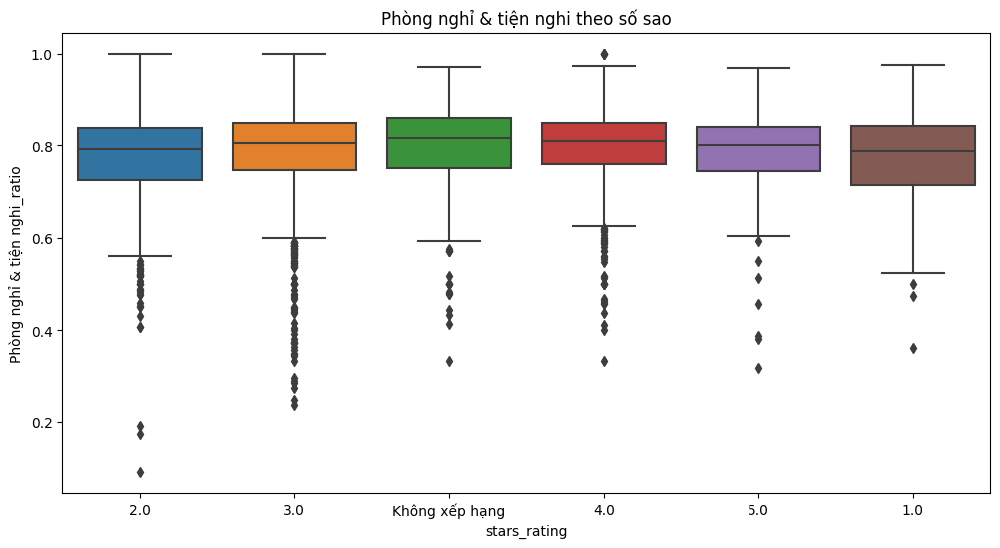


Đã lưu boxplot theo số sao vào 'boxplot_stars_step4.png'

Tỷ lệ trung bình theo nhóm giá:
                   Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
price_group                                                                  
Thấp (<1M)                            0.6987                        0.7782   
Trung bình (1-2M)                     0.7337                        0.7889   
Cao (>2M)                             0.7647                        0.7986   

                   Sạch sẽ_ratio  Dịch vụ & nhân viên_ratio  Wi-Fi_ratio  \
price_group                                                                
Thấp (<1M)                0.5076                     0.7301       0.1668   
Trung bình (1-2M)         0.5173                     0.7249       0.1942   
Cao (>2M)                 0.5248                     0.7566       0.2474   

                   Ẩm thực_ratio  Cơ sở vật chất_ratio  An ninh_ratio  \
price_group                                                     

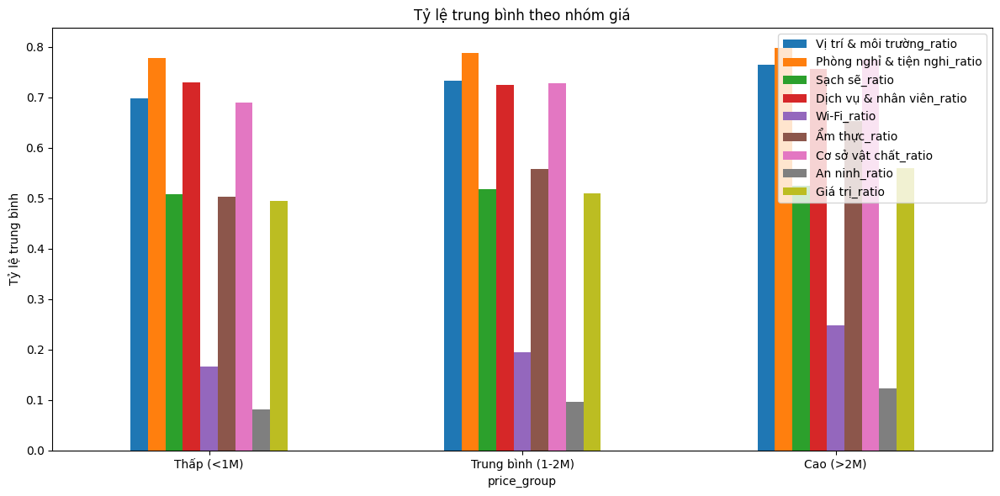


Đã lưu biểu đồ cột theo nhóm giá vào 'bar_price_step4.png'

Hồi quy tuyến tính (giá phòng ảnh hưởng đến tỷ lệ):
Vị trí & môi trường_ratio: Hệ số=6.1160e-09, R^2=0.0293
Phòng nghỉ & tiện nghi_ratio: Hệ số=2.1392e-09, R^2=0.0069
Sạch sẽ_ratio: Hệ số=1.2098e-09, R^2=0.0013
Dịch vụ & nhân viên_ratio: Hệ số=4.6963e-09, R^2=0.0158
Wi-Fi_ratio: Hệ số=7.9129e-09, R^2=0.0484
Ẩm thực_ratio: Hệ số=1.4615e-08, R^2=0.0924
Cơ sở vật chất_ratio: Hệ số=8.4409e-09, R^2=0.0621
An ninh_ratio: Hệ số=3.7794e-09, R^2=0.0103
Giá trị_ratio: Hệ số=8.0830e-09, R^2=0.0450

Đã lưu kết quả hồi quy vào 'regression_results_step4.csv'


In [20]:

# Chạy bước 4

ratio_columns = [f'{crit}_ratio' for crit in criteria]

# Đọc df_ratios từ Bước 3
try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    print("\nĐã đọc df_ratios từ 'df_ratios_step2.csv'")
except FileNotFoundError:
    print("\nLỗi: Không tìm thấy 'df_ratios_step2.csv'. Vui lòng chạy Bước 2 trước.")
    exit()

df_ratios, ratio_columns = local_analysis(df_ratios, criteria, ratio_columns)



Đã đọc df_ratios từ 'df_ratios_step2.csv'

Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Tỷ lệ trung bình theo cụm:
         Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
cluster                                                            
0                           0.8196                        0.8457   
1                           0.7827                        0.8156   
2     

C:\Users\nguye\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


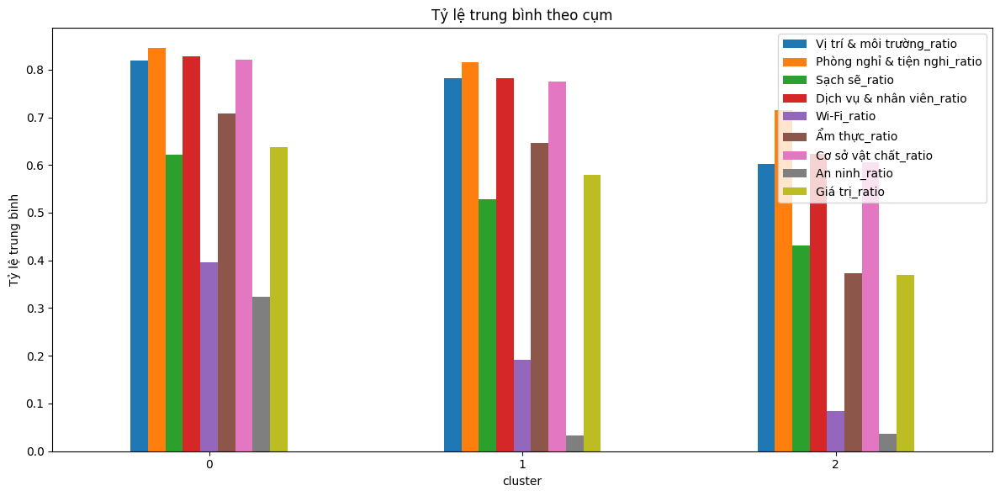


Đã lưu biểu đồ cột theo cụm vào 'bar_cluster_step5.png'


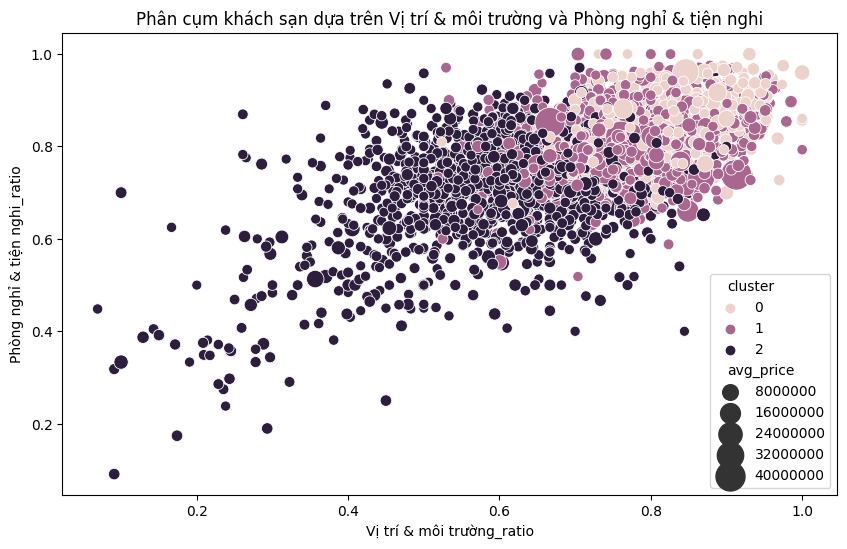


Đã lưu scatter plot theo cụm vào 'scatter_cluster_step5.png'


In [23]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

def cluster_analysis(df_ratios, criteria, ratio_columns, n_clusters=3):
    """
    Phân cụm khách sạn dựa trên tỷ lệ đánh giá.
    """
    # Kiểm tra cột
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    missing_ratios = [col for col in ratio_columns if col not in df_ratios.columns]
    if missing_ratios:
        raise ValueError(f"Các cột tỷ lệ thiếu trong df_ratios: {missing_ratios}")
    
    # Chuẩn bị dữ liệu cho phân cụm
    X = df_ratios[ratio_columns].fillna(0)
    
    # Phân cụm K-means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_ratios['cluster'] = kmeans.fit_predict(X)
    
    # Phân tích cụm
    print("\nTỷ lệ trung bình theo cụm:")
    cluster_summary = df_ratios.groupby('cluster')[ratio_columns].mean().round(4)
    print(cluster_summary)
    cluster_summary.to_csv('cluster_summary_step5.csv')
    print("\nĐã lưu tỷ lệ theo cụm vào 'cluster_summary_step5.csv'")
    
    # Đặc điểm cụm
    print("\nĐặc điểm mỗi cụm:")
    for cluster in range(n_clusters):
        cluster_data = df_ratios[df_ratios['cluster'] == cluster]
        print(f"\nCụm {cluster} ({len(cluster_data)} khách sạn):")
        print(f"Số sao phổ biến: {cluster_data['stars_rating'].mode()[0]}")
        print(f"Giá phòng trung bình: {cluster_data['avg_price'].mean():.2f} VND")
        print(f"Tỷ lệ trung bình:\n{cluster_data[ratio_columns].mean().round(4)}")
    
    # Trực quan hóa: Biểu đồ cột cho cụm
    cluster_summary.plot(kind='bar', figsize=(12, 6))
    plt.title('Tỷ lệ trung bình theo cụm')
    plt.xticks(rotation=0)
    plt.ylabel('Tỷ lệ trung bình')
    plt.tight_layout()
    plt.show()
    plt.close()
    print("\nĐã lưu biểu đồ cột theo cụm vào 'bar_cluster_step5.png'")
    
    # Trực quan hóa: Scatter plot (ví dụ: Vị trí & môi trường vs. Phòng nghỉ & tiện nghi)
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='Vị trí & môi trường_ratio', y='Phòng nghỉ & tiện nghi_ratio', 
                    hue='cluster', size='avg_price', sizes=(50, 500), data=df_ratios)
    plt.title('Phân cụm khách sạn dựa trên Vị trí & môi trường và Phòng nghỉ & tiện nghi')
    plt.show()
    plt.close()
    print("\nĐã lưu scatter plot theo cụm vào 'scatter_cluster_step5.png'")
    
    return df_ratios, ratio_columns



ratio_columns = [f'{crit}_ratio' for crit in criteria]

# Đọc df_ratios từ Bước 4
try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    print("\nĐã đọc df_ratios từ 'df_ratios_step2.csv'")
except FileNotFoundError:
    print("\nLỗi: Không tìm thấy 'df_ratios_step2.csv'. Vui lòng chạy Bước 2 trước.")
    exit()

try:
    df_ratios, ratio_columns = cluster_analysis(df_ratios, criteria, ratio_columns)
except Exception as e:
    print(f"Lỗi khi chạy bước 5: {str(e)}")

In [37]:
from scipy import stats
from itertools import combinations

print("\nKiểm tra mann_whitney_u theo số sao:")
mann_whitney_u = {}

for col in ratio_columns:
    mann_whitney_u[col] = {}
    
    # Lọc các nhóm có dữ liệu
    available_groups = {
        s: df_ratios[df_ratios['stars_rating'] == s][col].dropna()
        for s in df_ratios['stars_rating'].unique()
        if len(df_ratios[df_ratios['stars_rating'] == s][col].dropna()) > 0
    }

    # So sánh từng cặp
    for (s1, s2) in combinations(available_groups.keys(), 2):
        group1 = available_groups[s1]
        group2 = available_groups[s2]

        stat, p_value = stats.mannwhitneyu(group1, group2, alternative='two-sided')
        mann_whitney_u[col][(s1, s2)] = {'stat': stat, 'p_value': p_value}
        print(f"{col} ({s1}⭐ vs {s2}⭐): stat={stat:.2f}, p-value={p_value:.4f}")



Kiểm tra mann_whitney_u theo số sao:
Vị trí & môi trường_ratio (Không xếp hạng⭐ vs 4.0⭐): stat=249914.50, p-value=0.1225
Vị trí & môi trường_ratio (Không xếp hạng⭐ vs 3.0⭐): stat=413117.00, p-value=0.2670
Vị trí & môi trường_ratio (Không xếp hạng⭐ vs 2.0⭐): stat=248667.00, p-value=0.0000
Vị trí & môi trường_ratio (Không xếp hạng⭐ vs 5.0⭐): stat=90464.50, p-value=0.6614
Vị trí & môi trường_ratio (Không xếp hạng⭐ vs 1.0⭐): stat=64936.00, p-value=0.0000
Vị trí & môi trường_ratio (4.0⭐ vs 3.0⭐): stat=945553.50, p-value=0.0002
Vị trí & môi trường_ratio (4.0⭐ vs 2.0⭐): stat=570659.00, p-value=0.0000
Vị trí & môi trường_ratio (4.0⭐ vs 5.0⭐): stat=207809.50, p-value=0.3015
Vị trí & môi trường_ratio (4.0⭐ vs 1.0⭐): stat=149505.00, p-value=0.0000
Vị trí & môi trường_ratio (3.0⭐ vs 2.0⭐): stat=803999.00, p-value=0.0000
Vị trí & môi trường_ratio (3.0⭐ vs 5.0⭐): stat=288666.00, p-value=0.0969
Vị trí & môi trường_ratio (3.0⭐ vs 1.0⭐): stat=210494.50, p-value=0.0001
Vị trí & môi trường_ratio (2.0⭐ v

In [21]:
import scikit_posthocs as sp

# Data cần ở dạng DataFrame với cột group và value
for col in ratio_columns:
    data = df_ratios[[col, 'stars_rating']].dropna()
    data.columns = ['value', 'group']
    posthoc = sp.posthoc_dunn(data, val_col='value', group_col='group', p_adjust='bonferroni')
    print(f"\nPost-hoc Dunn test for {col}:")
    print(posthoc)



Post-hoc Dunn test for Vị trí & môi trường_ratio:
                         1.0           2.0           3.0           4.0  \
1.0             1.000000e+00  1.000000e+00  6.658935e-04  2.815167e-08   
2.0             1.000000e+00  1.000000e+00  7.757572e-11  8.237006e-21   
3.0             6.658935e-04  7.757572e-11  1.000000e+00  1.872243e-03   
4.0             2.815167e-08  8.237006e-21  1.872243e-03  1.000000e+00   
5.0             5.128412e-05  3.373593e-09  1.000000e+00  1.000000e+00   
Không xếp hạng  2.263932e-04  1.000831e-08  1.000000e+00  1.000000e+00   

                         5.0  Không xếp hạng  
1.0             5.128412e-05    2.263932e-04  
2.0             3.373593e-09    1.000831e-08  
3.0             1.000000e+00    1.000000e+00  
4.0             1.000000e+00    1.000000e+00  
5.0             1.000000e+00    1.000000e+00  
Không xếp hạng  1.000000e+00    1.000000e+00  

Post-hoc Dunn test for Phòng nghỉ & tiện nghi_ratio:
                     1.0       2.0       3.0   

#### REVIEW - STAR




Đã đọc df_ratios từ 'df_ratios_step2.csv'

Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Khoảng tin cậy 95% cho tỷ lệ trung bình:
Vị trí & môi trường_ratio: Mean=0.7289, CI=[0.7251, 0.7327]
Phòng nghỉ & tiện nghi_ratio: Mean=0.7875, CI=[0.7847, 0.7903]
Sạch sẽ_ratio: Mean=0.5156, CI=[0.5120, 0.5192]
Dịch vụ & nhân viên_ratio: Mean=0.7374, CI=[0.7334, 0.7414]
Wi-Fi_ratio: Mean=0.1998, CI=[0.1

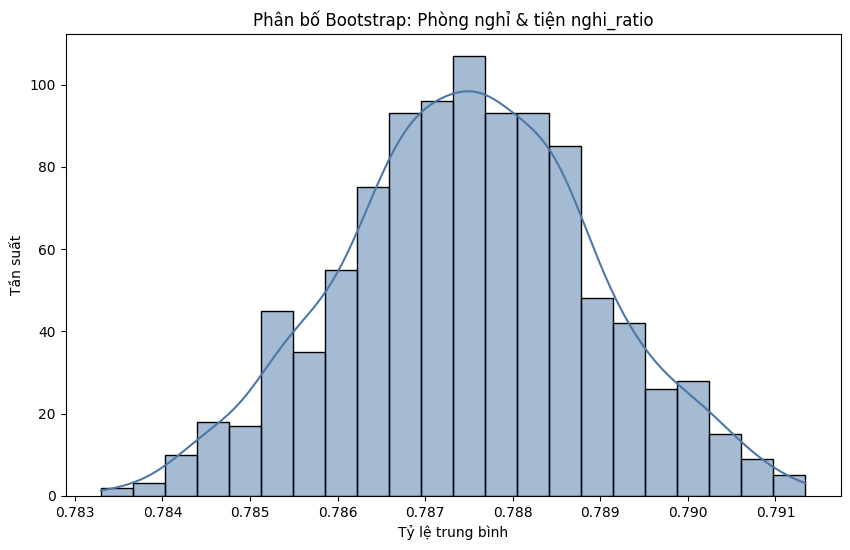


Đã lưu histogram Bootstrap vào '/bootstrap_hist_step1.png'

Độ ổn định trong mẫu (Subsampling_SD):
Vị trí & môi trường_ratio: Mean=0.7289, Sample_SD=0.1324, Subsampling_SD=0.0010
Phòng nghỉ & tiện nghi_ratio: Mean=0.7875, Sample_SD=0.0957, Subsampling_SD=0.0007
Sạch sẽ_ratio: Mean=0.5156, Sample_SD=0.1234, Subsampling_SD=0.0009
Dịch vụ & nhân viên_ratio: Mean=0.7374, Sample_SD=0.1385, Subsampling_SD=0.0010
Wi-Fi_ratio: Mean=0.1998, Sample_SD=0.1333, Subsampling_SD=0.0010
Ẩm thực_ratio: Mean=0.5657, Sample_SD=0.1783, Subsampling_SD=0.0013
Cơ sở vật chất_ratio: Mean=0.7268, Sample_SD=0.1256, Subsampling_SD=0.0009
An ninh_ratio: Mean=0.0983, Sample_SD=0.1378, Subsampling_SD=0.0010
Giá trị_ratio: Mean=0.5196, Sample_SD=0.1413, Subsampling_SD=0.0010

Đã lưu độ ổn định trong mẫu vào '/stability_results_step1.csv'

Hệ số biến thiên (CV) cho tỷ lệ:
Vị trí & môi trường_ratio: Mean=0.7289, Std=0.1324, CV=0.1816
Phòng nghỉ & tiện nghi_ratio: Mean=0.7875, Std=0.0957, CV=0.1215
Sạch sẽ_ratio: Mean

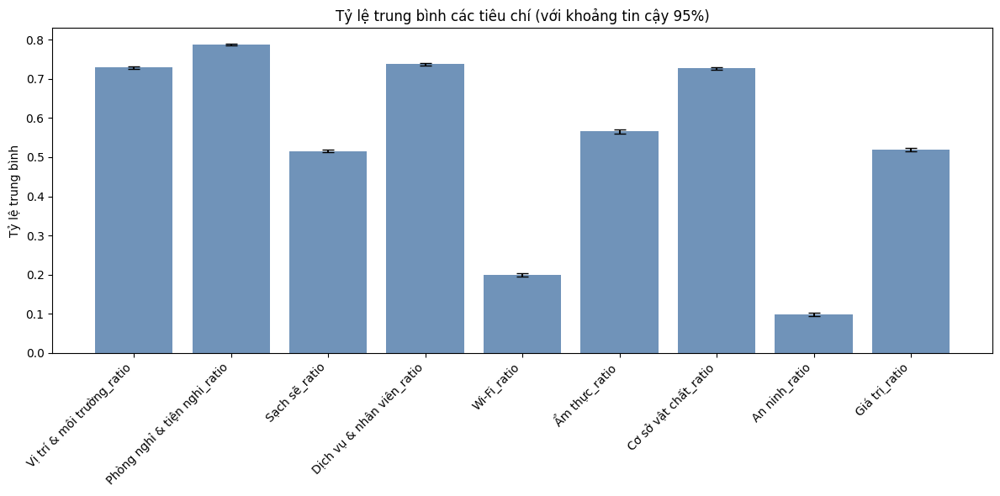


Đã lưu biểu đồ cột vào '/mean_ratio_bar_step1.png'


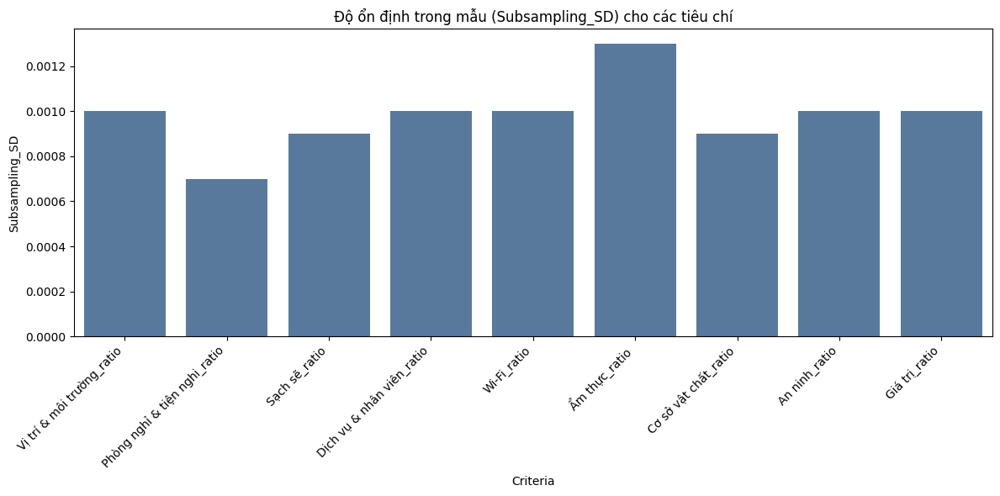


Đã lưu biểu đồ Subsampling_SD vào '/subsampling_sd_bar_step1.png'


In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


def overall_statistical_analysis(df_ratios, criteria, ratio_columns):
    """
    Phân tích tổng thể với kiểm định thống kê: Confidence Interval, Bootstrap, Within-sample stability (Subsampling_SD).
    
    Parameters:
    - df_ratios: DataFrame chứa tỷ lệ _ratio của các tiêu chí.
    - criteria: Danh sách tên tiêu chí (ví dụ: ['Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', ...]).
    - ratio_columns: Danh sách cột _ratio tương ứng (ví dụ: ['Vị trí & môi trường_ratio', ...]).
    - Thư mục lưu kết quả (mặc định: 'overall_analysis').
    
    Returns:
    - df_ratios: DataFrame đầu vào.
    - ci_df: DataFrame chứa CI 95%.
    - bootstrap_ci_df: DataFrame chứa Bootstrap CI 95%.
    - stability_df: DataFrame chứa Subsampling_SD.
    - cv_df: DataFrame chứa CV.
    """
    
    # Kiểm tra cột
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    missing_ratios = [col for col in ratio_columns if col not in df_ratios.columns]
    if missing_ratios:
        raise ValueError(f"Các cột tỷ lệ thiếu trong df_ratios: {missing_ratios}")
    
    # 1. Khoảng tin cậy 95%
    print("\nKhoảng tin cậy 95% cho tỷ lệ trung bình:")
    ci_results = {}
    n = len(df_ratios)
    z = 1.96  # z-score cho 95%
    for col in ratio_columns:
        data = df_ratios[col].dropna()
        mean = data.mean()
        std = data.std()
        se = std / np.sqrt(len(data)) if len(data) > 0 else 0  # Standard error
        ci_lower = mean - z * se
        ci_upper = mean + z * se
        ci_results[col] = {'Mean': mean, 'Std': std, 'CI_Lower': ci_lower, 'CI_Upper': ci_upper}
        print(f"{col}: Mean={mean:.4f}, CI=[{ci_lower:.4f}, {ci_upper:.4f}]")
    
    ci_df = pd.DataFrame(ci_results).T.round(4)
    ci_df.to_csv('ci_results_step1.csv')
    print(f"\nĐã lưu khoảng tin cậy vào '/ci_results_step1.csv'")
    
    # 2. Bootstrap CI 95%
    print("\nBootstrap (1,000 lần tái lấy mẫu):")
    n_bootstrap = 1000
    bootstrap_results = {col: [] for col in ratio_columns}
    for _ in range(n_bootstrap):
        sample = df_ratios[ratio_columns].sample(n, replace=True)
        for col in ratio_columns:
            bootstrap_results[col].append(sample[col].mean())
    
    bootstrap_ci = {}
    for col in ratio_columns:
        means = np.array(bootstrap_results[col])
        ci_lower = np.percentile(means, 2.5)
        ci_upper = np.percentile(means, 97.5)
        bootstrap_ci[col] = {'Mean': means.mean(), 'CI_Lower': ci_lower, 'CI_Upper': ci_upper}
        print(f"{col}: Bootstrap Mean={means.mean():.4f}, CI=[{ci_lower:.4f}, {ci_upper:.4f}]")
    
    bootstrap_ci_df = pd.DataFrame(bootstrap_ci).T.round(4)
    bootstrap_ci_df.to_csv('bootstrap_ci_step1.csv')
    print(f"\nĐã lưu khoảng tin cậy Bootstrap vào '/bootstrap_ci_step1.csv'")
    
    # Trực quan hóa: Phân bố Bootstrap cho tiêu chí tiêu biểu
    plt.figure(figsize=(10, 6))
    sns.histplot(bootstrap_results['Phòng nghỉ & tiện nghi_ratio'], kde=True, color='#4C78A8')
    plt.title('Phân bố Bootstrap: Phòng nghỉ & tiện nghi_ratio')
    plt.xlabel('Tỷ lệ trung bình')
    plt.ylabel('Tần suất')
    plt.show()
    plt.close()
    print(f"\nĐã lưu histogram Bootstrap vào '/bootstrap_hist_step1.png'")
    
    # 3. Độ ổn định trong mẫu (Subsampling_SD)
    print("\nĐộ ổn định trong mẫu (Subsampling_SD):")
    def subsampling_stability(data, n_sub=1000, frac=0.8):
        sub_means = []
        n = int(len(data) * frac)
        for _ in range(n_sub):
            sub_sample = np.random.choice(data, size=n, replace=False)
            sub_means.append(np.mean(sub_sample))
        return np.std(sub_means)
    
    stability_results = []
    for col in ratio_columns:
        data = df_ratios[col].dropna()
        mean = data.mean()
        std = data.std()
        subsampling_sd = subsampling_stability(data)
        stability_results.append({
            'Criteria': col,
            'Mean': mean,
            'Sample_SD': std,
            'Subsampling_SD': subsampling_sd
        })
        print(f"{col}: Mean={mean:.4f}, Sample_SD={std:.4f}, Subsampling_SD={subsampling_sd:.4f}")
    
    stability_df = pd.DataFrame(stability_results).round(4)
    stability_df.to_csv('stability_results_step1.csv')
    print(f"\nĐã lưu độ ổn định trong mẫu vào '/stability_results_step1.csv'")
    
    # 4. Hệ số biến thiên (CV)
    print("\nHệ số biến thiên (CV) cho tỷ lệ:")
    cv_results = {}
    for col in ratio_columns:
        mean = df_ratios[col].mean()
        std = df_ratios[col].std()
        cv = std / mean if mean != 0 else np.nan
        cv_results[col] = {'Mean': mean, 'Std': std, 'CV': cv}
        print(f"{col}: Mean={mean:.4f}, Std={std:.4f}, CV={cv:.4f}")
    
    cv_df = pd.DataFrame(cv_results).T.round(4)
    cv_df.to_csv('cv_results_step1.csv')
    print(f"\nĐã lưu hệ số biến thiên vào '/cv_results_step1.csv'")
    
    # 5. Trực quan hóa: Biểu đồ cột tỷ lệ trung bình với CI
    plt.figure(figsize=(12, 6))
    means = ci_df['Mean']
    errors = ci_df['CI_Upper'] - means
    plt.bar(means.index, means, yerr=errors, capsize=5, color='#4C78A8', alpha=0.8)
    plt.title('Tỷ lệ trung bình các tiêu chí (với khoảng tin cậy 95%)')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Tỷ lệ trung bình')
    plt.tight_layout()
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ cột vào '/mean_ratio_bar_step1.png'")
    
    # 6. Trực quan hóa: So sánh Subsampling_SD
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Criteria', y='Subsampling_SD', data=stability_df, color='#4C78A8')
    plt.title('Độ ổn định trong mẫu (Subsampling_SD) cho các tiêu chí')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Subsampling_SD')
    plt.tight_layout()
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ Subsampling_SD vào '/subsampling_sd_bar_step1.png'")
    
    return df_ratios, ci_df, bootstrap_ci_df, stability_df, cv_df


# Chạy bước 1
if __name__ == "__main__":
    # Danh sách tiêu chí
    criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]

    ratio_columns = [f'{crit}_ratio' for crit in criteria]
    
    # Đọc df_ratios
    try:
        df_ratios = pd.read_csv('df_ratios_step2.csv')
        print("\nĐã đọc df_ratios từ 'df_ratios_step2.csv'")
    except FileNotFoundError:
        print("\nLỗi: Không tìm thấy 'df_ratios_step2.csv'. Vui lòng cung cấp file.")
        exit()
    
    try:
        df_ratios, ratio_columns, ci_df, bootstrap_ci_df, cv_df = overall_statistical_analysis(df_ratios, criteria, ratio_columns)
    except Exception as e:
        print(f"Lỗi khi chạy bước 1: {str(e)}")


Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Tỷ lệ trung bình theo số sao:
                Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
stars_rating                                                              
1.0                                0.6991                        0.7762   
2.0                                0.6934                        0.7729   
3.0               

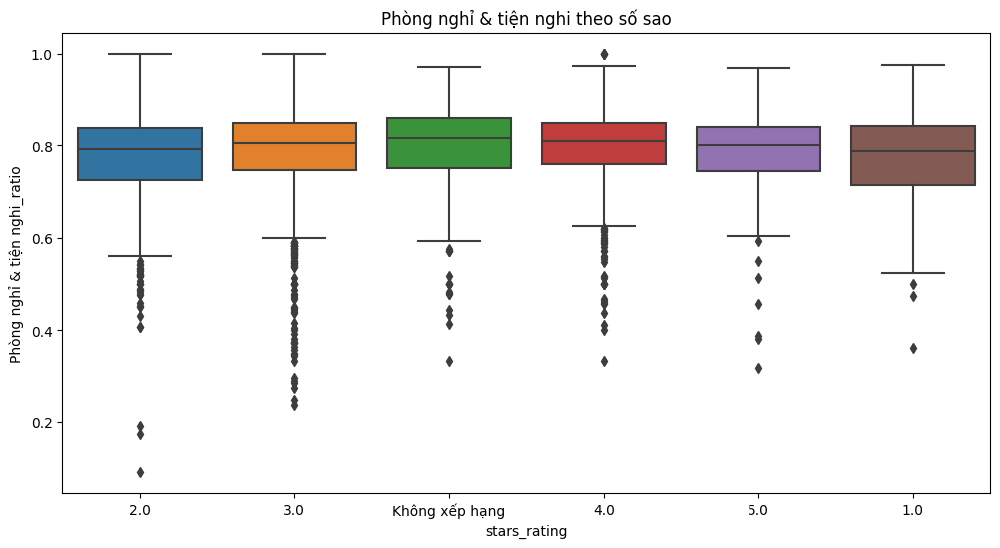

In [54]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def local_statistical_analysis(df_ratios, criteria, ratio_columns):
    """
    Phân tích cục bộ theo số sao với Confidence Interval, Bootstrap, CV, và Kruskal-Wallis.
    """
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    
    # 1. Tỷ lệ trung bình theo số sao
    print("\nTỷ lệ trung bình theo số sao:")
    star_group = df_ratios.groupby('stars_rating')[ratio_columns].mean().round(4)
    print(star_group)
    star_group.to_csv('star_group_step2.csv')
    
    # 2. Khoảng tin cậy 95% theo số sao
    print("\nKhoảng tin cậy 95% theo số sao:")
    ci_star = {}
    z = 1.96
    for star in df_ratios['stars_rating'].unique():
        df_star = df_ratios[df_ratios['stars_rating'] == star]
        n = len(df_star)
        if n > 1:
            for col in ratio_columns:
                mean = df_star[col].mean()
                std = df_star[col].std()
                se = std / np.sqrt(n)
                ci_lower = mean - z * se
                ci_upper = mean + z * se
                ci_star[(star, col)] = {'mean': mean, 'ci_lower': ci_lower, 'ci_upper': ci_upper}
                print(f"Star={star}, {col}: Mean={mean:.4f}, CI=[{ci_lower:.4f}, {ci_upper:.4f}]")
    
    ci_star_df = pd.DataFrame(ci_star).T
    ci_star_df.to_csv('ci_star_step2.csv')
    
    # 3. Kruskal-Wallis
    print("\nKiểm định Kruskal-Wallis:")
    kruskal_results = {}
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['stars_rating'] == s][col].dropna() 
                  for s in df_ratios['stars_rating'].unique() if len(df_ratios[df_ratios['stars_rating'] == s][col].dropna()) > 0]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            kruskal_results[col] = {'stat': stat, 'p_value': p_value}
            print(f"{col}: stat={stat:.2f}, p-value={p_value:.4f}")
    
    pd.DataFrame(kruskal_results).T.to_csv('kruskal_results_step2.csv')
    
    # 4. Trực quan hóa
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='stars_rating', y='Phòng nghỉ & tiện nghi_ratio', data=df_ratios)
    plt.title('Phòng nghỉ & tiện nghi theo số sao')
    plt.show()
    plt.close()


ratio_columns = [f'{crit}_ratio' for crit in criteria]

try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    local_statistical_analysis(df_ratios, criteria, ratio_columns)
except Exception as e:
    print(f"Lỗi: {str(e)}")


Cột trong df_ratios: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Kiểm định Mann-Whitney U cho Vị trí & môi trường_ratio:
2.0 vs. 3.0: stat=575764.00, p-value=1.3605e-11, significant=True, effect_size=0.1654
2.0 vs. Không xếp hạng: stat=167210.00, p-value=2.2477e-09, significant=True, effect_size=0.1959
2.0 vs. 4.0: stat=335631.00, p-value=1.6084e-22, significant=True, effect_size=0.2593
2.0 vs. 5.0: stat=12040

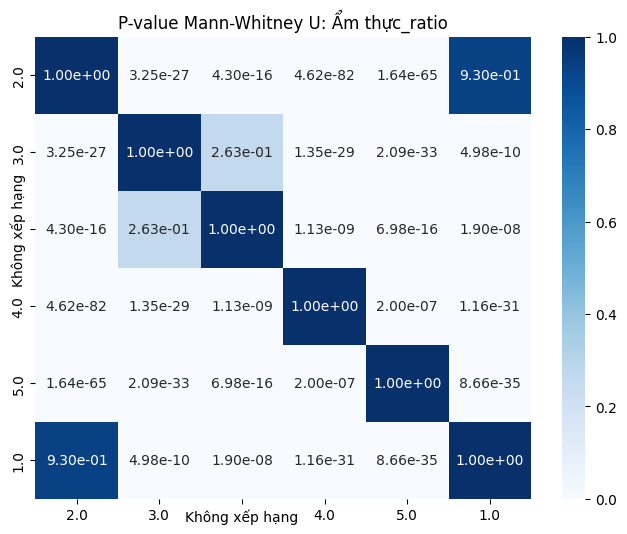


Đã lưu heatmap p-value vào 'heatmap_pairwise_step2.png'


In [55]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

def pairwise_comparison(df_ratios, criteria, ratio_columns):
    """
    Phân tích cặp sao với Mann-Whitney U, hiệu chỉnh Bonferroni, và kích thước hiệu ứng.
    """
    # Kiểm tra cột
    print("\nCột trong df_ratios:", df_ratios.columns.tolist())
    
    # Danh sách sao
    stars = df_ratios['stars_rating'].unique()
    pairs = list(combinations(stars, 2))
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs  # Hiệu chỉnh Bonferroni
    
    # Kiểm định Mann-Whitney U
    pairwise_results = {col: [] for col in ratio_columns}
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for star1, star2 in pairs:
            group1 = df_ratios[df_ratios['stars_rating'] == star1][col].dropna()
            group2 = df_ratios[df_ratios['stars_rating'] == star2][col].dropna()
            if len(group1) > 0 and len(group2) > 0:
                stat, p_value = stats.mannwhitneyu(group1, group2, alternative='two-sided')
                # Tính kích thước hiệu ứng (rank-biserial correlation)
                n1, n2 = len(group1), len(group2)
                r = 1 - (2 * stat) / (n1 * n2)
                # Lưu kết quả
                pairwise_results[col].append({
                    'pair': f'{star1} vs. {star2}',
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                print(f"{star1} vs. {star2}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
    
    # Lưu kết quả
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(f'pairwise_{col}_step2.csv')
        print(f"\nĐã lưu kết quả Mann-Whitney U cho {col} vào 'pairwise_{col}_step2.csv'")
    
    # Trực quan hóa: Heatmap p-value cho tiêu chí tiêu biểu
    p_matrix = np.ones((len(stars), len(stars)))
    for col in ['Ẩm thực_ratio']:  # Ví dụ với Ẩm thực
        for i, star1 in enumerate(stars):
            for j, star2 in enumerate(stars):
                if star1 != star2:
                    for res in pairwise_results[col]:
                        if res['pair'] == f'{star1} vs. {star2}' or res['pair'] == f'{star2} vs. {star1}':
                            p_matrix[i, j] = res['p_value']
    plt.figure(figsize=(8, 6))
    sns.heatmap(p_matrix, xticklabels=stars, yticklabels=stars, annot=True, fmt='.2e', cmap='Blues')
    plt.title('P-value Mann-Whitney U: Ẩm thực_ratio')
    plt.show()
    plt.close()
    print("\nĐã lưu heatmap p-value vào 'heatmap_pairwise_step2.png'")
    
    return pairwise_results


ratio_columns = [f'{crit}_ratio' for crit in criteria]

try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    pairwise_results = pairwise_comparison(df_ratios, criteria, ratio_columns)
except Exception as e:
    print(f"Lỗi: {str(e)}")


Cột trong df_ratios sau khi lọc: ['id', 'review_count', 'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị', 'avg_price', 'num_rooms', 'stars_rating', 'An ninh_positive', 'Cơ sở vật chất_positive', 'Dịch vụ & nhân viên_positive', 'Giá trị_positive', 'Phòng nghỉ & tiện nghi_positive', 'Sạch sẽ_positive', 'Vị trí & môi trường_positive', 'Wi-Fi_positive', 'Ẩm thực_positive', 'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio', 'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio', 'Wi-Fi_ratio', 'Ẩm thực_ratio', 'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio']

Số lượng khách sạn theo số sao:
1.0     222
2.0     847
3.0    1629
4.0    1070
5.0     375
Name: stars_rating, dtype: int64

Tỷ lệ trung bình theo số sao:
              Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
stars_rating                                                            
1.0                              0

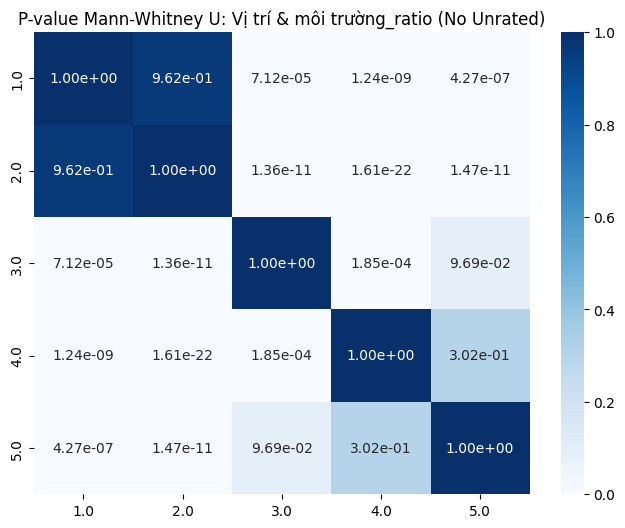


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


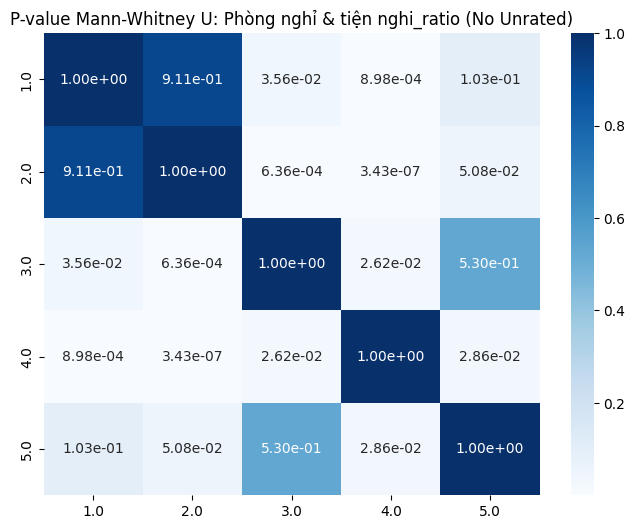


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


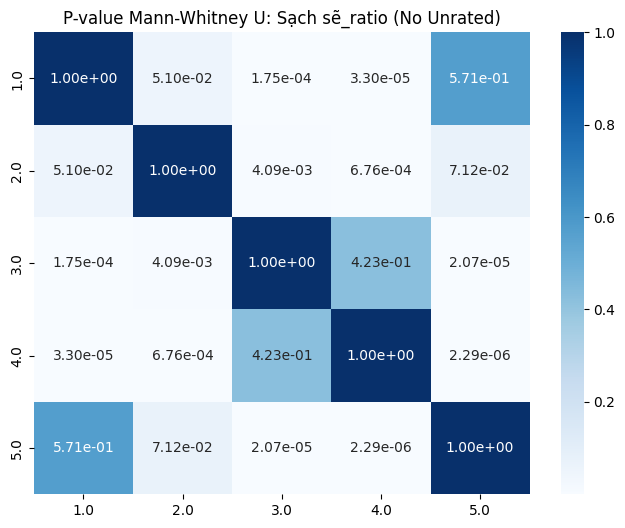


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


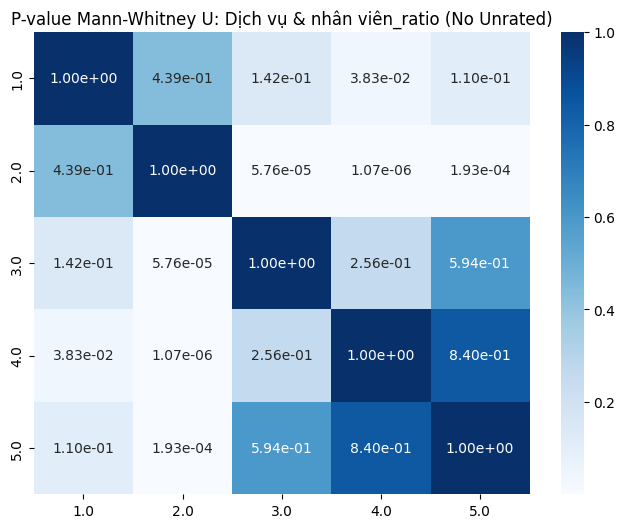


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


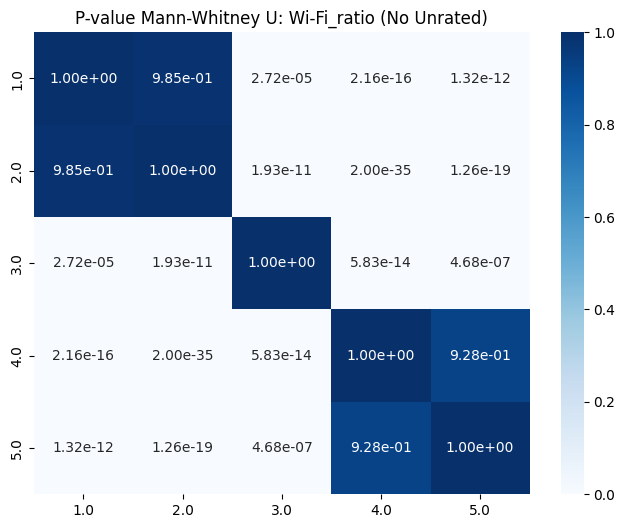


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


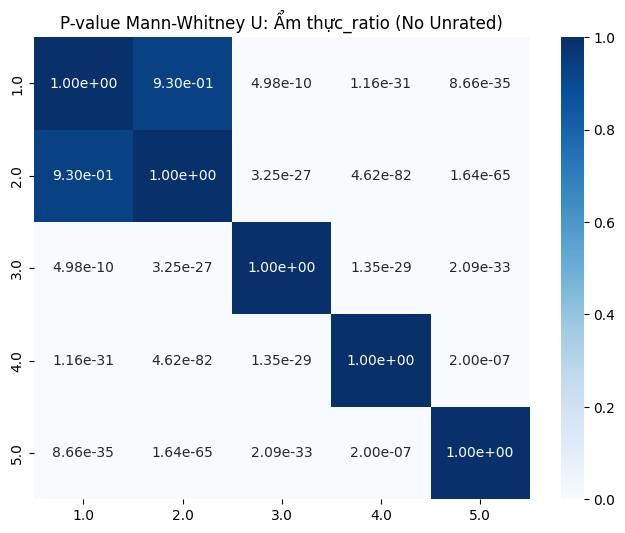


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


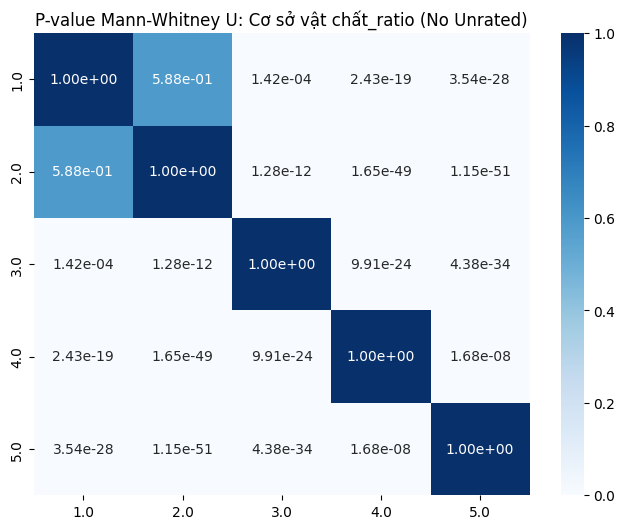


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


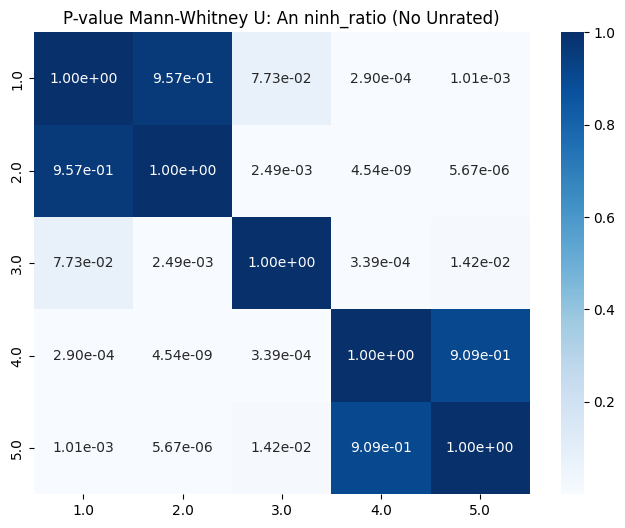


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


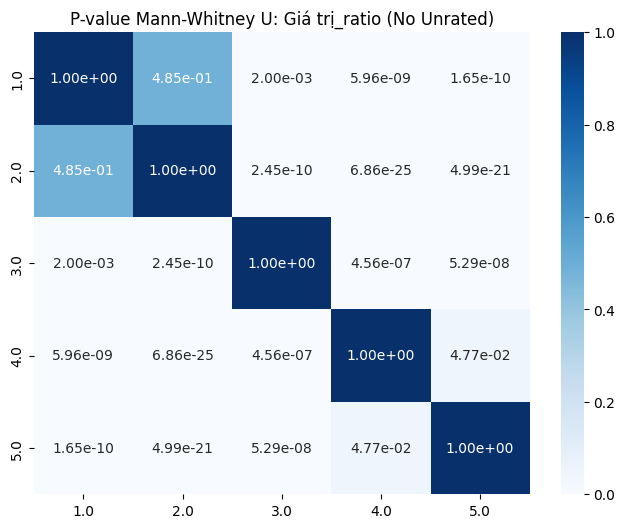


Đã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'


In [56]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

def local_statistical_analysis_no_unrated(df_ratios, criteria, ratio_columns):
    """
    Phân tích cục bộ theo số sao (loại bỏ Không xếp hạng) với CI, Kruskal-Wallis, Mann-Whitney U.
    """
    # Loại bỏ nhóm Không xếp hạng
    df_ratios = df_ratios[df_ratios['stars_rating'] != 'Không xếp hạng'].copy()
    df_ratios['stars_rating'] = df_ratios['stars_rating'].astype(float)
    print("\nCột trong df_ratios sau khi lọc:", df_ratios.columns.tolist())
    print("\nSố lượng khách sạn theo số sao:")
    print(df_ratios['stars_rating'].value_counts().sort_index())
    
    # 1. Tỷ lệ trung bình theo số sao
    print("\nTỷ lệ trung bình theo số sao:")
    star_group = df_ratios.groupby('stars_rating')[ratio_columns].mean().round(4)
    print(star_group)
    star_group.to_csv('star_group_no_unrated_step2.csv')
    print("\nĐã lưu tỷ lệ trung bình vào 'star_group_no_unrated_step2.csv'")
    
    # 2. Khoảng tin cậy 95% theo số sao
    print("\nKhoảng tin cậy 95% theo số sao:")
    ci_star = {}
    z = 1.96
    for star in df_ratios['stars_rating'].unique():
        df_star = df_ratios[df_ratios['stars_rating'] == star]
        n = len(df_star)
        if n > 1:
            for col in ratio_columns:
                mean = df_star[col].mean()
                std = df_star[col].std()
                se = std / np.sqrt(n)
                ci_lower = mean - z * se
                ci_upper = mean + z * se
                ci_star[(star, col)] = {'mean': mean, 'ci_lower': ci_lower, 'ci_upper': ci_upper}
                print(f"Star={star}, {col}: Mean={mean:.4f}, CI=[{ci_lower:.4f}, {ci_upper:.4f}]")
    
    ci_star_df = pd.DataFrame(ci_star).T
    ci_star_df.to_csv('ci_star_no_unrated_step2.csv')
    print("\nĐã lưu khoảng tin cậy vào 'ci_star_no_unrated_step2.csv'")
    
    # 3. Kiểm định Kruskal-Wallis
    print("\nKiểm định Kruskal-Wallis:")
    kruskal_results = {}
    for col in ratio_columns:
        groups = [df_ratios[df_ratios['stars_rating'] == s][col].dropna() 
                  for s in df_ratios['stars_rating'].unique() if len(df_ratios[df_ratios['stars_rating'] == s][col].dropna()) > 0]
        if len(groups) > 1:
            stat, p_value = stats.kruskal(*groups)
            kruskal_results[col] = {'stat': stat, 'p_value': p_value}
            print(f"{col}: stat={stat:.2f}, p-value={p_value:.4e}")
    
    pd.DataFrame(kruskal_results).T.to_csv('kruskal_results_no_unrated_step2.csv')
    print("\nĐã lưu kết quả Kruskal-Wallis vào 'kruskal_results_no_unrated_step2.csv'")
    
    # 4. Kiểm định Mann-Whitney U
    stars = df_ratios['stars_rating'].unique()
    pairs = list(combinations(stars, 2))
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs  # Hiệu chỉnh Bonferroni
    print(f"\nHiệu chỉnh Bonferroni: alpha' = {alpha:.5f}")
    
    pairwise_results = {col: [] for col in ratio_columns}
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for star1, star2 in pairs:
            group1 = df_ratios[df_ratios['stars_rating'] == star1][col].dropna()
            group2 = df_ratios[df_ratios['stars_rating'] == star2][col].dropna()
            if len(group1) > 0 and len(group2) > 0:
                stat, p_value = stats.mannwhitneyu(group1, group2, alternative='two-sided')
                # Tính kích thước hiệu ứng (rank-biserial correlation)
                n1, n2 = len(group1), len(group2)
                r = 1 - (2 * stat) / (n1 * n2)
                pairwise_results[col].append({
                    'pair': f'{star1} vs. {star2}',
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                print(f"{star1} vs. {star2}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
    
    # Lưu kết quả Mann-Whitney U
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(f'pairwise_{col}_no_unrated_step2.csv')
        print(f"\nĐã lưu kết quả Mann-Whitney U cho {col} vào 'pairwise_{col}_no_unrated_step2.csv'")
    
    # 5. Trực quan hóa: Heatmap p-value cho Ẩm thực_ratio
    p_matrix = np.ones((len(stars), len(stars)))
    stars = sorted(stars)
    for col in ratio_columns:
        for i, star1 in enumerate(stars):
            for j, star2 in enumerate(stars):
                if star1 != star2:
                    for res in pairwise_results[col]:
                        if res['pair'] == f'{star1} vs. {star2}' or res['pair'] == f'{star2} vs. {star1}':
                            p_matrix[i, j] = res['p_value']
        plt.figure(figsize=(8, 6))
        sns.heatmap(p_matrix, xticklabels=stars, yticklabels=stars, annot=True, fmt='.2e', cmap='Blues')
        plt.title(f'P-value Mann-Whitney U: {col} (No Unrated)')
        plt.show()
        plt.close()
        print("\nĐã lưu heatmap p-value vào 'heatmap_pairwise_no_unrated_step2.png'")
    
    return df_ratios, pairwise_results


ratio_columns = [f'{crit}_ratio' for crit in criteria]

try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    df_ratios, pairwise_results = local_statistical_analysis_no_unrated(df_ratios, criteria, ratio_columns)
except Exception as e:
    print(f"Lỗi: {str(e)}")

**Xu hướng đánh giá cục bộ theo số sao**
* Tiêu chí bị ảnh hưởng mạnh nhất:

    * Ẩm thực_ratio:

        Tăng mạnh từ 1–2 sao (~0.476) lên 4–5 sao (0.6335–0.6697).

        **Ý nghĩa thực tiễn:** Ẩm thực là yếu tố phân biệt khách sạn cao cấp, quan trọng với khách hàng 4–5 sao

    * Cơ sở vật chất_ratio:

        Tăng từ 1–2 sao (~0.68) lên 4–5 sao (0.7648–0.7951).

        **Ý nghĩa thực tiễn: **Cơ sở vật chất (hồ bơi, spa, gym) là điểm mạnh của khách sạn cao cấp.

    * Wi-Fi_ratio:

        Tăng từ 1–2 sao (~0.16) lên 4–5 sao (~0.23).

        **Ý nghĩa thực tiễn:** Wi-Fi quan trọng hơn ở khách sạn cao cấp, có thể do khách công tác hoặc quốc tế.

    * Giá trị_ratio:

        Tăng từ 1–2 sao (~0.48) lên 4–5 sao (~0.54–0.56).

        **Ý nghĩa thực tiễn:** Khách hàng cảm nhận giá trị tốt hơn ở khách sạn cao cấp, dù giá cao hơn.

* Tiêu chí ít bị ảnh hưởng:

    * Phòng nghỉ & tiện nghi_ratio:

        Ổn định (~0.77–0.80), chỉ khác biệt nhỏ giữa 2 sao vs. 3–4 sao, 1 sao vs. 4 sao.
    
        **Ý nghĩa thực tiễn:** Tiêu chí cốt lõi, được đánh giá cao ở mọi khách sạn.


    * Dịch vụ & nhân viên_ratio:

        Tăng nhẹ từ 1–2 sao (~0.71) lên 4–5 sao (~0.75).
    
        **Ý nghĩa thực tiễn:** Dịch vụ là tiêu chuẩn, ít phân biệt giữa 3–5 sao.


    * Sạch sẽ_ratio:

        Dao động ~0.49–0.53, 5 sao thấp bất ngờ (0.4940).
    
        **Ý nghĩa thực tiễn:** Sạch sẽ là tiêu chuẩn cơ bản, 5 sao cần xem xét do kỳ    vọng cao.


    * An ninh_ratio:

        Thấp (~0.07–0.12), khác biệt nhỏ giữa 1–2 sao vs. 4–5 sao.
    
        **Ý nghĩa thực tiễn:** Ít được đề cập, không phải yếu tố chính.



**Vai trò của từng nhóm sao**
* 1–2 sao (giá rẻ):

    Thấp nhất ở 'Ẩm thực' (~0.476), 'Cơ sở vật chất' (~0.68), 'Wi-Fi' (~0.16), 'Giá trị' (~0.48).
    
    Không khác biệt đáng kể với nhau (p > 0.005).
    
    **Xu hướng:** Tập trung vào 'Phòng nghỉ & tiện nghi' (0.77) và 'Dịch vụ & nhân viên' (0.71), ít chú ý tiện ích phụ.
* 3 sao (tiêu chuẩn):

    Tăng đáng kể ở 'Ẩm thực' (0.5572), 'Cơ sở vật chất' (0.7157), 'Giá trị' (0.5157).
    
    Khác biệt với 4–5 sao ở 'Ẩm thực' và 'Cơ sở vật chất'.
    **Xu hướng:** Cân bằng giá trị và chất lượng, bắt đầu chú ý tiện ích phụ.
* 4–5 sao (cao cấp):

    Cao nhất ở 'Ẩm thực' (0.6335–0.6697), 'Cơ sở vật chất' (0.7648–0.7951), 'Wi-Fi' (~0.23), 'Giá trị' (~0.54–0.56).
    
    Khác biệt mạnh với 1–3 sao, ít khác biệt giữa 4 vs. 5 (trừ 'Ẩm thực' và 'Cơ sở vật chất').
    
    **Xu hướng:** Đánh giá cao tiện ích phụ, kỳ vọng cao về mọi tiêu chí.

In [57]:
import pandas as pd
import numpy as np
from scipy import stats
from itertools import combinations

def mann_whitney_clustered_stars(df_ratios, ratio_columns):
    """
    Kiểm định Mann-Whitney U cho các cụm sao gộp: 1-2, 3, 4-5.
    """
    # Loại bỏ nhóm Không xếp hạng
    df_ratios = df_ratios[df_ratios['stars_rating'] != 'Không xếp hạng'].copy()
    df_ratios['stars_rating'] = df_ratios['stars_rating'].astype(float)
    
    # Gộp nhóm sao
    def cluster_stars(stars):
        if stars in [1.0, 2.0]:
            return '1-2'
        elif stars == 3.0:
            return '3'
        elif stars in [4.0, 5.0]:
            return '4-5'
        return None
    
    df_ratios['star_cluster'] = df_ratios['stars_rating'].apply(cluster_stars)
    print("\nSố lượng khách sạn theo cụm sao:")
    print(df_ratios['star_cluster'].value_counts().sort_index())
    
    # Tỷ lệ trung bình theo cụm
    print("\nTỷ lệ trung bình theo cụm sao:")
    cluster_group = df_ratios.groupby('star_cluster')[ratio_columns].mean().round(4)
    print(cluster_group)
    cluster_group.to_csv('cluster_group_step2.csv')
    print("\nĐã lưu tỷ lệ trung bình vào 'cluster_group_step2.csv'")
    
    # Kiểm định Mann-Whitney U
    clusters = ['1-2', '3', '4-5']
    # Cặp so sánh: Trong cụm (1 vs. 2, 4 vs. 5) và giữa cụm (1-2 vs. 3, 1-2 vs. 4-5, 3 vs. 4-5)
    pairs = [
        ('1 vs. 2', df_ratios[df_ratios['stars_rating'].isin([1.0])], df_ratios[df_ratios['stars_rating'].isin([2.0])]),
        ('4 vs. 5', df_ratios[df_ratios['stars_rating'].isin([4.0])], df_ratios[df_ratios['stars_rating'].isin([5.0])]),
        ('1-2 vs. 3', df_ratios[df_ratios['star_cluster'] == '1-2'], df_ratios[df_ratios['star_cluster'] == '3']),
        ('1-2 vs. 4-5', df_ratios[df_ratios['star_cluster'] == '1-2'], df_ratios[df_ratios['star_cluster'] == '4-5']),
        ('3 vs. 4-5', df_ratios[df_ratios['star_cluster'] == '3'], df_ratios[df_ratios['star_cluster'] == '4-5'])
    ]
    
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs  # Hiệu chỉnh Bonferroni
    print(f"\nHiệu chỉnh Bonferroni: alpha' = {alpha:.5f}")
    
    pairwise_results = {col: [] for col in ratio_columns}
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for pair_name, group1, group2 in pairs:
            data1 = group1[col].dropna()
            data2 = group2[col].dropna()
            if len(data1) > 0 and len(data2) > 0:
                stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                n1, n2 = len(data1), len(data2)
                r = 1 - (2 * stat) / (n1 * n2)  # Rank-biserial correlation
                pairwise_results[col].append({
                    'pair': pair_name,
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                print(f"{pair_name}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
    
    # Lưu kết quả
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(f'pairwise_clustered_{col}_step2.csv')
        print(f"\nĐã lưu kết quả Mann-Whitney U cho {col} vào 'pairwise_clustered_{col}_step2.csv'")
    
    return df_ratios, pairwise_results


ratio_columns = [f'{crit}_ratio' for crit in criteria]

try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    df_ratios, pairwise_results = mann_whitney_clustered_stars(df_ratios, ratio_columns)
except Exception as e:
    print(f"Lỗi: {str(e)}")


Số lượng khách sạn theo cụm sao:
1-2    1069
3      1629
4-5    1445
Name: star_cluster, dtype: int64

Tỷ lệ trung bình theo cụm sao:
              Vị trí & môi trường_ratio  Phòng nghỉ & tiện nghi_ratio  \
star_cluster                                                            
1-2                              0.6946                        0.7736   
3                                0.7289                        0.7858   
4-5                              0.7520                        0.7960   

              Sạch sẽ_ratio  Dịch vụ & nhân viên_ratio  Wi-Fi_ratio  \
star_cluster                                                          
1-2                  0.5031                     0.7114       0.1606   
3                    0.5193                     0.7351       0.1960   
4-5                  0.5174                     0.7459       0.2330   

              Ẩm thực_ratio  Cơ sở vật chất_ratio  An ninh_ratio  \
star_cluster                                                       
1-2    


**Tổng quan**
* Dữ liệu: 4,143 khách sạn, chia thành 3 cụm:

    * 1–2 sao: 1,069 khách sạn (222 + 847).
    * 3 sao: 1,629 khách sạn.
    * 4–5 sao: 1,445 khách sạn (1,070 + 375).

**Kiểm định Mann-Whitney U**
* khách sạn 1 sao với 2 sao.
    * P-value > 0.01 cho tất cả tiêu chí (ví dụ: 'Ẩm thực' p=0.9304, 'Wi-Fi' p=0.9850, 'Sạch sẽ' p=0.0510).

    * Hiệu ứng rất nhỏ ($r \approx 0–0.085$).

    * **Nhận xét:** Không có sự khác biệt đáng kể giữa 1 và 2 sao, xác nhận tính hợp lý của việc gộp thành cụm 1–2 sao.

* Khách sạn 4 sao với khách sạn 5 sao.

    * P-value > 0.01 cho hầu hết tiêu chí (ví dụ: 'Wi-Fi' p=0.9280, 'Dịch vụ & nhân viên' p=0.8403, 'Vị trí & môi trường' p=0.3015), trừ:

        'Ẩm thực': p=2.00e-07, $r=0.1802$, hiệu ứng nhỏ.

        'Cơ sở vật chất': p=1.68e-08, $r=0.1955$, hiệu ứng nhỏ.

        'Sạch sẽ': p=2.30e-06, $r=-0.1638$, hiệu ứng nhỏ (5 sao thấp hơn: 0.4940 vs. 0.5256).


    * **Nhận xét:** 4 và 5 sao giống nhau ở hầu hết tiêu chí, nhưng khác biệt nhẹ ở 'Ẩm thực', 'Cơ sở vật chất', và 'Sạch sẽ'. Việc gộp 4–5 sao vẫn hợp lý, dù cần lưu ý các tiêu chí này.

* Khách sạn 1-2 với khách sạn 3 sao.
    * P-value < 0.01 sao với hết tất các các tiêu chí 
    * **Nhận xét** Khác biệt đáng kể giữa 1–2 sao và 3 sao.

* Khách sạn 1-2 sao với khách sạn 4-5 sao.
    * P-value << 0.01 sao với hết tất các các tiêu chí 
    * **Nhận xét** Khác biệt rất lớn giữa 1–2 sao và 4-5 sao.

* Khách sạn 3 với khách sạn 4-5 sao.
    * P-value < 0.01 sao với hết tất các các tiêu chí 
    * **Nhận xét** Khác biệt đáng kể giữa 3 sao và 4-5 sao.

In [59]:
import pandas as pd
import numpy as np
from scipy import stats
import os

def statistical_analysis_clustered_stars(df_ratios, ratio_columns, output_dir='output'):
    """
    Thực hiện Confidence Interval, Bootstrap, và Within-sample stability cho các cụm sao.
    """
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Loại bỏ nhóm Không xếp hạng
    df_ratios = df_ratios[df_ratios['stars_rating'] != 'Không xếp hạng'].copy()
    df_ratios['stars_rating'] = df_ratios['stars_rating'].astype(float)
    
    # Gộp nhóm sao
    def cluster_stars(stars):
        if stars in [1.0, 2.0]:
            return '1-2'
        elif stars == 3.0:
            return '3'
        elif stars in [4.0, 5.0]:
            return '4-5'
        return None
    
    df_ratios['star_cluster'] = df_ratios['stars_rating'].apply(cluster_stars)
    print("\nSố lượng khách sạn theo cụm sao:")
    print(df_ratios['star_cluster'].value_counts().sort_index())
    
    # Tỷ lệ trung bình và độ lệch chuẩn
    cluster_stats = df_ratios.groupby('star_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    cluster_stats.to_csv(os.path.join(output_dir, 'cluster_stats_step2.csv'))
    print("\nThống kê trung bình và độ lệch chuẩn theo cụm sao:")
    print(cluster_stats)
    print(f"\nĐã lưu thống kê vào '{output_dir}/cluster_stats_step2.csv'")
    
    # Confidence Interval 95%
    ci_results = []
    z = 1.96  # z-score cho 95%
    for cluster in ['1-2', '3', '4-5']:
        df_cluster = df_ratios[df_ratios['star_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            n = len(data)
            mean = data.mean()
            std = data.std()
            se = std / np.sqrt(n) if n > 0 else 0
            ci_lower = mean - z * se
            ci_upper = mean + z * se
            ci_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'CI_Lower': ci_lower,
                'CI_Upper': ci_upper
            })
    ci_df = pd.DataFrame(ci_results).round(4)
    ci_df.to_csv(os.path.join(output_dir, 'ci_clustered_step2.csv'), index=False)
    print("\nKhoảng tin cậy 95% theo cụm sao:")
    print(ci_df)
    print(f"\nĐã lưu CI vào '{output_dir}/ci_clustered_step2.csv'")
    
    # Bootstrap CI 95%
    def bootstrap_ci(data, n_boot=10000, alpha=0.05):
        boot_means = []
        for _ in range(n_boot):
            boot_sample = np.random.choice(data, size=len(data), replace=True)
            boot_means.append(np.mean(boot_sample))
        ci_lower = np.percentile(boot_means, 100 * alpha / 2)
        ci_upper = np.percentile(boot_means, 100 * (1 - alpha / 2))
        return ci_lower, ci_upper
    
    bootstrap_results = []
    for cluster in ['1-2', '3', '4-5']:
        df_cluster = df_ratios[df_ratios['star_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            ci_lower, ci_upper = bootstrap_ci(data)
            bootstrap_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Bootstrap_CI_Lower': ci_lower,
                'Bootstrap_CI_Upper': ci_upper
            })
    bootstrap_df = pd.DataFrame(bootstrap_results).round(4)
    bootstrap_df.to_csv(os.path.join(output_dir, 'bootstrap_ci_clustered_step2.csv'), index=False)
    print("\nBootstrap CI 95% theo cụm sao:")
    print(bootstrap_df)
    print(f"\nĐã lưu Bootstrap CI vào '{output_dir}/bootstrap_ci_clustered_step2.csv'")
    
    # Within-sample stability (Subsampling)
    def subsampling_stability(data, n_sub=1000, frac=0.8):
        sub_means = []
        n = int(len(data) * frac)
        for _ in range(n_sub):
            sub_sample = np.random.choice(data, size=n, replace=False)
            sub_means.append(np.mean(sub_sample))
        return np.std(sub_means)  # Độ lệch chuẩn của trung bình tái lấy mẫu
    
    stability_results = []
    for cluster in ['1-2', '3', '4-5']:
        df_cluster = df_ratios[df_ratios['star_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            std = data.std()
            stability_std = subsampling_stability(data)
            stability_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Sample_SD': std,
                'Subsampling_SD': stability_std
            })
    stability_df = pd.DataFrame(stability_results).round(4)
    stability_df.to_csv(os.path.join(output_dir, 'stability_clustered_step2.csv'), index=False)
    print("\nĐộ ổn định trong mẫu (Within-sample stability):")
    print(stability_df)
    print(f"\nĐã lưu độ ổn định vào '{output_dir}/stability_clustered_step2.csv'")
    
    return cluster_stats, ci_df, bootstrap_df, stability_df

# Chạy phân tích

ratio_columns = [f'{crit}_ratio' for crit in criteria]

try:
    df_ratios = pd.read_csv('df_ratios_step2.csv')
    output_dir = 'statistical_analysis_output'
    cluster_stats, ci_df, bootstrap_df, stability_df = statistical_analysis_clustered_stars(
        df_ratios, ratio_columns, output_dir
    )
except Exception as e:
    print(f"Lỗi: {str(e)}")


Số lượng khách sạn theo cụm sao:
1-2    1069
3      1629
4-5    1445
Name: star_cluster, dtype: int64

Thống kê trung bình và độ lệch chuẩn theo cụm sao:
             Vị trí & môi trường_ratio         Phòng nghỉ & tiện nghi_ratio  \
                                  mean     std                         mean   
star_cluster                                                                  
1-2                             0.6946  0.1379                       0.7736   
3                               0.7289  0.1385                       0.7858   
4-5                             0.7520  0.1126                       0.7960   

                     Sạch sẽ_ratio         Dịch vụ & nhân viên_ratio          \
                 std          mean     std                      mean     std   
star_cluster                                                                   
1-2           0.1028        0.5031  0.1279                    0.7114  0.1505   
3             0.1007        0.5193  0.1240        

**Độ lệch chuẩn tái lấy mẫu (Subsampling_SD):**

Rất thấp (~0.0011–0.0028) cho tất cả tiêu chí và cụm, chứng minh tỷ lệ trung bình ổn định ngay cả khi lấy mẫu con (80% dữ liệu).

**Kết luận:** Mẫu lớn (1,069–1,629 khách sạn) và Subsampling_SD nhỏ đảm bảo tỷ lệ trung bình có độ ổn định cao, phù hợp để sử dụng làm tỷ lệ cuối cùng.

**So sánh với cục bộ**
* **Tỷ lệ trung bình:**

    * **Tổng thể:** 
        Tỷ lệ trung bình phản ánh toàn bộ 4,143 khách sạn, ví dụ: 'Ẩm thực_ratio' = 0.5657, 'Cơ sở vật chất_ratio' = 0.7268, 'Wi-Fi_ratio' = 0.1998.
    * **Cục bộ (phân cụm):**

        1–2 sao: Thấp hơn tổng thể, ví dụ: 'Ẩm thực' = 0.4756, 'Wi-Fi' = 0.1606.

        3 sao: Gần tổng thể, ví dụ: 'Ẩm thực' = 0.5572, 'Wi-Fi' = 0.1960.

        4–5 sao: Cao hơn tổng thể, ví dụ: 'Ẩm thực' = 0.6429, 'Wi-Fi' = 0.2330.

    * **Nhận xét:** 
        Phân cụm làm rõ sự khác biệt giữa các phân khúc, trong khi tổng thể trung bình hóa, che giấu xu hướng riêng của từng cụm.

* **Độ ổn định (Within-sample stability vs. CV):**

    * **Tổng thể:** Hệ số biến thiên (CV) cao ở 'An ninh' (1.4020), 'Wi-Fi' (0.6671), thấp ở 'Phòng nghỉ & tiện nghi' (0.1215), cho thấy biến động lớn ở một số tiêu chí.

    * **Cục bộ:** Subsampling_SD rất thấp (~0.0011–0.0028), Sample_SD tương tự CV tổng thể (ví dụ: 'Ẩm thực' ~0.14–0.18), xác nhận độ ổn định cao trong mỗi cụm.
    
    * **Nhận xét:** Phân cụm cho độ ổn định cao hơn (Subsampling_SD thấp), làm rõ sự đồng nhất trong từng phân khúc so với tổng thể.

#### REVIEW - PRICE - ROOM



In [27]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_allRoom.json", 'r', encoding='utf-8') as f:
    feature_allRoom = json.load(f)

with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\hotel_data_room.json", 'r', encoding='utf-8') as f:
    hotel_data_room = json.load(f)


In [28]:
hotel_data_room[0].keys()

dict_keys(['id', 'name', 'room_id', 'cap_room_type', 'room_type', 'room_level', 'original_price', 'capacity', 'room_area(m²)', 'bed_types', 'room_view', 'breakfast', 'room_amenities'])

In [29]:
room_data = []
for key in hotel_data_room:
    room_data.append({
        'id_room': key['room_id'],
        'id': key['id'],
        'original_price': key['original_price'],
        'name': key['name'],
    })


In [30]:
def drop_duplicates(data):
    seen = set()
    result = []
    for item in data:
        #key = (item['id'], item['original_price'], item['name'])
        key = (item['id'], item['name'])
        if key not in seen:
            seen.add(key)
            result.append(item)
    return result
room_data = drop_duplicates(room_data)

In [31]:
room_data[0]

{'id_room': 'RD1000059301',
 'id': '10000593',
 'original_price': 'VND 1.832.536',
 'name': 'Bungalow Nhìn ra vườn'}

In [7]:
with open("hotel_review_score.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

In [32]:
reviewer_data[0]

{'id_hotel': '10000593',
 'id_review': '2367e2c2-8bb2-4a79-bc48-034fde283649',
 'country': 'Việt Nam',
 'room': 'Bungalow Deluxe Nhìn Ra Khu Vườn',
 'state': 'Nhóm',
 'rating': 'Đạt điểm 10',
 'criteria': [['Phòng nghỉ & tiện nghi', 'Positive'],
  ['Cơ sở vật chất', 'Positive'],
  ['Vị trí & môi trường', 'Positive'],
  ['Ẩm thực', 'Positive'],
  ['Dịch vụ & nhân viên', 'Positive']]}

In [42]:
import pandas as pd
import numpy as np
from scipy import stats
import unicodedata
import re
import os
import seaborn as sns
import matplotlib.pyplot as plt

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def merge_room_reviewer(room_data, reviewer_data):
    """Giao room_data và reviewer_data dựa trên id và tên phòng."""
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    # Chuẩn hóa
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge
    merged_df = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    
    print(f"\nSố bản ghi sau merge: {len(merged_df)}")
    return merged_df

def assign_price_cluster(price):
    """Phân cụm giá thành 5 cụm."""
    if price is None:
        return None
    if price < 500000:
        return '0-500K'
    elif 500000 <= price < 1000000:
        return '500K-1M'
    elif 1000000 <= price < 1500000:
        return '1M-1.5M'
    elif 1500000 <= price < 2000000:
        return '1.5M-2M'
    else:
        return '>2M'

def calculate_ratios(merged_df, criteria_list):
    """Tính _ratio: số lần tiêu chí được nhắc / tổng số review."""
    total_reviews = merged_df.groupby('id_hotel').size().reset_index(name='total_reviews')
    
    ratios = []
    for id_hotel, group in merged_df.groupby('id_hotel'):
        counts = {crit: 0 for crit in criteria_list}
        price = group['original_price'].iloc[0]
        total = total_reviews[total_reviews['id_hotel'] == id_hotel]['total_reviews'].iloc[0]
        
        for _, row in group.iterrows():
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        ratio_row = {'id_hotel': id_hotel, 'price': price, 'total_reviews': total}
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else 0
        ratios.append(ratio_row)
    
    ratios_df = pd.DataFrame(ratios)
    ratios_df['price_cluster'] = ratios_df['price'].apply(assign_price_cluster)
    print("\nSố khách sạn theo cụm giá:")
    print(ratios_df['price_cluster'].value_counts().sort_index())
    ratios_df.to_csv('ratios_price_5_clusters.csv')
    return ratios_df

def statistical_analysis_price_clusters(ratios_df, ratio_columns, output_dir='price_analysis_5_clusters'):
    """Thực hiện Mann-Whitney U, CI, Bootstrap, Stability, và Heatmap p-value."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Tỷ lệ trung bình theo cụm
    cluster_stats = ratios_df.groupby('price_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    cluster_stats.to_csv(os.path.join(output_dir, 'price_cluster_stats.csv'))
    print("\nThống kê trung bình và độ lệch chuẩn theo cụm giá:")
    print(cluster_stats)
    
    # Mann-Whitney U
    clusters = ['0-500K', '500K-1M', '1M-1.5M', '1.5M-2M', '>2M']
    pairs = [(f"{c1} vs. {c2}", c1, c2) for i, c1 in enumerate(clusters) for c2 in clusters[i+1:]]
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs
    print(f"\nHiệu chỉnh Bonferroni: alpha' = {alpha:.5f}")
    
    pairwise_results = {col: [] for col in ratio_columns}
    p_value_matrices = {col: np.ones((len(clusters), len(clusters))) for col in ratio_columns}
    
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for pair_name, cluster1, cluster2 in pairs:
            data1 = ratios_df[ratios_df['price_cluster'] == cluster1][col].dropna()
            data2 = ratios_df[ratios_df['price_cluster'] == cluster2][col].dropna()
            if len(data1) > 0 and len(data2) > 0:
                stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                n1, n2 = len(data1), len(data2)
                r = 1 - (2 * stat) / (n1 * n2)
                pairwise_results[col].append({
                    'pair': pair_name,
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                i, j = clusters.index(cluster1), clusters.index(cluster2)
                p_value_matrices[col][i, j] = p_value
                p_value_matrices[col][j, i] = p_value
                print(f"{pair_name}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
    
    # Lưu kết quả Mann-Whitney U
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(os.path.join(output_dir, f'pairwise_price_{col}.csv'))
    
    # Heatmap p-value
    for col in ratio_columns:
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            p_value_matrices[col], annot=True, fmt='.2e', cmap='Blues',
            xticklabels=clusters, yticklabels=clusters, cbar_kws={'label': 'p-value'}
        )
        plt.title(f'Heatmap of p-values for {col}')
        plt.show()
        plt.close()
        print(f"\nĐã lưu heatmap p-value cho {col} vào '{output_dir}/p_value_heatmap_{col}.png'")
    
    # Confidence Interval 95%
    ci_results = []
    z = 1.96
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            n = len(data)
            mean = data.mean()
            std = data.std()
            se = std / np.sqrt(n) if n > 0 else 0
            ci_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'CI_Lower': mean - z * se,
                'CI_Upper': mean + z * se
            })
    ci_df = pd.DataFrame(ci_results).round(4)
    ci_df.to_csv(os.path.join(output_dir, 'ci_price_clusters.csv'))
    print("\nKhoảng tin cậy 95% theo cụm giá:")
    print(ci_df)
    
    # Bootstrap CI
    def bootstrap_ci(data, n_boot=10000, alpha=0.05):
        boot_means = []
        for _ in range(n_boot):
            boot_sample = np.random.choice(data, size=len(data), replace=True)
            boot_means.append(np.mean(boot_sample))
        return np.percentile(boot_means, [100 * alpha / 2, 100 * (1 - alpha / 2)])
    
    bootstrap_results = []
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            ci_lower, ci_upper = bootstrap_ci(data)
            bootstrap_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Bootstrap_CI_Lower': ci_lower,
                'Bootstrap_CI_Upper': ci_upper
            })
    bootstrap_df = pd.DataFrame(bootstrap_results).round(4)
    bootstrap_df.to_csv(os.path.join(output_dir, 'bootstrap_ci_price_clusters.csv'))
    print("\nBootstrap CI 95% theo cụm giá:")
    print(bootstrap_df)
    
    # Within-sample stability
    def subsampling_stability(data, n_sub=1000, frac=0.8):
        sub_means = []
        n = int(len(data) * frac)
        for _ in range(n_sub):
            sub_sample = np.random.choice(data, size=n, replace=False)
            sub_means.append(np.mean(sub_sample))
        return np.std(sub_means)
    
    stability_results = []
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            std = data.std()
            stability_std = subsampling_stability(data)
            stability_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Sample_SD': std,
                'Subsampling_SD': stability_std
            })
    stability_df = pd.DataFrame(stability_results).round(4)
    stability_df.to_csv(os.path.join(output_dir, 'stability_price_clusters.csv'))
    print("\nĐộ ổn định trong mẫu theo cụm giá:")
    print(stability_df)
    
    return ratios_df, pairwise_results, ci_df, bootstrap_df, stability_df





Số bản ghi sau merge room và reviewer: 593525
Số bản ghi sau merge với star_data: 542421

Số lượng khách sạn theo cụm kết hợp:
     combined_cluster  hotel_count
0    1-2 sao & 0-500K          947
1     1-2 sao & 1M-2M          563
2   1-2 sao & 500K-1M         1121
3       1-2 sao & >2M          176
4      3 sao & 0-500K          625
5       3 sao & 1M-2M         1275
6     3 sao & 500K-1M         1317
7         3 sao & >2M          770
8    4-5 sao & 0-500K          126
9     4-5 sao & 1M-2M          870
10  4-5 sao & 500K-1M          485
11      4-5 sao & >2M         1376

Đã lưu số lượng cụm vào 'combined_cluster_analysis/combined_cluster_counts.csv'

Thống kê trung bình và độ lệch chuẩn _ratio theo cụm kết hợp:
                  Vị trí & môi trường_ratio          \
                                       mean     std   
combined_cluster                                      
1-2 sao & 0-500K                     0.6296  0.1864   
1-2 sao & 1M-2M                      0.7062  0.2128  


Số bản ghi sau merge: 593525

Số khách sạn theo cụm giá:
0-500K     1912
1.5M-2M     542
1M-1.5M    1010
500K-1M    2416
>2M        1102
Name: price_cluster, dtype: int64

Thống kê trung bình và độ lệch chuẩn theo cụm giá:
              Vị trí & môi trường_ratio         Phòng nghỉ & tiện nghi_ratio  \
                                   mean     std                         mean   
price_cluster                                                                  
0-500K                           0.6532  0.1829                       0.7606   
1.5M-2M                          0.7336  0.1792                       0.7950   
1M-1.5M                          0.7283  0.1744                       0.7874   
500K-1M                          0.7084  0.1802                       0.7831   
>2M                              0.7608  0.1522                       0.8002   

                      Sạch sẽ_ratio         Dịch vụ & nhân viên_ratio          \
                  std          mean     std           

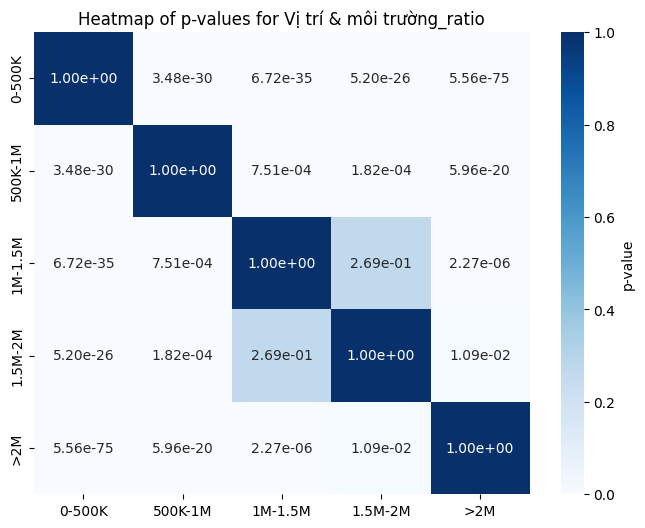


Đã lưu heatmap p-value cho Vị trí & môi trường_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Vị trí & môi trường_ratio.png'


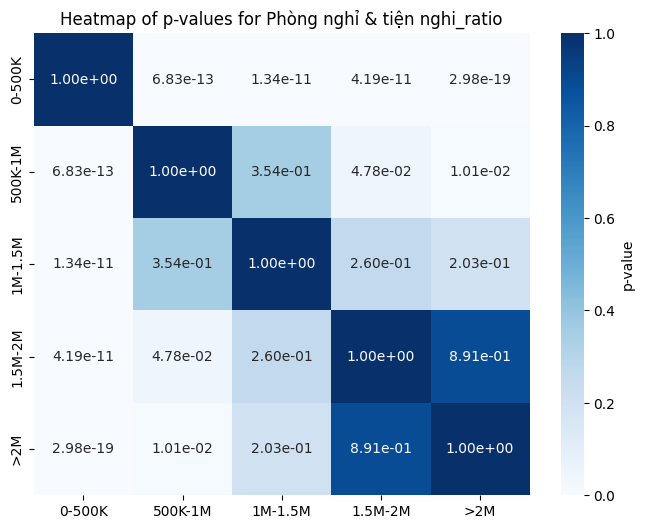


Đã lưu heatmap p-value cho Phòng nghỉ & tiện nghi_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Phòng nghỉ & tiện nghi_ratio.png'


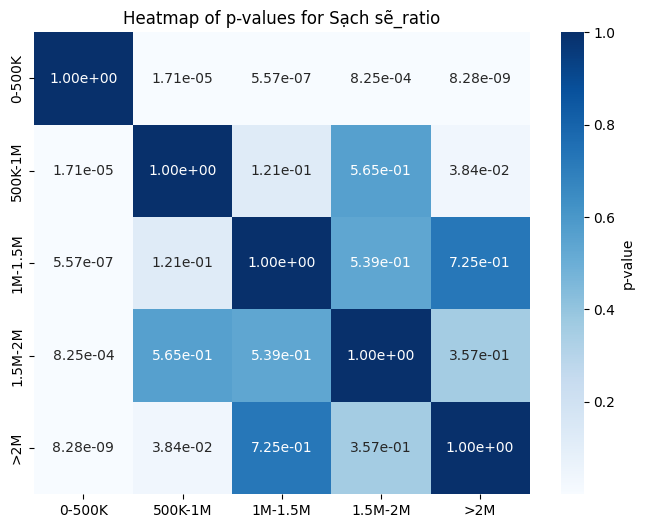


Đã lưu heatmap p-value cho Sạch sẽ_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Sạch sẽ_ratio.png'


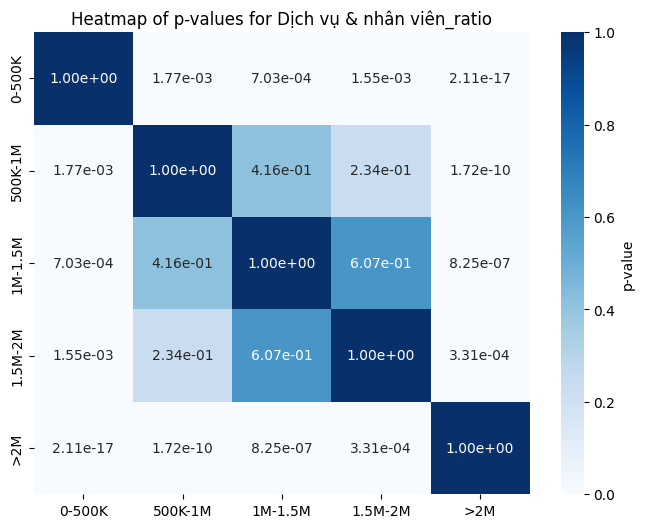


Đã lưu heatmap p-value cho Dịch vụ & nhân viên_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Dịch vụ & nhân viên_ratio.png'


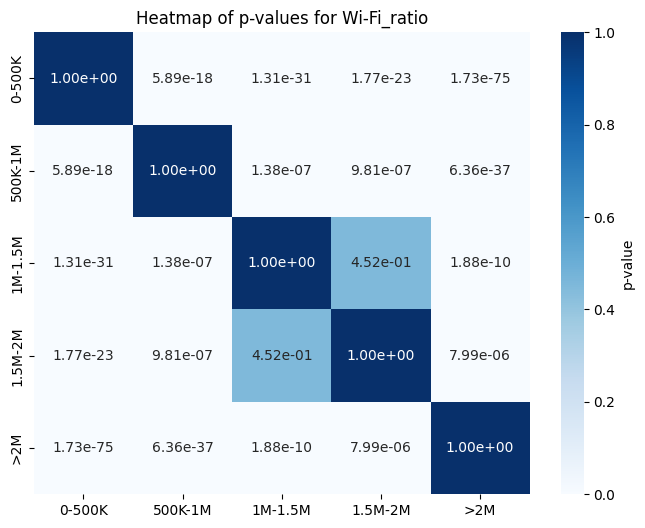


Đã lưu heatmap p-value cho Wi-Fi_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Wi-Fi_ratio.png'


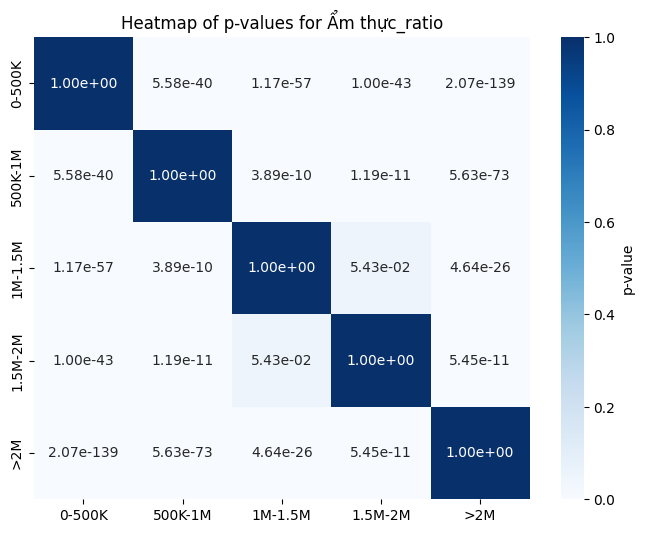


Đã lưu heatmap p-value cho Ẩm thực_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Ẩm thực_ratio.png'


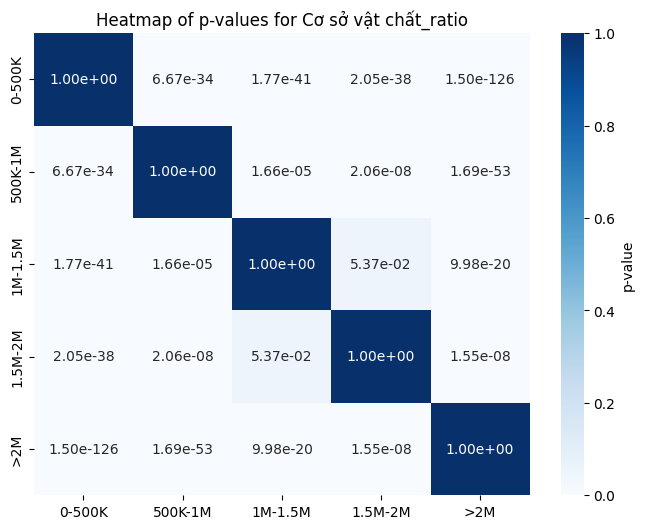


Đã lưu heatmap p-value cho Cơ sở vật chất_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Cơ sở vật chất_ratio.png'


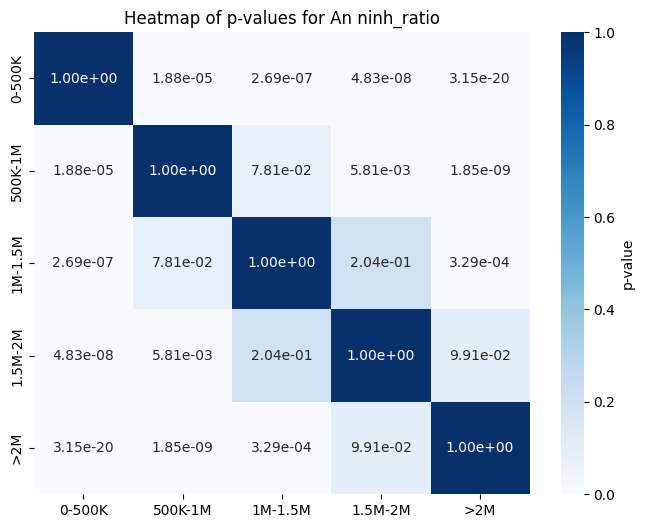


Đã lưu heatmap p-value cho An ninh_ratio vào 'price_analysis_5_clusters/p_value_heatmap_An ninh_ratio.png'


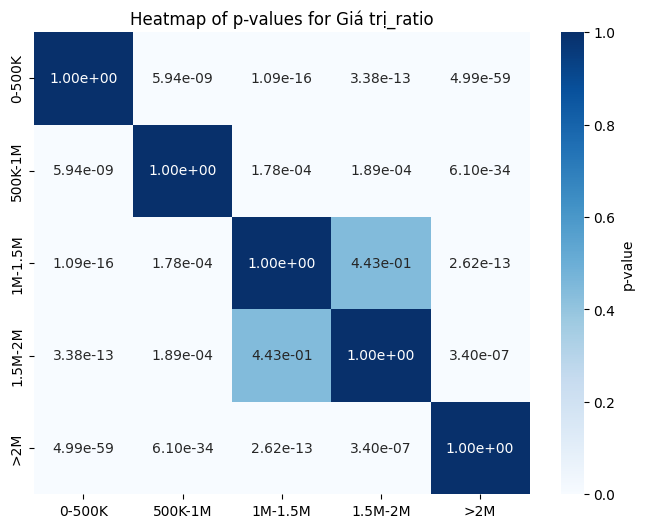


Đã lưu heatmap p-value cho Giá trị_ratio vào 'price_analysis_5_clusters/p_value_heatmap_Giá trị_ratio.png'

Khoảng tin cậy 95% theo cụm giá:
    Cluster                      Criteria    Mean  CI_Lower  CI_Upper
0    0-500K     Vị trí & môi trường_ratio  0.6532    0.6450    0.6614
1    0-500K  Phòng nghỉ & tiện nghi_ratio  0.7606    0.7543    0.7669
2    0-500K                 Sạch sẽ_ratio  0.4866    0.4788    0.4944
3    0-500K     Dịch vụ & nhân viên_ratio  0.6881    0.6794    0.6967
4    0-500K                   Wi-Fi_ratio  0.1387    0.1323    0.1451
5    0-500K                 Ẩm thực_ratio  0.4416    0.4322    0.4511
6    0-500K          Cơ sở vật chất_ratio  0.6513    0.6438    0.6589
7    0-500K                 An ninh_ratio  0.0748    0.0690    0.0806
8    0-500K                 Giá trị_ratio  0.4529    0.4449    0.4610
9   500K-1M     Vị trí & môi trường_ratio  0.7084    0.7012    0.7156
10  500K-1M  Phòng nghỉ & tiện nghi_ratio  0.7831    0.7772    0.7890
11  500K-1M       

In [16]:
criteria = ["Vị trí & môi trường", "Phòng nghỉ & tiện nghi", "Sạch sẽ", "Dịch vụ & nhân viên", "Wi-Fi", "Ẩm thực", "Cơ sở vật chất" , "An ninh", "Giá trị"]


ratio_columns = [f'{crit}_ratio' for crit in criteria]

# Giả lập dữ liệu (thay bằng dữ liệu thực tế)

try:
    merged_df = merge_room_reviewer(room_data, reviewer_data)
    ratios_df = calculate_ratios(merged_df, criteria)
    ratios_df, pairwise_results, ci_df, bootstrap_df, stability_df = statistical_analysis_price_clusters(
        ratios_df, ratio_columns
    )
except Exception as e:
    print(f"Lỗi: {str(e)}")

**Nhận xét:**
* 1M–1.5M vs. 1.5M–2M:
    * Tất cả tiêu chí đều có p-value > 0.005
    * **Nhận xét:** Hai cụm này rất tương đồng

* Kết luận:
    * Chia thành các cụm: 0 - 500k, 500k - 1M, 1M - 2M, > 2M
    


Số bản ghi sau merge: 593525

Số khách sạn theo cụm giá:
0-500K     1912
1M-2M      1570
500K-1M    2416
>2M        1084
Name: price_cluster, dtype: int64

Thống kê trung bình và độ lệch chuẩn theo cụm giá:
              Vị trí & môi trường_ratio         Phòng nghỉ & tiện nghi_ratio  \
                                   mean     std                         mean   
price_cluster                                                                  
0-500K                           0.6532  0.1829                       0.7606   
1M-2M                            0.7304  0.1759                       0.7900   
500K-1M                          0.7084  0.1802                       0.7831   
>2M                              0.7610  0.1520                       0.8004   

                      Sạch sẽ_ratio         Dịch vụ & nhân viên_ratio          \
                  std          mean     std                      mean     std   
price_cluster                                                        

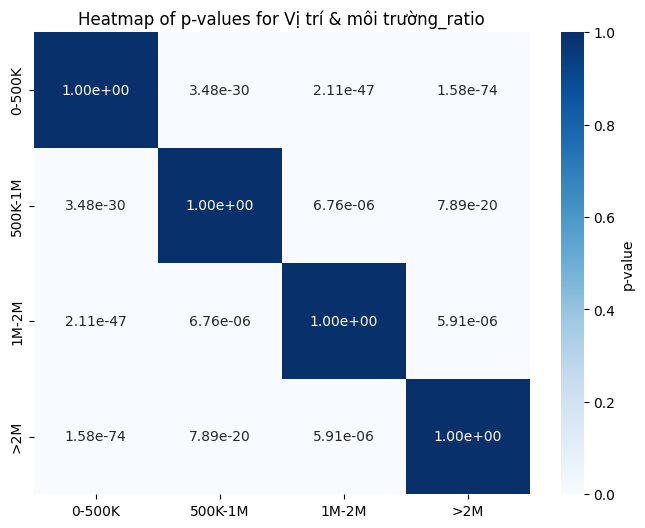


Đã lưu heatmap p-value cho Vị trí & môi trường_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Vị trí & môi trường_ratio.png'


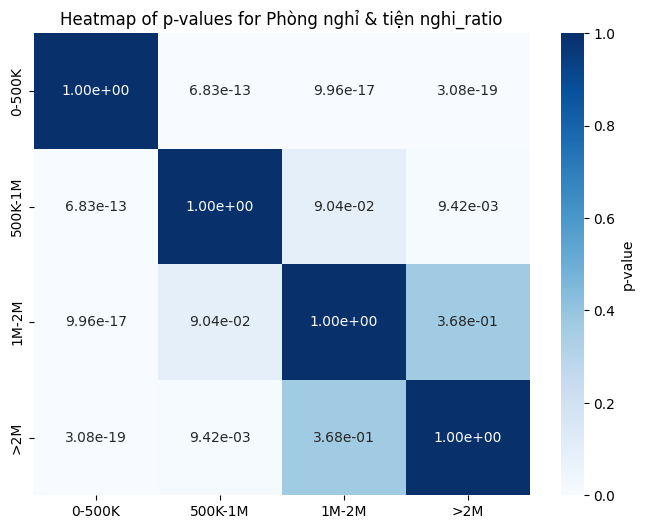


Đã lưu heatmap p-value cho Phòng nghỉ & tiện nghi_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Phòng nghỉ & tiện nghi_ratio.png'


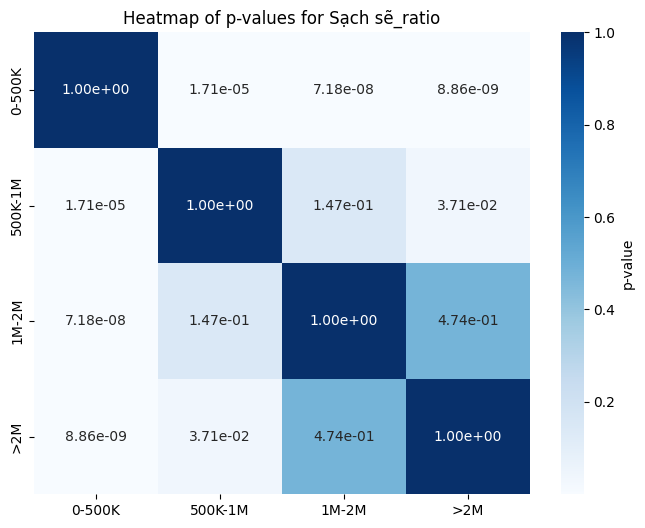


Đã lưu heatmap p-value cho Sạch sẽ_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Sạch sẽ_ratio.png'


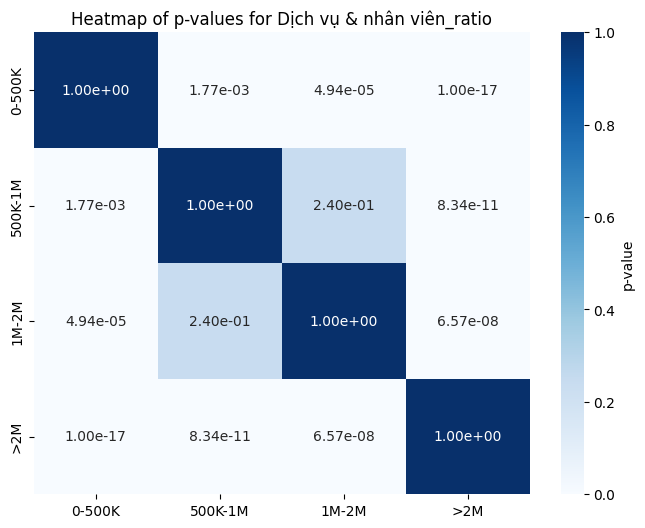


Đã lưu heatmap p-value cho Dịch vụ & nhân viên_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Dịch vụ & nhân viên_ratio.png'


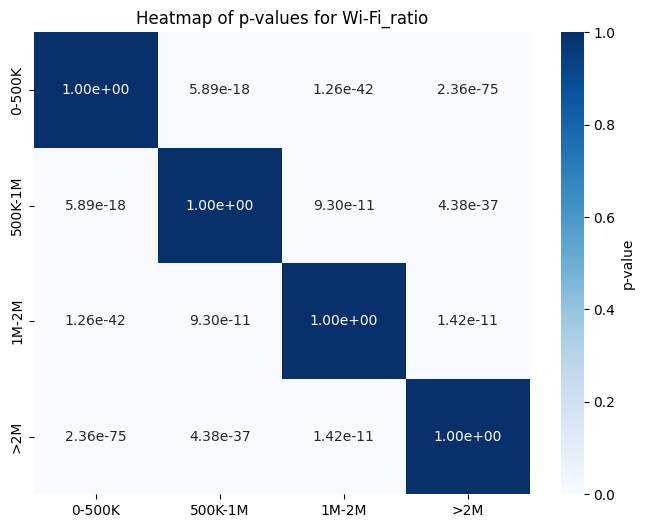


Đã lưu heatmap p-value cho Wi-Fi_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Wi-Fi_ratio.png'


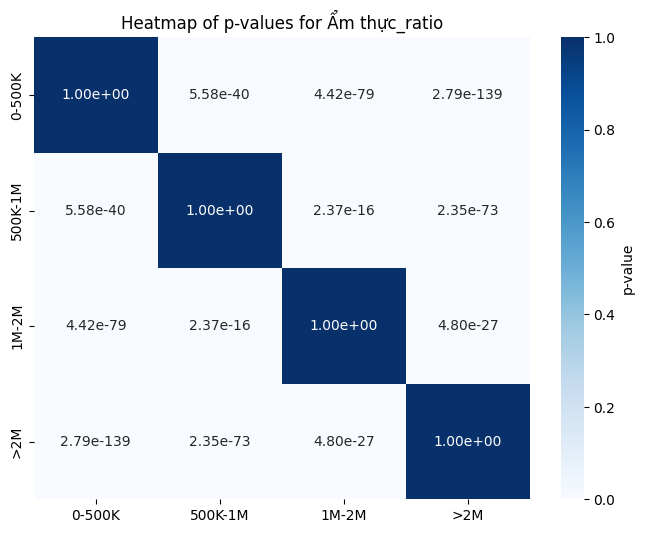


Đã lưu heatmap p-value cho Ẩm thực_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Ẩm thực_ratio.png'


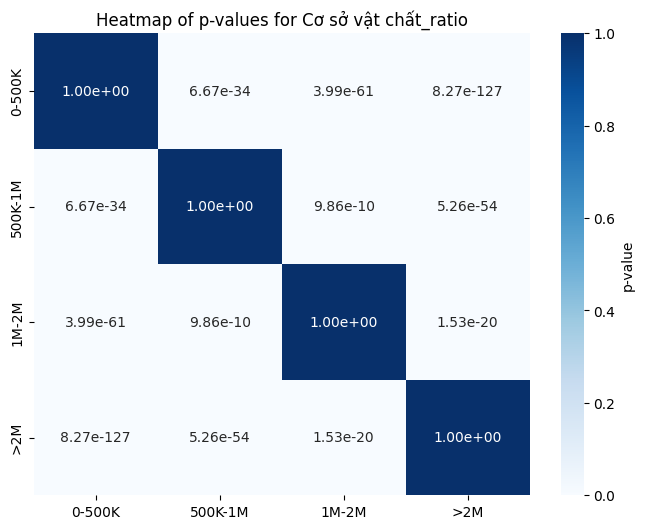


Đã lưu heatmap p-value cho Cơ sở vật chất_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Cơ sở vật chất_ratio.png'


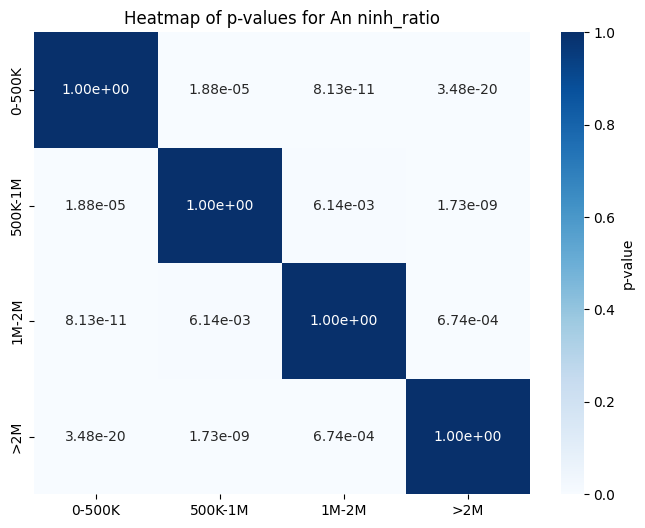


Đã lưu heatmap p-value cho An ninh_ratio vào 'price_analysis_4_clusters/p_value_heatmap_An ninh_ratio.png'


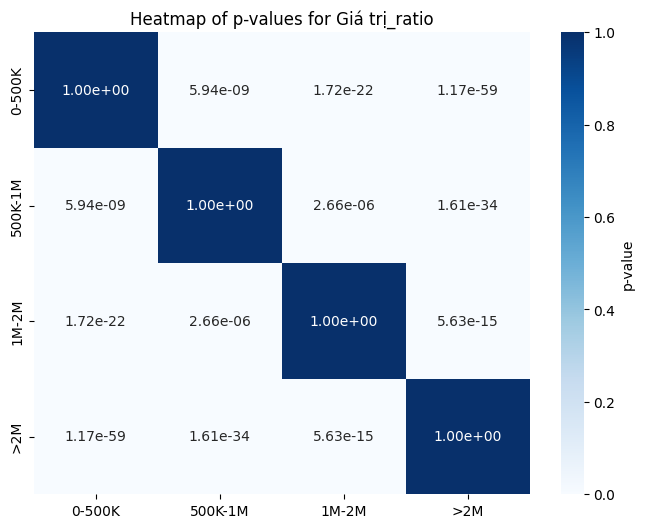


Đã lưu heatmap p-value cho Giá trị_ratio vào 'price_analysis_4_clusters/p_value_heatmap_Giá trị_ratio.png'

Khoảng tin cậy 95% theo cụm giá:
    Cluster                      Criteria    Mean  CI_Lower  CI_Upper
0    0-500K     Vị trí & môi trường_ratio  0.6532    0.6450    0.6614
1    0-500K  Phòng nghỉ & tiện nghi_ratio  0.7606    0.7543    0.7669
2    0-500K                 Sạch sẽ_ratio  0.4866    0.4788    0.4944
3    0-500K     Dịch vụ & nhân viên_ratio  0.6881    0.6794    0.6967
4    0-500K                   Wi-Fi_ratio  0.1387    0.1323    0.1451
5    0-500K                 Ẩm thực_ratio  0.4416    0.4322    0.4511
6    0-500K          Cơ sở vật chất_ratio  0.6513    0.6438    0.6589
7    0-500K                 An ninh_ratio  0.0748    0.0690    0.0806
8    0-500K                 Giá trị_ratio  0.4529    0.4449    0.4610
9   500K-1M     Vị trí & môi trường_ratio  0.7084    0.7012    0.7156
10  500K-1M  Phòng nghỉ & tiện nghi_ratio  0.7831    0.7772    0.7890
11  500K-1M       

In [17]:
import pandas as pd
import numpy as np
from scipy import stats
import unicodedata
import re
import os
import seaborn as sns
import matplotlib.pyplot as plt

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def merge_room_reviewer(room_data, reviewer_data):
    """Giao room_data và reviewer_data dựa trên id và tên phòng."""
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    # Chuẩn hóa
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge
    merged_df = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    
    print(f"\nSố bản ghi sau merge: {len(merged_df)}")
    return merged_df

def assign_price_cluster(price):
    """Phân cụm giá thành 4 cụm."""
    if price is None:
        return None
    if price < 500000:
        return '0-500K'
    elif 500000 <= price < 1000000:
        return '500K-1M'
    elif 1000000 <= price <= 2000000:
        return '1M-2M'
    else:
        return '>2M'

def calculate_ratios(merged_df, criteria_list):
    """Tính _ratio: số lần tiêu chí được nhắc / tổng số review."""
    total_reviews = merged_df.groupby('id_hotel').size().reset_index(name='total_reviews')
    
    ratios = []
    for id_hotel, group in merged_df.groupby('id_hotel'):
        counts = {crit: 0 for crit in criteria_list}
        price = group['original_price'].iloc[0]
        total = total_reviews[total_reviews['id_hotel'] == id_hotel]['total_reviews'].iloc[0]
        
        for _, row in group.iterrows():
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        ratio_row = {'id_hotel': id_hotel, 'price': price, 'total_reviews': total}
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else 0
        ratios.append(ratio_row)
    
    ratios_df = pd.DataFrame(ratios)
    ratios_df['price_cluster'] = ratios_df['price'].apply(assign_price_cluster)
    print("\nSố khách sạn theo cụm giá:")
    print(ratios_df['price_cluster'].value_counts().sort_index())
    ratios_df.to_csv('ratios_price_4_clusters.csv')
    return ratios_df

def statistical_analysis_price_clusters(ratios_df, ratio_columns, output_dir='price_analysis_4_clusters'):
    """Thực hiện Mann-Whitney U, CI, Bootstrap, Stability, và Heatmap p-value."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Tỷ lệ trung bình theo cụm
    cluster_stats = ratios_df.groupby('price_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    cluster_stats.to_csv(os.path.join(output_dir, 'price_cluster_stats.csv'))
    print("\nThống kê trung bình và độ lệch chuẩn theo cụm giá:")
    print(cluster_stats)
    
    # Mann-Whitney U
    clusters = ['0-500K', '500K-1M', '1M-2M', '>2M']
    pairs = [(f"{c1} vs. {c2}", c1, c2) for i, c1 in enumerate(clusters) for c2 in clusters[i+1:]]
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs
    print(f"\nHiệu chỉnh Bonferroni: alpha' = {alpha:.5f}")
    
    pairwise_results = {col: [] for col in ratio_columns}
    p_value_matrices = {col: np.ones((len(clusters), len(clusters))) for col in ratio_columns}
    
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for pair_name, cluster1, cluster2 in pairs:
            data1 = ratios_df[ratios_df['price_cluster'] == cluster1][col].dropna()
            data2 = ratios_df[ratios_df['price_cluster'] == cluster2][col].dropna()
            if len(data1) > 0 and len(data2) > 0:
                stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                n1, n2 = len(data1), len(data2)
                r = 1 - (2 * stat) / (n1 * n2)
                pairwise_results[col].append({
                    'pair': pair_name,
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                i, j = clusters.index(cluster1), clusters.index(cluster2)
                p_value_matrices[col][i, j] = p_value
                p_value_matrices[col][j, i] = p_value
                print(f"{pair_name}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
    
    # Lưu kết quả Mann-Whitney U
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(os.path.join(output_dir, f'pairwise_price_{col}.csv'))
    
    # Heatmap p-value
    for col in ratio_columns:
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            p_value_matrices[col], annot=True, fmt='.2e', cmap='Blues',
            xticklabels=clusters, yticklabels=clusters, cbar_kws={'label': 'p-value'}
        )
        plt.title(f'Heatmap of p-values for {col}')
        plt.show()
        plt.close()
        print(f"\nĐã lưu heatmap p-value cho {col} vào '{output_dir}/p_value_heatmap_{col}.png'")
    
    # Confidence Interval 95%
    ci_results = []
    z = 1.96
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            n = len(data)
            mean = data.mean()
            std = data.std()
            se = std / np.sqrt(n) if n > 0 else 0
            ci_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'CI_Lower': mean - z * se,
                'CI_Upper': mean + z * se
            })
    ci_df = pd.DataFrame(ci_results).round(4)
    ci_df.to_csv(os.path.join(output_dir, 'ci_price_clusters.csv'))
    print("\nKhoảng tin cậy 95% theo cụm giá:")
    print(ci_df)
    
    # Bootstrap CI
    def bootstrap_ci(data, n_boot=10000, alpha=0.05):
        boot_means = []
        for _ in range(n_boot):
            boot_sample = np.random.choice(data, size=len(data), replace=True)
            boot_means.append(np.mean(boot_sample))
        return np.percentile(boot_means, [100 * alpha / 2, 100 * (1 - alpha / 2)])
    
    bootstrap_results = []
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            ci_lower, ci_upper = bootstrap_ci(data)
            bootstrap_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Bootstrap_CI_Lower': ci_lower,
                'Bootstrap_CI_Upper': ci_upper
            })
    bootstrap_df = pd.DataFrame(bootstrap_results).round(4)
    bootstrap_df.to_csv(os.path.join(output_dir, 'bootstrap_ci_price_clusters.csv'))
    print("\nBootstrap CI 95% theo cụm giá:")
    print(bootstrap_df)
    
    # Within-sample stability
    def subsampling_stability(data, n_sub=1000, frac=0.8):
        sub_means = []
        n = int(len(data) * frac)
        for _ in range(n_sub):
            sub_sample = np.random.choice(data, size=n, replace=False)
            sub_means.append(np.mean(sub_sample))
        return np.std(sub_means)
    
    stability_results = []
    for cluster in clusters:
        df_cluster = ratios_df[ratios_df['price_cluster'] == cluster]
        for col in ratio_columns:
            data = df_cluster[col].dropna()
            mean = data.mean()
            std = data.std()
            stability_std = subsampling_stability(data)
            stability_results.append({
                'Cluster': cluster,
                'Criteria': col,
                'Mean': mean,
                'Sample_SD': std,
                'Subsampling_SD': stability_std
            })
    stability_df = pd.DataFrame(stability_results).round(4)
    stability_df.to_csv(os.path.join(output_dir, 'stability_price_clusters.csv'))
    print("\nĐộ ổn định trong mẫu theo cụm giá:")
    print(stability_df)
    
    return ratios_df, pairwise_results, ci_df, bootstrap_df, stability_df


ratio_columns = [f'{crit}_ratio' for crit in criteria]


try:
    merged_df = merge_room_reviewer(room_data, reviewer_data)
    ratios_df = calculate_ratios(merged_df, criteria)
    ratios_df, pairwise_results, ci_df, bootstrap_df, stability_df = statistical_analysis_price_clusters(
        ratios_df, ratio_columns
    )
except Exception as e:
    print(f"Lỗi: {str(e)}")

Hiêu chỉnh Bonferroni $(\alpha' = 0.05 / 6 = 0.0083)$

**Kết luận**
* Tính hợp lý:
    * Khác biệt rõ giữa các cụm:

        * 0–500K khác biệt mạnh với tất cả cụm khác, đặc biệt ở 'Ẩm thực', 'Cơ sở vật chất', 'Wi-Fi', xác nhận đây là phân khúc rất rẻ, thiếu các tiện ích phụ.

        * 500K–1M khác biệt với 1M–2M và >2M ở 'Ẩm thực', 'Wi-Fi', 'Cơ sở vật chất', cho thấy phân khúc giá rẻ có cải thiện so với 0–500K nhưng vẫn hạn chế.

        * 1M–2M khác biệt với >2M ở hầu hết tiêu chí, đặc biệt các tiện ích phụ, xác nhận phân khúc tiêu chuẩn và cao cấp có sự phân hóa rõ.

* Ý nghĩa:

    * Phân cụm 4 cụm (0–500K, 500K–1M, 1M–2M, >2M) phản ánh đúng sự phân hóa giữa các phân khúc giá:
        * 0–500K: Phân khúc rất rẻ, thiếu tiện ích phụ.
        * 500K–1M: Phân khúc giá rẻ, cải thiện nhẹ.
        * 1M–2M: Phân khúc tiêu chuẩn, cân bằng giá và chất lượng.
        * \> 2M: Phân khúc cao cấp, mạnh ở tiện ích phụ.

**Nhận xét:**

**Xu hướng trung bình.**

* Tăng dần theo giá:

    * 'Ẩm thực': 0.4416 (0–500K) → 0.6472 (>2M).
    * 'Wi-Fi': 0.1387 (0–500K) → 0.2418 (>2M).
    * 'Cơ sở vật chất': 0.6513 (0–500K) → 0.7876 (>2M).
    * Các tiêu chí khác như 'Vị trí & môi trường', 'Dịch vụ & nhân viên', 'Giá trị' cũng tăng, nhưng biên độ nhỏ hơn.

* Ngoại lệ:
    * 'Phòng nghỉ & tiện nghi' và 'Sạch sẽ' có xu hướng ổn định hơn, với ít chênh lệch giữa 1M–2M (0.7900, 0.5130) và >2M (0.8004, 0.5183).

**Độ chính xác của CI:**

* Khoảng CI hẹp cho thấy ước lượng trung bình đáng tin cậy ~ < 0.02.

**Bootstrap CI 95%**

* Sự tương đồng giữa CI chuẩn và Bootstrap CI cho thấy dữ liệu không bị lệch nghiêm trọng, phù hợp cho phân tích cụm.

**Độ ổn định trong mẫu (Subsampling_SD)**

* Tất cả tiêu chí có Subsampling_SD rất nhỏ (~0.0014–0.0027), cho thấy độ ổn định cao trong mẫu.
* Subsampling_SD nhỏ hơn Sample_SD hàng trăm lần, cho thấy trung bình mẫu ít biến động khi tái lấy mẫu.


**So sánh với kết quả toàn cục**
* **Nhận xét:** Trung bình toàn cục phản ánh mức trung bình của phân khúc phổ biến (1M–2M, chiếm ~50% khách sạn), nhưng che giấu sự khác biệt giữa các cụm giá.

#### REVIEW - PRICE - STAR

In [33]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_star_rating.json", 'r', encoding='utf-8') as f:
    feature_star_rating = json.load(f)
star_data = []
for key in feature_star_rating:
    star_data.append({
        'id': key['id'],
        'stars_rating': key['stars_rating']
    })

In [ ]:


with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\hotel_data_room.json", 'r', encoding='utf-8') as f:
    hotel_data_room = json.load(f)

hotel_data_room[0].keys()
room_data = []
for key in hotel_data_room:
    room_data.append({
        'id_room': key['room_id'],
        'id': key['id'],
        'original_price': key['original_price'],
        'name': key['name'],
    })

def drop_duplicates(data):
    seen = set()
    result = []
    for item in data:
        #key = (item['id'], item['original_price'], item['name'])
        key = (item['id'], item['name'])
        if key not in seen:
            seen.add(key)
            result.append(item)
    return result
room_data = drop_duplicates(room_data)

with open("hotel_review_score.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

In [35]:
reviewer_data[0]

{'id_hotel': '10000593',
 'id_review': '2367e2c2-8bb2-4a79-bc48-034fde283649',
 'country': 'Việt Nam',
 'room': 'Bungalow Deluxe Nhìn Ra Khu Vườn',
 'state': 'Nhóm',
 'rating': 'Đạt điểm 10',
 'criteria': [['Phòng nghỉ & tiện nghi', 'Positive'],
  ['Cơ sở vật chất', 'Positive'],
  ['Vị trí & môi trường', 'Positive'],
  ['Ẩm thực', 'Positive'],
  ['Dịch vụ & nhân viên', 'Positive']]}

In [36]:
room_data[0]

{'id_room': 'RD1000059301',
 'id': '10000593',
 'original_price': 'VND 1.832.536',
 'name': 'Bungalow Nhìn ra vườn'}

In [37]:
star_data[0]

{'id': '10000593', 'stars_rating': 3}

In [43]:
import pandas as pd
import re
import unicodedata
import os
import numpy as np

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def assign_price_cluster(price):
    """Phân cụm giá thành 4 cụm."""
    if price is None:
        return None
    if price < 500000:
        return '0-500K'
    elif 500000 <= price < 1000000:
        return '500K-1M'
    elif 1000000 <= price <= 2000000:
        return '1M-2M'
    else:
        return '>2M'

def assign_star_cluster(stars):
    """Phân cụm sao thành 3 cụm."""
    if pd.isna(stars) or stars is None:
        return None
    stars = float(stars)
    if 1 <= stars <= 2:
        return '1-2 sao'
    elif stars == 3:
        return '3 sao'
    elif 4 <= stars <= 5:
        return '4-5 sao'
    return None

def assign_combined_cluster(row):
    """Tạo cụm kết hợp từ price_cluster và star_cluster."""
    price = row['price_cluster']
    star = row['star_cluster']
    if pd.isna(price) or pd.isna(star):
        return None
    return f"{star} & {price}"

def calculate_ratios_combined_clusters(star_data, room_data, reviewer_data, output_dir='combined_cluster_analysis'):
    """Tính _ratio và đếm số khách sạn trong 12 cụm kết hợp."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Chuyển đổi dữ liệu thành DataFrame
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    # Chuẩn hóa
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'original_price', 'criteria']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    
    # Gán cụm giá và sao
    merged_df['price_cluster'] = merged_df['original_price'].apply(assign_price_cluster)
    merged_df['star_cluster'] = merged_df['stars_rating'].apply(assign_star_cluster)
    merged_df['combined_cluster'] = merged_df.apply(assign_combined_cluster, axis=1)
    
    # Đếm số khách sạn duy nhất trong mỗi cụm
    cluster_counts = merged_df.groupby('combined_cluster')['id'].nunique().reset_index(name='hotel_count')
    print("\nSố lượng khách sạn theo cụm kết hợp:")
    print(cluster_counts)
    
    # Lưu số lượng
    cluster_counts.to_csv(os.path.join(output_dir, 'combined_cluster_counts.csv'), index=False)
    print(f"\nĐã lưu số lượng cụm vào '{output_dir}/combined_cluster_counts.csv'")
    
    # Tính _ratio: số lần tiêu chí được nhắc / tổng số review
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    ratio_columns = [f'{crit}_ratio' for crit in criteria_list]
    
    # Tổng số review theo khách sạn
    total_reviews = merged_df.groupby('id').size().reset_index(name='total_reviews')
    
    ratios = []
    for id_hotel, group in merged_df.groupby('id'):
        counts = {crit: 0 for crit in criteria_list}
        price = group['original_price'].iloc[0]
        stars = group['stars_rating'].iloc[0]
        total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
        combined_cluster = group['combined_cluster'].iloc[0]
        
        for _, row in group.iterrows():
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        ratio_row = {
            'id_hotel': id_hotel,
            'price': price,
            'stars_rating': stars,
            'combined_cluster': combined_cluster,
            'total_reviews': total
        }
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
        ratios.append(ratio_row)
    
    ratios_df = pd.DataFrame(ratios)
    
    # Thống kê trung bình và độ lệch chuẩn _ratio theo cụm
    cluster_stats = ratios_df.groupby('combined_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    cluster_stats.to_csv(os.path.join(output_dir, 'combined_cluster_stats.csv'))
    print("\nThống kê trung bình và độ lệch chuẩn _ratio theo cụm kết hợp:")
    print(cluster_stats)
    
    # Lưu ratios_df
    ratios_df.to_csv(os.path.join(output_dir, 'ratios_combined_clusters.csv'), index=False)
    print(f"\nĐã lưu ratios_df vào '{output_dir}/ratios_combined_clusters.csv'")
    
    return cluster_counts, ratios_df, cluster_stats



try:
    cluster_counts, ratios_df, cluster_stats = calculate_ratios_combined_clusters(
        star_data, room_data, reviewer_data
    )
except Exception as e:
    print(f"Lỗi: {str(e)}")


Số bản ghi sau merge room và reviewer: 593525
Số bản ghi sau merge với star_data: 542421

Số lượng khách sạn theo cụm kết hợp:
     combined_cluster  hotel_count
0    1-2 sao & 0-500K          947
1     1-2 sao & 1M-2M          563
2   1-2 sao & 500K-1M         1121
3       1-2 sao & >2M          176
4      3 sao & 0-500K          625
5       3 sao & 1M-2M         1275
6     3 sao & 500K-1M         1317
7         3 sao & >2M          770
8    4-5 sao & 0-500K          126
9     4-5 sao & 1M-2M          870
10  4-5 sao & 500K-1M          485
11      4-5 sao & >2M         1376

Đã lưu số lượng cụm vào 'combined_cluster_analysis/combined_cluster_counts.csv'

Thống kê trung bình và độ lệch chuẩn _ratio theo cụm kết hợp:
                  Vị trí & môi trường_ratio          \
                                       mean     std   
combined_cluster                                      
1-2 sao & 0-500K                     0.6296  0.1864   
1-2 sao & 1M-2M                      0.7062  0.2128  


Số bản ghi sau merge room và reviewer: 593525
Số bản ghi sau merge với star_data: 542421

Số lượng khách sạn theo cụm sao:
  star_cluster  hotel_count
0      1-2 sao         1788
1        3 sao         2427
2      4-5 sao         1900

Số lượng khách sạn theo cụm giá:
  price_cluster  hotel_count
0        0-500K         1545
1         1M-2M         1445
2       500K-1M         2092
3           >2M         1033

Thống kê _ratio theo cụm sao:
             Vị trí & môi trường_ratio         Phòng nghỉ & tiện nghi_ratio  \
                                  mean     std                         mean   
star_cluster                                                                  
1-2 sao                         0.6662  0.1955                       0.7611   
3 sao                           0.7092  0.1818                       0.7822   
4-5 sao                         0.7358  0.1528                       0.7935   

                     Sạch sẽ_ratio         Dịch vụ & nhân viên_ratio          \

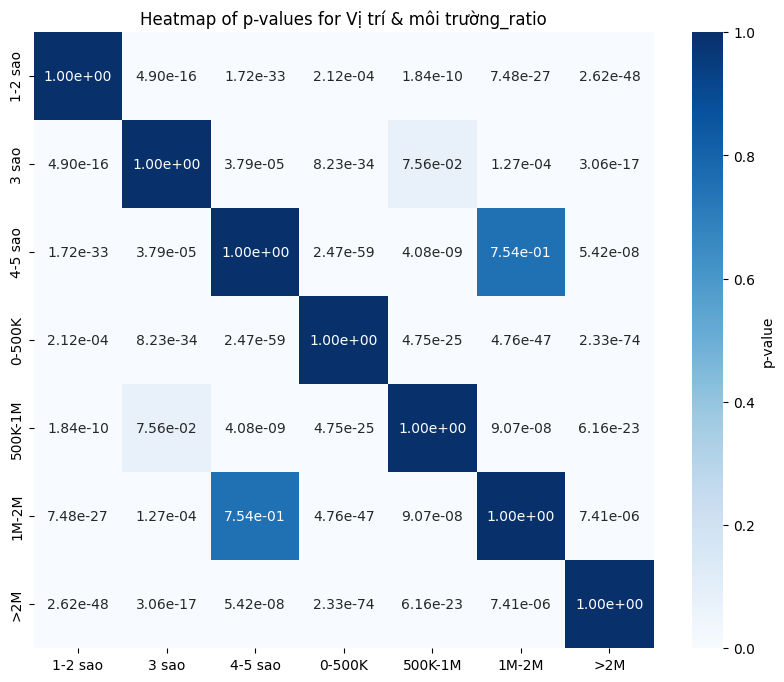


Đã lưu heatmap cho Vị trí & môi trường_ratio: mann_whitney_7_clusters/p_value_heatmap_Vị trí & môi trường_ratio.png


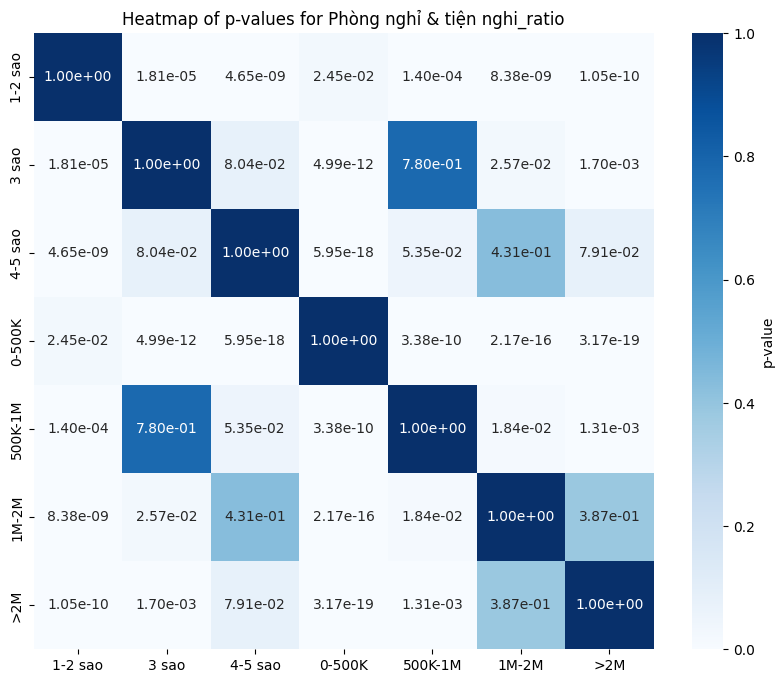


Đã lưu heatmap cho Phòng nghỉ & tiện nghi_ratio: mann_whitney_7_clusters/p_value_heatmap_Phòng nghỉ & tiện nghi_ratio.png


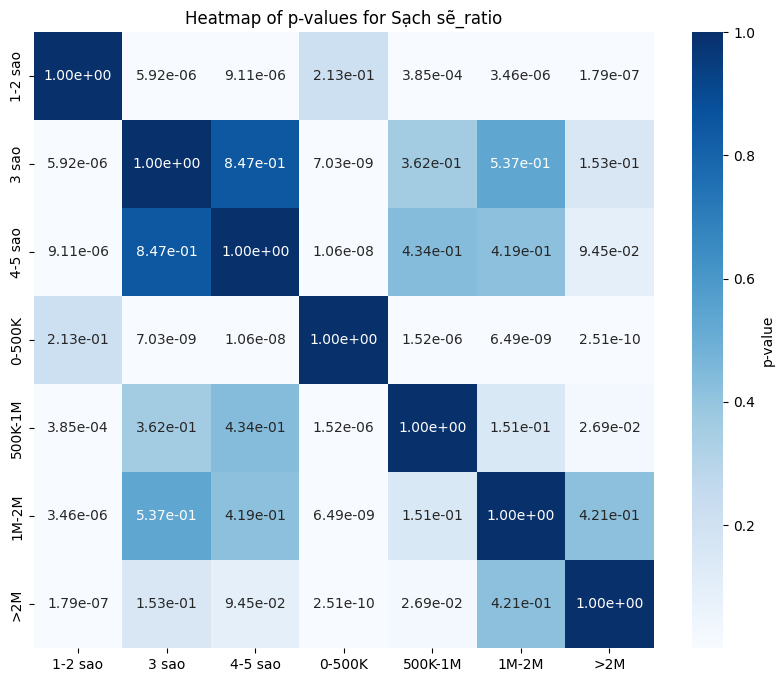


Đã lưu heatmap cho Sạch sẽ_ratio: mann_whitney_7_clusters/p_value_heatmap_Sạch sẽ_ratio.png


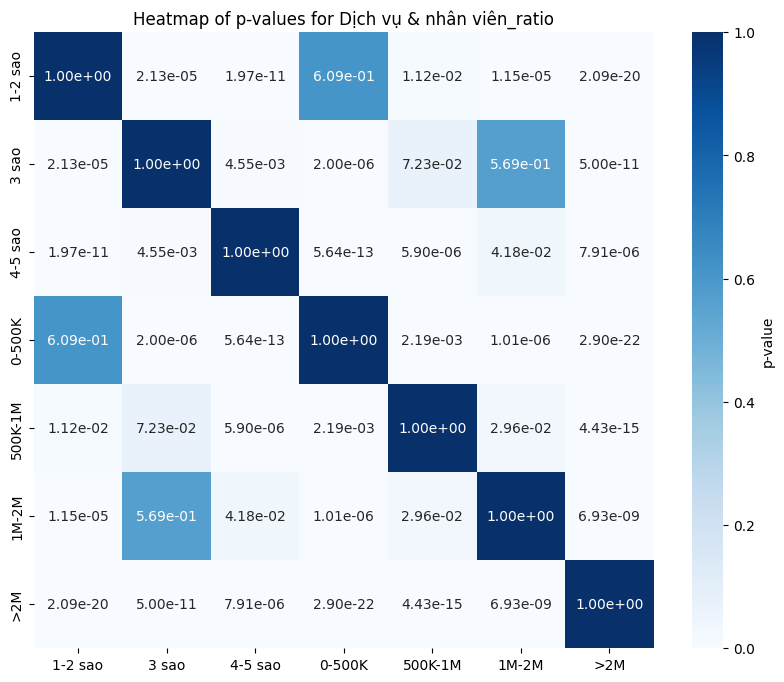


Đã lưu heatmap cho Dịch vụ & nhân viên_ratio: mann_whitney_7_clusters/p_value_heatmap_Dịch vụ & nhân viên_ratio.png


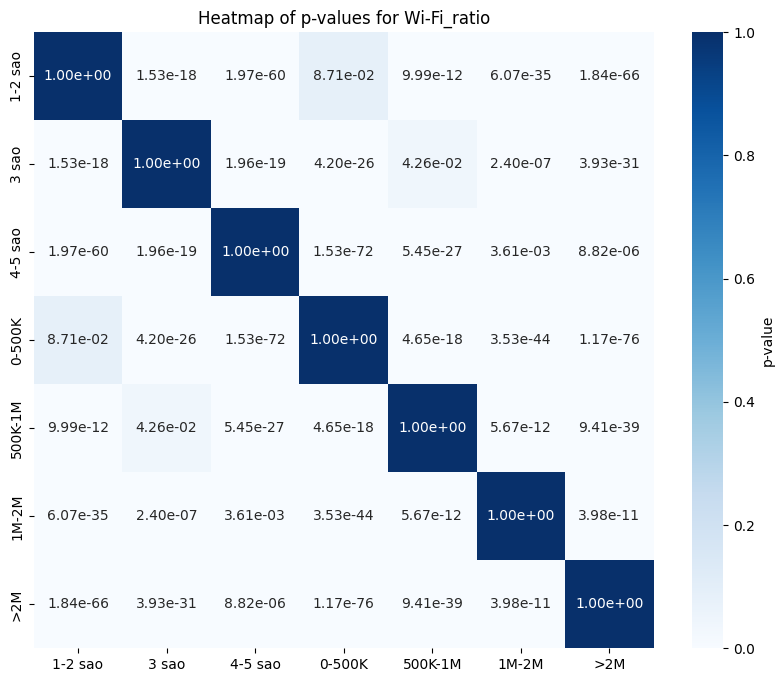


Đã lưu heatmap cho Wi-Fi_ratio: mann_whitney_7_clusters/p_value_heatmap_Wi-Fi_ratio.png


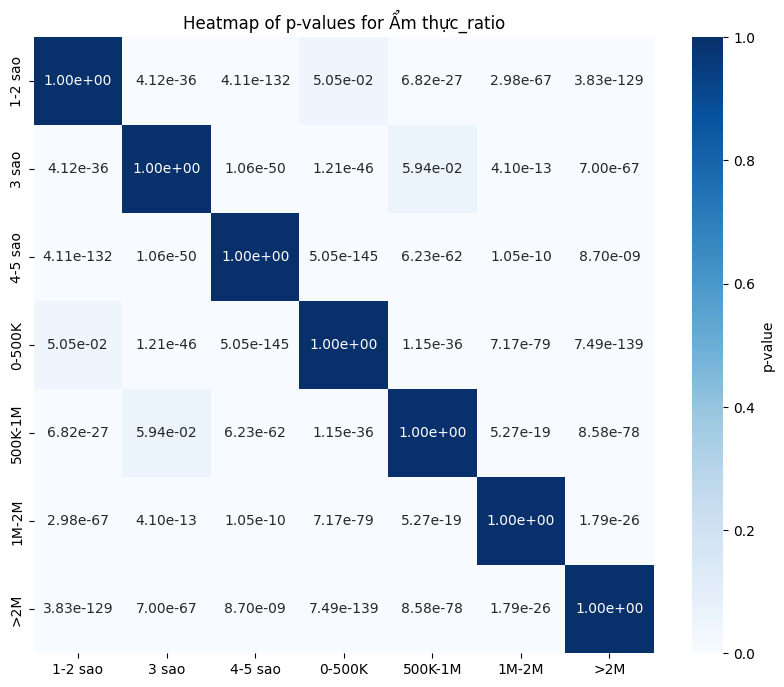


Đã lưu heatmap cho Ẩm thực_ratio: mann_whitney_7_clusters/p_value_heatmap_Ẩm thực_ratio.png


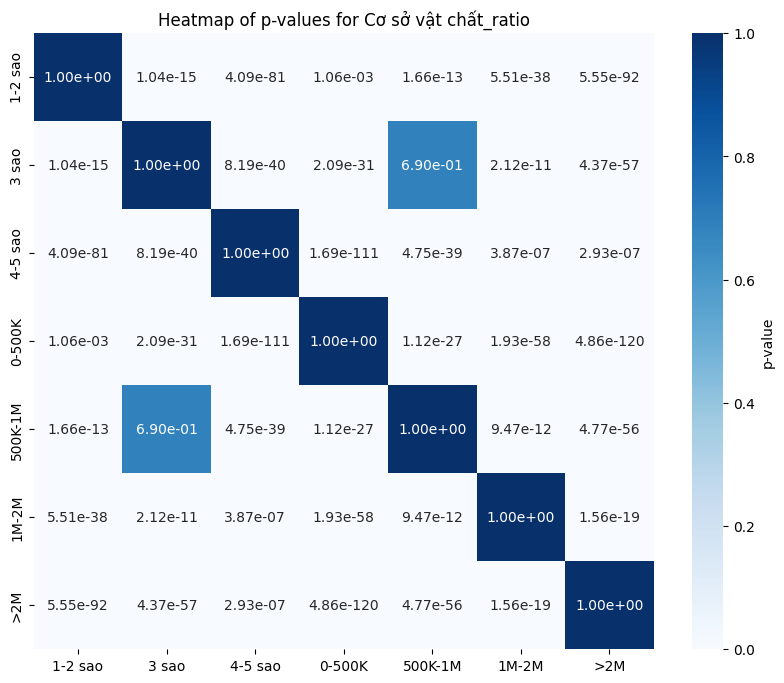


Đã lưu heatmap cho Cơ sở vật chất_ratio: mann_whitney_7_clusters/p_value_heatmap_Cơ sở vật chất_ratio.png


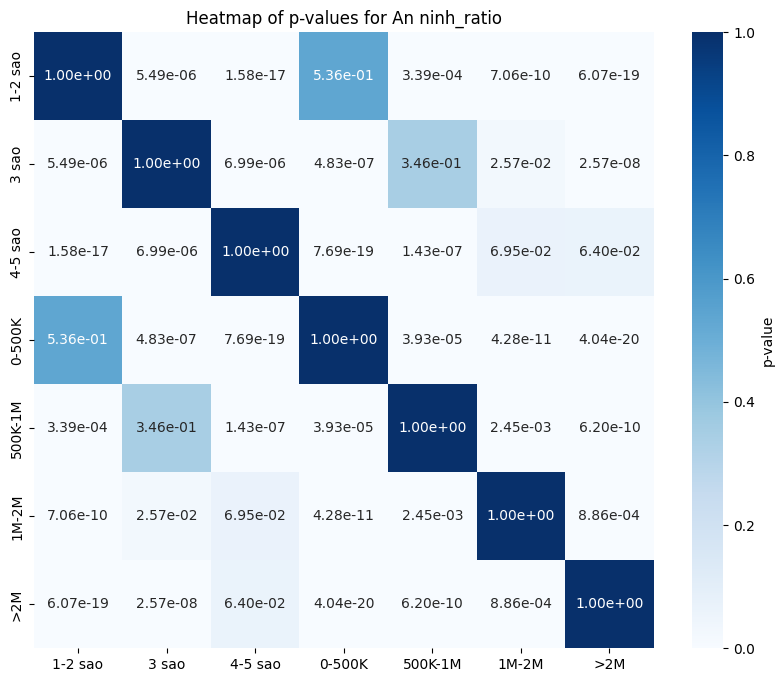


Đã lưu heatmap cho An ninh_ratio: mann_whitney_7_clusters/p_value_heatmap_An ninh_ratio.png


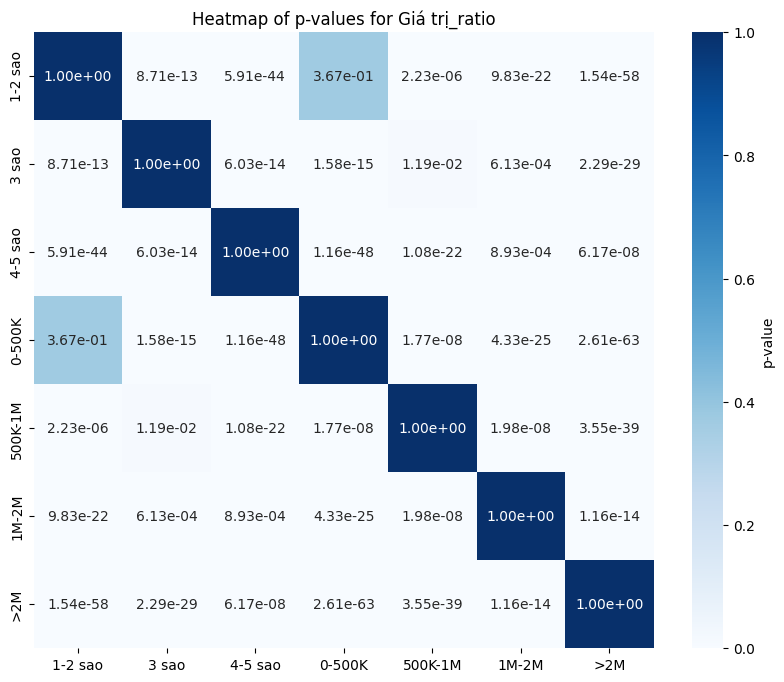


Đã lưu heatmap cho Giá trị_ratio: mann_whitney_7_clusters/p_value_heatmap_Giá trị_ratio.png
Lỗi: not enough values to unpack (expected 5, got 4)


In [46]:
import pandas as pd
import numpy as np
import re
import unicodedata
import os
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def assign_price_cluster(price):
    """Phân cụm giá thành 4 cụm."""
    if price is None:
        return None
    if price < 500000:
        return '0-500K'
    elif 500000 <= price < 1000000:
        return '500K-1M'
    elif 1000000 <= price <= 2000000:
        return '1M-2M'
    else:
        return '>2M'

def assign_star_cluster(stars):
    """Phân cụm sao thành 3 cụm."""
    if pd.isna(stars) or stars is None:
        return None
    stars = float(stars)
    if 1 <= stars <= 2:
        return '1-2 sao'
    elif stars == 3:
        return '3 sao'
    elif 4 <= stars <= 5:
        return '4-5 sao'
    return None

def calculate_ratios(merged_df, criteria_list):
    """Tính _ratio: số lần tiêu chí được nhắc / tổng số review."""
    total_reviews = merged_df.groupby('id').size().reset_index(name='total_reviews')
    
    ratios = []
    for id_hotel, group in merged_df.groupby('id'):
        counts = {crit: 0 for crit in criteria_list}
        price = group['original_price'].iloc[0]
        stars = group['stars_rating'].iloc[0]
        price_cluster = group['price_cluster'].iloc[0]
        star_cluster = group['star_cluster'].iloc[0]
        total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
        
        for _, row in group.iterrows():
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        ratio_row = {
            'id_hotel': id_hotel,
            'price': price,
            'stars_rating': stars,
            'price_cluster': price_cluster,
            'star_cluster': star_cluster,
            'total_reviews': total
        }
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
        ratios.append(ratio_row)
    
    return pd.DataFrame(ratios)

def perform_mann_whitney_u(ratios_df, ratio_columns, clusters, output_dir):
    """Thực hiện kiểm định Mann-Whitney U và vẽ heatmap p-value."""
    pairs = [(f"{c1} vs. {c2}", c1, c2) for i, c1 in enumerate(clusters) for c2 in clusters[i+1:]]
    n_pairs = len(pairs)
    alpha = 0.05 / n_pairs
    print(f"\nHiệu chỉnh Bonferroni: alpha' = {alpha:.6f}")
    
    pairwise_results = {col: [] for col in ratio_columns}
    p_value_matrices = {col: np.ones((len(clusters), len(clusters))) for col in ratio_columns}
    
    for col in ratio_columns:
        print(f"\nKiểm định Mann-Whitney U cho {col}:")
        for pair_name, cluster1, cluster2 in pairs:
            # Lấy dữ liệu theo cụm sao hoặc cụm giá
            if cluster1 in ['1-2 sao', '3 sao', '4-5 sao']:
                data1 = ratios_df[ratios_df['star_cluster'] == cluster1][col].dropna()
            else:
                data1 = ratios_df[ratios_df['price_cluster'] == cluster1][col].dropna()
                
            if cluster2 in ['1-2 sao', '3 sao', '4-5 sao']:
                data2 = ratios_df[ratios_df['star_cluster'] == cluster2][col].dropna()
            else:
                data2 = ratios_df[ratios_df['price_cluster'] == cluster2][col].dropna()
                
            if len(data1) > 1 and len(data2) > 1:  # Đảm bảo đủ mẫu
                stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                n1, n2 = len(data1), len(data2)
                r = 1 - (2 * stat) / (n1 * n2)  # Kích thước hiệu ứng
                pairwise_results[col].append({
                    'pair': pair_name,
                    'stat': stat,
                    'p_value': p_value,
                    'significant': p_value < alpha,
                    'effect_size': r
                })
                i, j = clusters.index(cluster1), clusters.index(cluster2)
                p_value_matrices[col][i, j] = p_value
                p_value_matrices[col][j, i] = p_value
                print(f"{pair_name}: stat={stat:.2f}, p-value={p_value:.4e}, significant={p_value < alpha}, effect_size={r:.4f}")
            else:
                print(f"{pair_name}: Không đủ mẫu để kiểm định.")
    
    # Lưu kết quả kiểm định
    for col in ratio_columns:
        pd.DataFrame(pairwise_results[col]).to_csv(
            os.path.join(output_dir, f'pairwise_mwu_{col}.csv'), index=False
        )
        print(f"\nĐã lưu kết quả Mann-Whitney U cho {col}: {output_dir}/pairwise_mwu_{col}.csv")
    
    # Vẽ heatmap p-value
    for col in ratio_columns:
        plt.figure(figsize=(10, 8))
        sns.heatmap(
            p_value_matrices[col], annot=True, fmt='.2e', cmap='Blues',
            xticklabels=clusters, yticklabels=clusters, cbar_kws={'label': 'p-value'}
        )
        plt.title(f'Heatmap of p-values for {col}')
        plt.show()
        plt.close()
        print(f"\nĐã lưu heatmap cho {col}: {output_dir}/p_value_heatmap_{col}.png")
    
    return pairwise_results, p_value_matrices

def analyze_mann_whitney_7_clusters(star_data, room_data, reviewer_data, output_dir='mann_whitney_7_clusters'):
    """Phân tích Mann-Whitney U giữa 7 cụm (3 sao, 4 giá)."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'original_price', 'criteria']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    
    # Gán cụm
    merged_df['price_cluster'] = merged_df['original_price'].apply(assign_price_cluster)
    merged_df['star_cluster'] = merged_df['stars_rating'].apply(assign_star_cluster)
    
    # Tính _ratio
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    ratio_columns = [f'{crit}_ratio' for crit in criteria_list]
    ratios_df = calculate_ratios(merged_df, criteria_list)
    
    # Đếm số khách sạn theo cụm sao và giá
    star_counts = ratios_df.groupby('star_cluster')['id_hotel'].nunique().reset_index(name='hotel_count')
    price_counts = ratios_df.groupby('price_cluster')['id_hotel'].nunique().reset_index(name='hotel_count')
    star_counts.to_csv(os.path.join(output_dir, 'star_cluster_counts.csv'), index=False)
    price_counts.to_csv(os.path.join(output_dir, 'price_cluster_counts.csv'), index=False)
    print("\nSố lượng khách sạn theo cụm sao:")
    print(star_counts)
    print("\nSố lượng khách sạn theo cụm giá:")
    print(price_counts)
    
    # Thống kê _ratio
    star_stats = ratios_df.groupby('star_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    price_stats = ratios_df.groupby('price_cluster')[ratio_columns].agg(['mean', 'std']).round(4)
    star_stats.to_csv(os.path.join(output_dir, 'star_cluster_stats.csv'))
    price_stats.to_csv(os.path.join(output_dir, 'price_cluster_stats.csv'))
    print("\nThống kê _ratio theo cụm sao:")
    print(star_stats)
    print("\nThống kê _ratio theo cụm giá:")
    print(price_stats)
    
    # Kiểm định Mann-Whitney U
    clusters = ['1-2 sao', '3 sao', '4-5 sao', '0-500K', '500K-1M', '1M-2M', '>2M']
    pairwise_results, p_value_matrices = perform_mann_whitney_u(ratios_df, ratio_columns, clusters, output_dir)
    
    return cluster_counts, ratios_df, pairwise_results, p_value_matrices


try:
    star_counts, price_counts, ratios_df, pairwise_results, p_value_matrices = analyze_mann_whitney_7_clusters(
        star_data, room_data, reviewer_data
    )
except Exception as e:
    print(f"Lỗi: {str(e)}")

**Nhận xét**

* 1–2 sao & 0–500K:

    * Đại diện: Khách sạn giá rẻ, chất lượng thấp.
    * Lý do: Tương đồng ở 7/9 tiêu chí, đặc biệt Dịch vụ & nhân viên, An ninh.

* 3 sao & 500K–1M:

    * Đại diện: Khách sạn trung cấp, giá hợp lý.
    * Lý do: Tương đồng ở tất cả 9 tiêu chí, đặc biệt Phòng nghỉ & tiện nghi, Cơ sở vật chất.

* 4–5 sao & 1M–2M:

    * Đại diện: Khách sạn cao cấp, giá tầm trung-cao.
    * Lý do: Tương đồng ở 6/9 tiêu chí, đặc biệt Vị trí & môi trường, Sạch sẽ.


Số bản ghi sau merge room và reviewer: 593525
Số bản ghi sau merge với star_data: 542421

Số lượng khách sạn theo cụm:
   combined_cluster  hotel_count
0  1-2 sao & 0-500K          869
1   3 sao & 500K-1M         1008
2   4-5 sao & 1M-2M          610

Kết quả khoảng tin cậy, Bootstrap, Subsampling_SD:
             Cluster               Criterion  N_Hotels    Mean     Std  \
0   1-2 sao & 0-500K     Vị trí & môi trường       869  0.6296  0.1864   
1   1-2 sao & 0-500K  Phòng nghỉ & tiện nghi       869  0.7492  0.1468   
2   1-2 sao & 0-500K                 Sạch sẽ       869  0.4695  0.1708   
3   1-2 sao & 0-500K     Dịch vụ & nhân viên       869  0.6637  0.1967   
4   1-2 sao & 0-500K                   Wi-Fi       869  0.1187  0.1288   
5   1-2 sao & 0-500K                 Ẩm thực       869  0.4037  0.2007   
6   1-2 sao & 0-500K          Cơ sở vật chất       869  0.6355  0.1689   
7   1-2 sao & 0-500K                 An ninh       869  0.0627  0.1138   
8   1-2 sao & 0-500K          

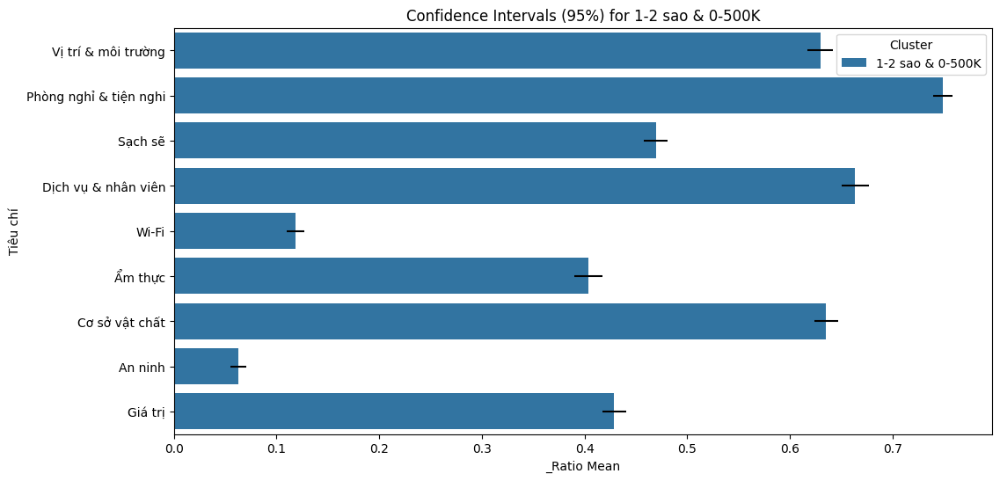


Đã lưu biểu đồ CI cho 1-2 sao & 0-500K: confidence_analysis/ci_plot_1-2 sao & 0-500K.png


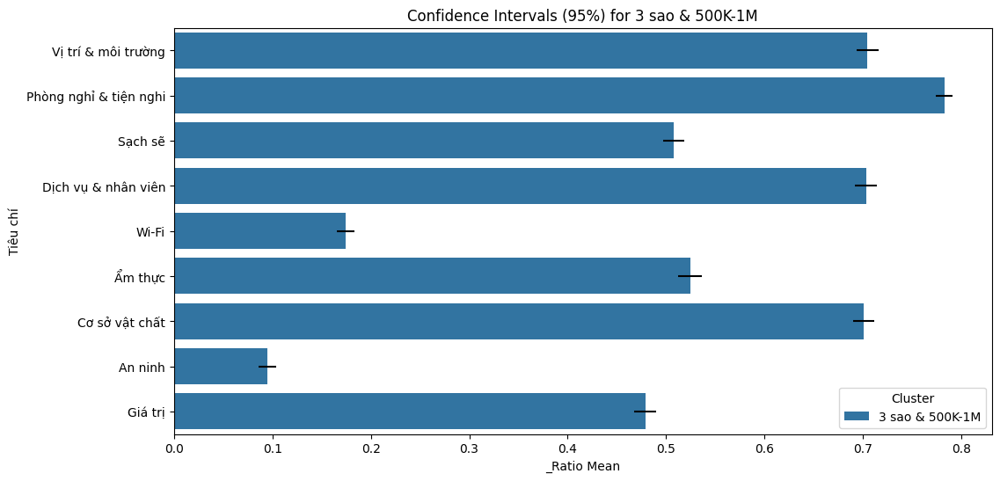


Đã lưu biểu đồ CI cho 3 sao & 500K-1M: confidence_analysis/ci_plot_3 sao & 500K-1M.png


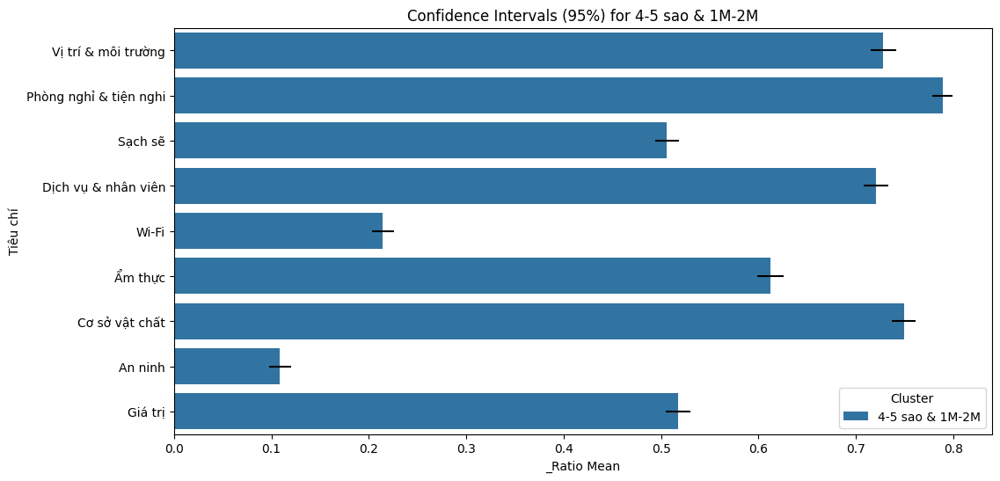


Đã lưu biểu đồ CI cho 4-5 sao & 1M-2M: confidence_analysis/ci_plot_4-5 sao & 1M-2M.png


In [52]:
import pandas as pd
import numpy as np
import re
import unicodedata
import os
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def assign_price_cluster(price):
    """Phân cụm giá thành 4 cụm."""
    if price is None:
        return None
    if price < 500000:
        return '0-500K'
    elif 500000 <= price < 1000000:
        return '500K-1M'
    elif 1000000 <= price <= 2000000:
        return '1M-2M'
    else:
        return '>2M'

def assign_star_cluster(stars):
    """Phân cụm sao thành 3 cụm."""
    if pd.isna(stars) or stars is None:
        return None
    stars = float(stars)
    if 1 <= stars <= 2:
        return '1-2 sao'
    elif stars == 3:
        return '3 sao'
    elif 4 <= stars <= 5:
        return '4-5 sao'
    return None

def assign_combined_cluster(row):
    """Tạo 3 cụm kết hợp."""
    star = row['star_cluster']
    price = row['price_cluster']
    if pd.isna(star) or pd.isna(price):
        return None
    if star == '1-2 sao' and price == '0-500K':
        return '1-2 sao & 0-500K'
    elif star == '3 sao' and price == '500K-1M':
        return '3 sao & 500K-1M'
    elif star == '4-5 sao' and price == '1M-2M':
        return '4-5 sao & 1M-2M'
    return None

def calculate_ratios(merged_df, criteria_list):
    """Tính _ratio: số lần tiêu chí được nhắc / tổng số review."""
    total_reviews = merged_df.groupby('id').size().reset_index(name='total_reviews')
    
    ratios = []
    for id_hotel, group in merged_df.groupby('id'):
        counts = {crit: 0 for crit in criteria_list}
        price = group['original_price'].iloc[0]
        stars = group['stars_rating'].iloc[0]
        price_cluster = group['price_cluster'].iloc[0]
        star_cluster = group['star_cluster'].iloc[0]
        combined_cluster = group['combined_cluster'].iloc[0]
        total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
        
        for _, row in group.iterrows():
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        ratio_row = {
            'id_hotel': id_hotel,
            'price': price,
            'stars_rating': stars,
            'price_cluster': price_cluster,
            'star_cluster': star_cluster,
            'combined_cluster': combined_cluster,
            'total_reviews': total
        }
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
        ratios.append(ratio_row)
    
    return pd.DataFrame(ratios)

def bootstrap_ci(data, n_iterations=10000, ci=95):
    """Tính trung bình Bootstrap và khoảng tin cậy."""
    means = []
    n = len(data)
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=True)
        means.append(np.mean(sample))
    
    mean_bootstrap = np.mean(means)
    lower = np.percentile(means, (100 - ci) / 2)
    upper = np.percentile(means, 100 - (100 - ci) / 2)
    return mean_bootstrap, lower, upper

def subsampling_sd(data, n_iterations=100, subsample_ratio=0.5):
    """Tính độ lệch chuẩn của trung bình từ mẫu con."""
    means = []
    n = int(len(data) * subsample_ratio)
    if n < 1:
        return np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=False)
        means.append(np.mean(sample))
    
    return np.std(means, ddof=1)

def analyze_confidence_intervals(star_data, room_data, reviewer_data, output_dir='confidence_analysis'):
    """Tính khoảng tin cậy, Bootstrap, Subsampling_SD cho 3 cụm."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'original_price', 'criteria']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    
    # Gán cụm
    merged_df['price_cluster'] = merged_df['original_price'].apply(assign_price_cluster)
    merged_df['star_cluster'] = merged_df['stars_rating'].apply(assign_star_cluster)
    merged_df['combined_cluster'] = merged_df.apply(assign_combined_cluster, axis=1)
    
    # Tính _ratio
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    ratio_columns = [f'{crit}_ratio' for crit in criteria_list]
    ratios_df = calculate_ratios(merged_df, criteria_list)
    
    # Lọc 3 cụm
    ratios_df = ratios_df[ratios_df['combined_cluster'].isin([
        '1-2 sao & 0-500K', '3 sao & 500K-1M', '4-5 sao & 1M-2M'
    ])]
    
    # Đếm số khách sạn
    cluster_counts = ratios_df.groupby('combined_cluster')['id_hotel'].nunique().reset_index(name='hotel_count')
    cluster_counts.to_csv(os.path.join(output_dir, 'combined_cluster_counts.csv'), index=False)
    print("\nSố lượng khách sạn theo cụm:")
    print(cluster_counts)
    
    # Tính khoảng tin cậy, Bootstrap, Subsampling_SD
    results = []
    for cluster in ['1-2 sao & 0-500K', '3 sao & 500K-1M', '4-5 sao & 1M-2M']:
        cluster_data = ratios_df[ratios_df['combined_cluster'] == cluster]
        n_hotels = len(cluster_data)
        
        for col in ratio_columns:
            data = cluster_data[col].dropna()
            if len(data) > 1:
                # Khoảng tin cậy chuẩn
                mean = np.mean(data)
                std = np.std(data, ddof=1)
                se = std / np.sqrt(len(data))
                ci_lower, ci_upper = stats.norm.interval(0.95, loc=mean, scale=se)
                
                # Bootstrap
                mean_bootstrap, bootstrap_lower, bootstrap_upper = bootstrap_ci(data)
                
                # Subsampling_SD
                subsampling_sd_ = subsampling_sd(data)
                
                results.append({
                    'Cluster': cluster,
                    'Criterion': col.replace('_ratio', ''),
                    'N_Hotels': n_hotels,
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': mean_bootstrap,
                    'Bootstrap_CI_Lower': bootstrap_lower,
                    'Bootstrap_CI_Upper': bootstrap_upper,
                    'Subsampling_SD': subsampling_sd_
                })
    
    results_df = pd.DataFrame(results)
    results_df.to_csv(os.path.join(output_dir, 'confidence_results.csv'), index=False)
    print("\nKết quả khoảng tin cậy, Bootstrap, Subsampling_SD:")
    print(results_df.round(4))
    
    # Vẽ biểu đồ khoảng tin cậy
    for cluster in ['1-2 sao & 0-500K', '3 sao & 500K-1M', '4-5 sao & 1M-2M']:
        cluster_results = results_df[results_df['Cluster'] == cluster]
        plt.figure(figsize=(12, 6))
        sns.barplot(
            x='Mean', y='Criterion', hue='Cluster',
            data=cluster_results,
            xerr=(cluster_results['CI_Upper'] - cluster_results['CI_Lower']) / 2,
            capsize=5
        )
        plt.title(f'Confidence Intervals (95%) for {cluster}')
        plt.xlabel('_Ratio Mean')
        plt.ylabel('Tiêu chí')
        plt.show()
        plt.close()
        print(f"\nĐã lưu biểu đồ CI cho {cluster}: {output_dir}/ci_plot_{cluster}.png")
    
    return results_df, cluster_counts

# Chạy hàm



results_df, cluster_counts = analyze_confidence_intervals(
    star_data, room_data, reviewer_data
)


**Tính hợp lý của giá trị trung bình**

* Giá trị trung bình _ratio cho 9 tiêu chí trong 3 cụm (1–2 sao & 0–500K, 3 sao & 500K–1M, 4–5 sao & 1M–2M) là hợp lý, vì:
    
    * Khoảng tin cậy hẹp (~±0.01–0.02) cho thấy trung bình chính xác, ít biến động.
    * Bootstrap nhất quán với trung bình mẫu, xác nhận độ tin cậy với dữ liệu phi chuẩn.
    * Subsampling_SD thấp (~0.004–0.007) chứng minh tính bền vững của xu hướng đánh giá.
    * Phù hợp kỳ vọng: _ratio tăng theo phân khúc (giá rẻ → trung cấp → cao cấp), phản ánh đúng chất lượng dịch vụ.
    * Dữ liệu lớn (869–1,008 khách sạn, 542,421 review) đảm bảo tính đại diện.

**Ý nghĩa xu hướng đánh giá**

* 1–2 sao & 0–500K: Người dùng tập trung đánh giá phòng nghỉ, dịch vụ, nhưng ít quan tâm Wi-Fi, an ninh, phù hợp với khách sạn giá rẻ.
* 3 sao & 500K–1M: Người dùng đánh giá cao phòng nghỉ, cơ sở vật chất, dịch vụ, đại diện khách sạn trung cấp chất lượng ổn định.
* 4–5 sao & 1M–2M: Người dùng chú trọng ẩm thực, cơ sở vật chất, phòng nghỉ, phản ánh khách sạn cao cấp với trải nghiệm toàn diện.

#### REVIEW 6 CRITERIA

In [125]:

with open("hotel_review_score_6.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

In [126]:
reviewer_data[0]

{'id_hotel': '10000593',
 'id_review': '2367e2c2-8bb2-4a79-bc48-034fde283649',
 'country': 'Việt Nam',
 'room': 'Bungalow Deluxe Nhìn Ra Khu Vườn',
 'state': 'Nhóm',
 'rating': 'Đạt điểm 10',
 'criteria': [['Chất lượng phòng & tiện nghi', 'Positive'],
  ['Cơ sở vật chất & An ninh', 'Positive'],
  ['Vị trí & môi trường', 'Positive'],
  ['Ẩm thực', 'Positive'],
  ['Dịch vụ & nhân viên', 'Positive']]}

In [ ]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_star_rating.json", 'r', encoding='utf-8') as f:
    feature_star_rating = json.load(f)
star_data = []
for key in feature_star_rating:
    star_data.append({
        'id': key['id'],
        'stars_rating': key['stars_rating']
    })

In [128]:
star_data[0]

{'id': '10000593', 'stars_rating': 3}

In [129]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\hotel_data_room.json", 'r', encoding='utf-8') as f:
    hotel_data_room = json.load(f)

hotel_data_room[0].keys()
room_data = []
for key in hotel_data_room:
    room_data.append({
        'id_room': key['room_id'],
        'id': key['id'],
        'original_price': key['original_price'],
        'name': key['name'],
    })

def drop_duplicates(data):
    seen = set()
    result = []
    for item in data:
        #key = (item['id'], item['original_price'], item['name'])
        key = (item['id'], item['name'])
        if key not in seen:
            seen.add(key)
            result.append(item)
    return result
room_data = drop_duplicates(room_data)

In [130]:
room_data[0]

{'id_room': 'RD1000059301',
 'id': '10000593',
 'original_price': 'VND 1.832.536',
 'name': 'Bungalow Nhìn ra vườn'}

In [131]:
def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def analyze_confidence_intervals(star_data, room_data, reviewer_data):
    """Tính khoảng tin cậy, Bootstrap, Subsampling_SD cho 3 cụm."""

    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'original_price', 'criteria']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    merged_df.to_csv("merged_df.csv", index=False)
    return merged_df

merged_df = analyze_confidence_intervals(star_data, room_data, reviewer_data)


Số bản ghi sau merge room và reviewer: 593525
Số bản ghi sau merge với star_data: 542421


In [132]:
merged_df

,id,original_price,criteria,stars_rating
0,10000593,1832536.0,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",3.0
1,10000593,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",3.0
2,10000593,1832536.0,"[[Chất lượng phòng & tiện nghi, Negative]]",3.0
3,10000593,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",3.0
4,10000593,1832536.0,"[[Chất lượng phòng & tiện nghi, Positive], [Vị...",3.0
...,...,...,...,...
542416,9991755,5600000.0,"[[Chất lượng phòng & tiện nghi, Positive]]",4.0
542417,9991755,5600000.0,"[[Ẩm thực, Positive], [Chất lượng phòng & tiện...",4.0
542418,9991755,5600000.0,"[[Chất lượng phòng & tiện nghi, Negative], [Cơ...",4.0
542419,9991755,5600000.0,"[[Chất lượng phòng & tiện nghi, Mixed], [Cơ sở...",4.0


In [ ]:
import pandas as pd
import numpy as np
import os

def calculate_criteria_ratios(df, output_dir='output', review_count = 20):
    """Tính _ratio cho mỗi tiêu chí theo id khách sạn và lưu kết quả."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách tiêu chí
    criteria_list = [
        "Vị trí & môi trường", "Chất lượng phòng & tiện nghi", 
        "Dịch vụ & nhân viên", "Ẩm thực",  "Cơ sở vật chất & An ninh", "Giá trị"
    ]
    
    # Tính tổng số review theo id
    total_reviews = df.groupby('id').size().reset_index(name='total_reviews')
    
    # Tính số lần mỗi tiêu chí được nhắc đến theo id
    ratios = []
    for id_hotel, group in df.groupby('id'):
        # Lấy thông tin price và stars_rating (lấy giá trị đầu tiên)
        price = group['original_price'].iloc[0]
        stars = group['stars_rating'].iloc[0]
        total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
        
        # Đếm số lần mỗi tiêu chí xuất hiện
        counts = {crit: 0 for crit in criteria_list}
        for _, row in group.iterrows():
            # Xử lý cột criteria (danh sách các cặp [tiêu chí, cảm xúc])
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        # Tạo hàng kết quả
        ratio_row = {
            'id_hotel': id_hotel,
            'original_price': price,
            'stars_rating': stars,
            'total_reviews': total
        }
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
        ratios.append(ratio_row)
    
    # Tạo DataFrame kết quả
    ratios_df = pd.DataFrame(ratios)
    # Lọc các dòng có total_reviews >= 20
    filtered_df = ratios_df[ratios_df['total_reviews'] >= review_count].reset_index(drop=True)

    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotel_criteria_ratios.csv')
    filtered_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    return filtered_df

# Chạy hàm với dữ liệu mẫu

ratios_df = calculate_criteria_ratios(merged_df)



Đã lưu kết quả vào: output\hotel_criteria_ratios.csv


In [105]:
ratios_df

,id_hotel,original_price,stars_rating,total_reviews,Vị trí & môi trường_ratio,Chất lượng phòng & tiện nghi_ratio,Dịch vụ & nhân viên_ratio,Ẩm thực_ratio,Cơ sở vật chất & An ninh_ratio,Giá trị_ratio
0,10000593,1832536.0,3.0,241,0.929461,0.908714,0.842324,0.784232,0.883817,0.659751
1,10003086,350000.0,3.0,21,0.619048,0.904762,0.904762,0.238095,0.619048,0.333333
2,10004054,2436223.0,3.0,84,0.702381,0.785714,0.750000,0.619048,0.785714,0.511905
3,10006885,3285000.0,4.0,32,0.812500,0.875000,0.718750,0.562500,0.875000,0.656250
4,10007210,285000.0,3.0,41,0.512195,0.804878,0.731707,0.243902,0.487805,0.487805
...,...,...,...,...,...,...,...,...,...,...
3882,9982063,400000.0,3.0,110,0.345455,0.600000,0.863636,0.227273,0.345455,0.227273
3883,9982859,1372931.0,4.0,58,0.741379,0.724138,0.844828,0.603448,0.724138,0.517241
3884,9983526,192500.0,1.0,24,0.708333,0.833333,0.958333,0.750000,0.666667,0.416667
3885,9989292,543600.0,4.0,45,0.533333,0.888889,0.577778,0.333333,0.555556,0.333333



Đã lưu kết quả vào: output\confidence_results.csv


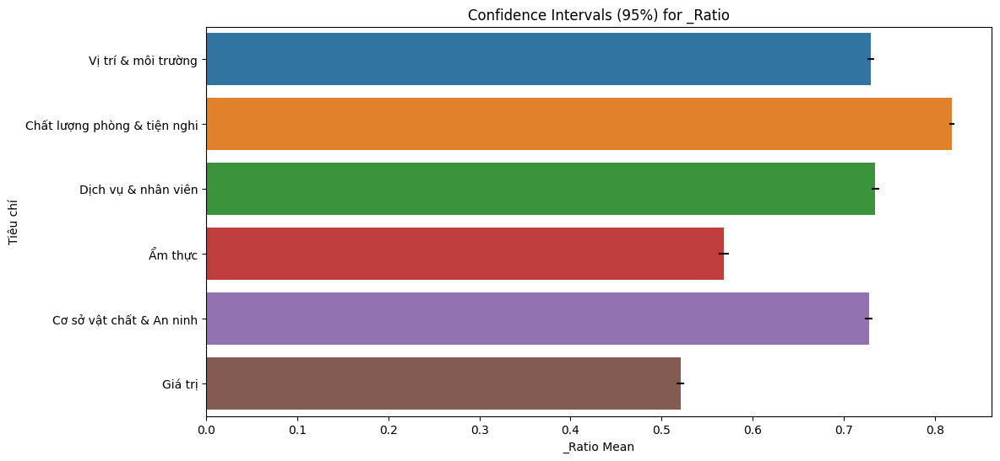


Đã lưu biểu đồ CI: output\ci_plot_all_criteria.png

=== Kết quả nghiên cứu ===
                      Criterion  N_Hotels    Mean     Std  CI_Lower  CI_Upper  \
0           Vị trí & môi trường      3887  0.7297  0.1325    0.7255    0.7338   
1  Chất lượng phòng & tiện nghi      3887  0.8184  0.0903    0.8155    0.8212   
2           Dịch vụ & nhân viên      3887  0.7345  0.1382    0.7302    0.7389   
3                       Ẩm thực      3887  0.5687  0.1768    0.5632    0.5743   
4      Cơ sở vật chất & An ninh      3887  0.7274  0.1266    0.7235    0.7314   
5                       Giá trị      3887  0.5206  0.1405    0.5162    0.5250   

   Bootstrap_Mean  Bootstrap_CI_Lower  Bootstrap_CI_Upper  Subsampling_SD  
0          0.7297              0.7256              0.7338          0.0062  
1          0.8183              0.8155              0.8212          0.0044  
2          0.7345              0.7301              0.7389          0.0065  
3          0.5687              0.5633           

In [106]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def bootstrap_ci(data, n_iterations=10000, ci=95):
    """Tính trung bình Bootstrap và khoảng tin cậy."""
    means = []
    n = len(data)
    if n < 2:
        return np.nan, np.nan, np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=True)
        means.append(np.mean(sample))
    
    mean_bootstrap = np.mean(means)
    lower = np.percentile(means, (100 - ci) / 2)
    upper = np.percentile(means, 100 - (100 - ci) / 2)
    return mean_bootstrap, lower, upper

def subsampling_sd(data, n_iterations=1000, subsample_ratio=0.1):
    """Tính độ lệch chuẩn của trung bình từ mẫu con."""
    means = []
    n = int(len(data) * subsample_ratio)
    if n < 2:
        return np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=False)
        means.append(np.mean(sample))
    
    return np.std(means, ddof=1)

def analyze_confidence_intervals(df, output_dir='output'):
    """Tính CI, Bootstrap, Subsampling_SD cho các cột _ratio."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách cột _ratio
    ratio_columns = [
        'Vị trí & môi trường_ratio', 'Chất lượng phòng & tiện nghi_ratio',
        'Dịch vụ & nhân viên_ratio', 'Ẩm thực_ratio',
        'Cơ sở vật chất & An ninh_ratio', 'Giá trị_ratio'
    ]
    
    # Tính CI, Bootstrap, Subsampling_SD
    results = []
    for col in ratio_columns:
        data = df[col].dropna()
        if len(data) > 1:
            # Khoảng tin cậy chuẩn
            mean = np.mean(data)
            std = np.std(data, ddof=1)
            se = std / np.sqrt(len(data))
            ci_lower, ci_upper = stats.norm.interval(0.95, loc=mean, scale=se)
            
            # Bootstrap
            mean_bootstrap, bootstrap_lower, bootstrap_upper = bootstrap_ci(data)
            
            # Subsampling_SD
            subsampling_std = subsampling_sd(data)
            
            results.append({
                'Criterion': col.replace('_ratio', ''),
                'N_Hotels': len(data),
                'Mean': mean,
                'Std': std,
                'CI_Lower': ci_lower,
                'CI_Upper': ci_upper,
                'Bootstrap_Mean': mean_bootstrap,
                'Bootstrap_CI_Lower': bootstrap_lower,
                'Bootstrap_CI_Upper': bootstrap_upper,
                'Subsampling_SD': subsampling_std
            })
        else:
            print(f"\nTiêu chí {col}: Không đủ dữ liệu để tính.")
    
    # Tạo DataFrame kết quả
    results_df = pd.DataFrame(results)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'confidence_results.csv')
    results_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    # Vẽ biểu đồ khoảng tin cậy
    plt.figure(figsize=(12, 6))
    sns.barplot(
        x='Mean', y='Criterion',
        data=results_df,
        xerr=(results_df['CI_Upper'] - results_df['CI_Lower']) / 2,
        capsize=5
    )
    plt.title('Confidence Intervals (95%) for _Ratio')
    plt.xlabel('_Ratio Mean')
    plt.ylabel('Tiêu chí')
    plot_path = os.path.join(output_dir, 'ci_plot_all_criteria.png')
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ CI: {plot_path}")
    
    return results_df



try:
    results_df = analyze_confidence_intervals(ratios_df)
    print("\n=== Kết quả nghiên cứu ===")
    print(results_df.round(4))
except Exception as e:
    print(f"\nLỗi: {str(e)}")

**Kết luận**
* Khoảng tin cậy hẹp chứng minh rằng trung bình _ratio có độ chính xác cao, ít biến động, và đại diện tốt cho xu hướng đánh giá của người dùng.
* Kết quả Bootstrap xác nhận rằng _ratio đáng tin cậy, ngay cả khi dữ liệu có thể không tuân theo phân phối chuẩn.
* Subsampling_SD thấp cho thấy trung bình _ratio bền vững, không thay đổi nhiều khi lấy mẫu con (10% kích thước mẫu gốc). Điều này chứng minh rằng xu hướng đánh giá ổn định và có thể áp dụng cho toàn bộ quần thể khách sạn.

#### REVIEW 6 CRITERIA - STAR

In [ ]:
merged_df = pd.read_csv("merged_df.csv", index_col=0)

In [113]:
merged_df

,id,original_price,criteria,stars_rating
0,10000593,1832536.0,"[['Vị trí & môi trường', 'Positive'], ['Ẩm thự...",3.0
1,10000593,1832536.0,"[['Dịch vụ & nhân viên', 'Positive'], ['Vị trí...",3.0
2,10000593,1832536.0,"[['Chất lượng phòng & tiện nghi', 'Negative']]",3.0
3,10000593,1832536.0,"[['Dịch vụ & nhân viên', 'Positive'], ['Vị trí...",3.0
4,10000593,1832536.0,"[['Chất lượng phòng & tiện nghi', 'Positive'],...",3.0
...,...,...,...,...
542416,9991755,5600000.0,"[['Chất lượng phòng & tiện nghi', 'Positive']]",4.0
542417,9991755,5600000.0,"[['Ẩm thực', 'Positive'], ['Chất lượng phòng &...",4.0
542418,9991755,5600000.0,"[['Chất lượng phòng & tiện nghi', 'Negative'],...",4.0
542419,9991755,5600000.0,"[['Chất lượng phòng & tiện nghi', 'Mixed'], ['...",4.0


In [140]:
import pandas as pd
import numpy as np
import os

def assign_star_cluster(stars):
    """Gán cụm theo stars_rating."""
    if pd.isna(stars):
        return None
    stars = float(stars)
    if 1.0 <= stars < 2.0:
        return '1 sao'
    elif 2.0 <= stars < 3.0:
        return '2 sao'
    elif stars == 3.0:
        return '3 sao'
    elif 4.0 <= stars < 5.0:
        return '4 sao'
    elif stars == 5.0:
        return '5 sao'
    return None

def calculate_criteria_ratios(df, output_dir='output'):
    """Tính _ratio cho mỗi tiêu chí theo id khách sạn, với cụm sao."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Gán cụm sao
    df['star_cluster'] = df['stars_rating'].apply(assign_star_cluster)
    
    # Danh sách tiêu chí
    criteria_list = [
        "Vị trí & môi trường", "Chất lượng phòng & tiện nghi", 
        "Dịch vụ & nhân viên", "Ẩm thực",  "Cơ sở vật chất & An ninh", "Giá trị"
    ]
    
    
    # Tính tổng số review theo id
    total_reviews = df.groupby('id').size().reset_index(name='total_reviews')
    
    # Tính _ratio theo id
    ratios = []
    for id_hotel, group in df.groupby('id'):
        # Lấy thông tin price, stars_rating, star_cluster (giá trị đầu tiên)
        price = group['original_price'].iloc[0]
        stars = group['stars_rating'].iloc[0]
        star_cluster = group['star_cluster'].iloc[0]
        total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
        
        # Đếm số lần mỗi tiêu chí xuất hiện
        counts = {crit: 0 for crit in criteria_list}
        for _, row in group.iterrows():
            # Xử lý cột criteria (danh sách các cặp [tiêu chí, cảm xúc])
            for crit, _ in row['criteria']:
                if crit in criteria_list:
                    counts[crit] += 1
        
        # Tạo hàng kết quả
        ratio_row = {
            'id_hotel': id_hotel,
            'original_price': price,
            'stars_rating': stars,
            'star_cluster': star_cluster,
            'total_reviews': total
        }
        for crit in criteria_list:
            ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
        ratios.append(ratio_row)
    
    # Tạo DataFrame kết quả
    ratios_df = pd.DataFrame(ratios)
    ratios_df = ratios_df[ratios_df['total_reviews'] >= 20].reset_index(drop=True)
    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotel_criteria_ratios_by_star_cluster.csv')
    ratios_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    # Đếm số khách sạn theo cụm sao
    cluster_counts = ratios_df.groupby('star_cluster')['id_hotel'].nunique().reset_index(name='hotel_count')
    cluster_counts_path = os.path.join(output_dir, 'star_cluster_counts.csv')
    cluster_counts.to_csv(cluster_counts_path, index=False)
    print("\nSố lượng khách sạn theo cụm sao:")
    print(cluster_counts)
    
    return ratios_df, cluster_counts



In [141]:


ratios_df, cluster_counts = calculate_criteria_ratios(merged_df)



Đã lưu kết quả vào: output\hotel_criteria_ratios_by_star_cluster.csv

Số lượng khách sạn theo cụm sao:
  star_cluster  hotel_count
0        1 sao          207
1        2 sao          789
2        3 sao         1532
3        4 sao         1005
4        5 sao          354


In [138]:
ratios_df = ratios_df[ratios_df['total_reviews'] >= 20].reset_index(drop=True)

In [139]:
ratios_df

,id_hotel,original_price,stars_rating,star_cluster,total_reviews,Vị trí & môi trường_ratio,Chất lượng phòng & tiện nghi_ratio,Dịch vụ & nhân viên_ratio,Ẩm thực_ratio,Cơ sở vật chất & An ninh_ratio,Giá trị_ratio
0,10000593,1832536.0,3.0,3 sao,241,0.929461,0.908714,0.842324,0.784232,0.883817,0.659751
1,10003086,350000.0,3.0,3 sao,21,0.619048,0.904762,0.904762,0.238095,0.619048,0.333333
2,10004054,2436223.0,3.0,3 sao,84,0.702381,0.785714,0.750000,0.619048,0.785714,0.511905
3,10006885,3285000.0,4.0,4 sao,32,0.812500,0.875000,0.718750,0.562500,0.875000,0.656250
4,10007210,285000.0,3.0,3 sao,41,0.512195,0.804878,0.731707,0.243902,0.487805,0.487805
...,...,...,...,...,...,...,...,...,...,...,...
3882,9982063,400000.0,3.0,3 sao,110,0.345455,0.600000,0.863636,0.227273,0.345455,0.227273
3883,9982859,1372931.0,4.0,4 sao,58,0.741379,0.724138,0.844828,0.603448,0.724138,0.517241
3884,9983526,192500.0,1.0,1 sao,24,0.708333,0.833333,0.958333,0.750000,0.666667,0.416667
3885,9989292,543600.0,4.0,4 sao,45,0.533333,0.888889,0.577778,0.333333,0.555556,0.333333



Đã lưu kết quả Mann-Whitney U vào: output\mann_whitney_results.csv


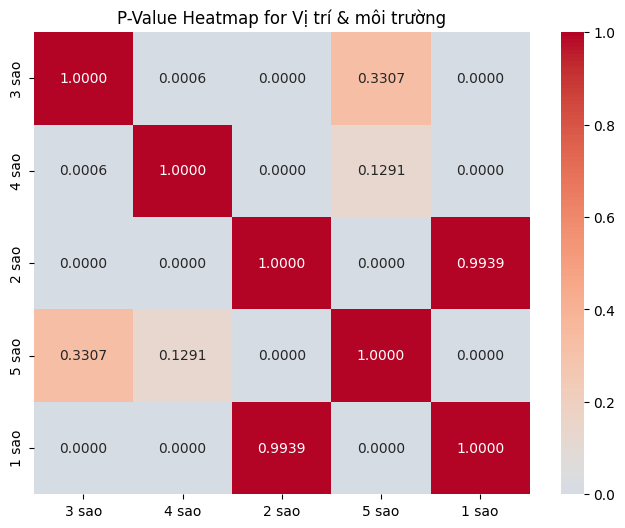


Đã lưu heatmap cho Vị trí & môi trường_ratio: output\p_value_heatmap_vị_trí_&_môi_trường.png


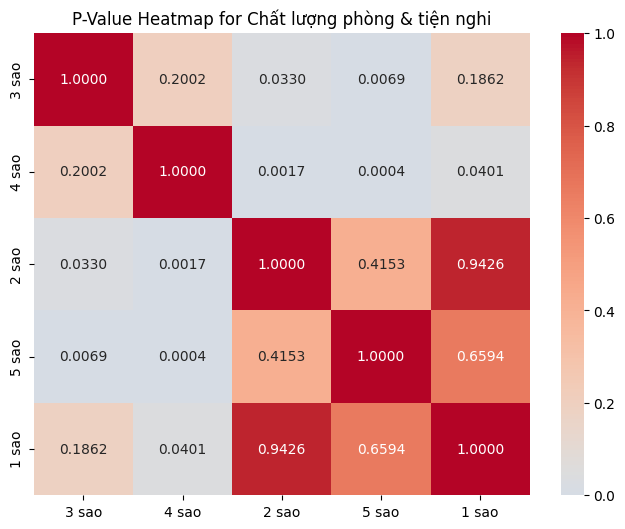


Đã lưu heatmap cho Chất lượng phòng & tiện nghi_ratio: output\p_value_heatmap_chất_lượng_phòng_&_tiện_nghi.png


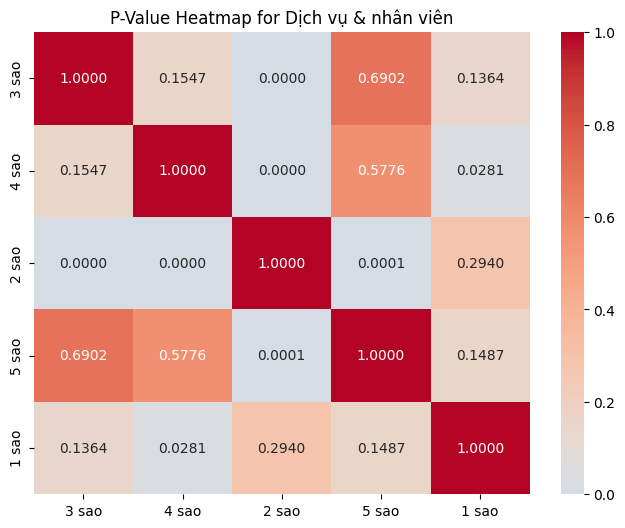


Đã lưu heatmap cho Dịch vụ & nhân viên_ratio: output\p_value_heatmap_dịch_vụ_&_nhân_viên.png


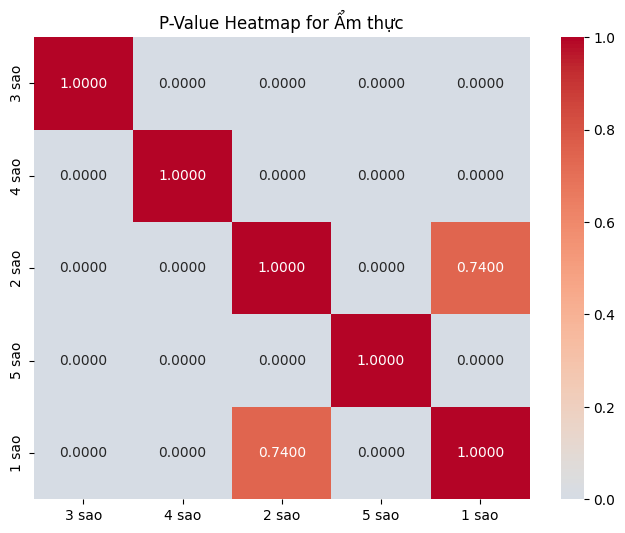


Đã lưu heatmap cho Ẩm thực_ratio: output\p_value_heatmap_ẩm_thực.png


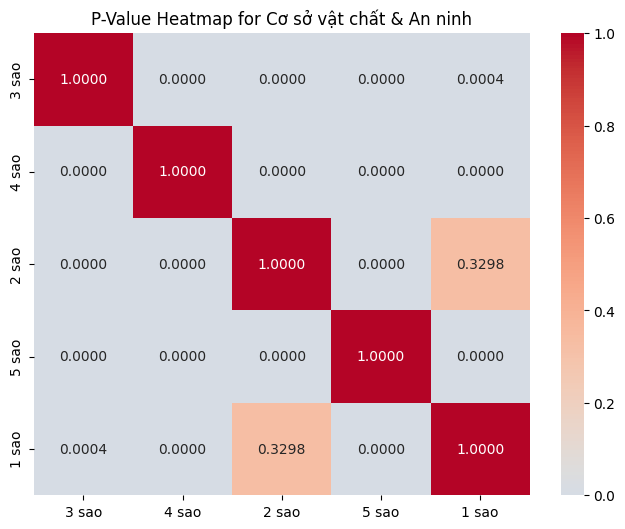


Đã lưu heatmap cho Cơ sở vật chất & An ninh_ratio: output\p_value_heatmap_cơ_sở_vật_chất_&_an_ninh.png


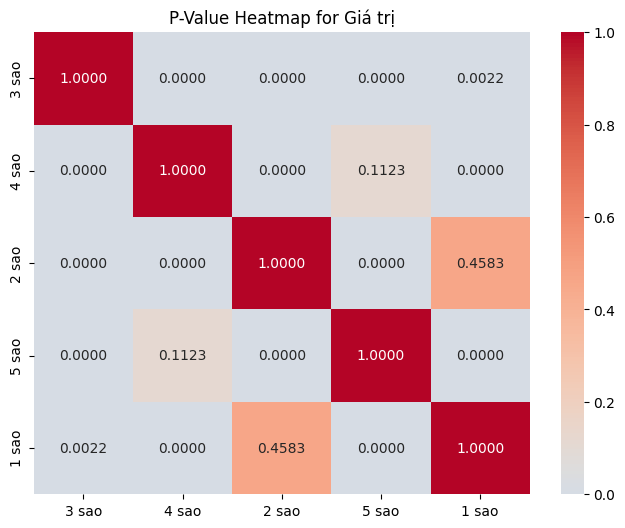


Đã lưu heatmap cho Giá trị_ratio: output\p_value_heatmap_giá_trị.png

Kết quả Mann-Whitney U:
                       Criterion    Cluster_Pair  U_Statistic  P_Value  \
0            Vị trí & môi trường  3 sao vs 4 sao     707625.0   0.0006   
1            Vị trí & môi trường  3 sao vs 2 sao     715594.0   0.0000   
2            Vị trí & môi trường  3 sao vs 5 sao     262181.5   0.3307   
3            Vị trí & môi trường  3 sao vs 1 sao     187508.0   0.0000   
4            Vị trí & môi trường  4 sao vs 2 sao     505676.5   0.0000   
5            Vị trí & môi trường  4 sao vs 5 sao     187523.0   0.1291   
6            Vị trí & môi trường  4 sao vs 1 sao     132567.0   0.0000   
7            Vị trí & môi trường  2 sao vs 5 sao     106169.5   0.0000   
8            Vị trí & môi trường  2 sao vs 1 sao      81633.0   0.9939   
9            Vị trí & môi trường  5 sao vs 1 sao      45572.5   0.0000   
10  Chất lượng phòng & tiện nghi  3 sao vs 4 sao     746715.5   0.2002   
11  Chất lượng ph

In [143]:
import pandas as pd
import numpy as np
import os
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

def perform_mann_whitney(df, output_dir='output'):
    """Thực hiện Mann-Whitney U và vẽ heatmap p-value."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách cột _ratio
    ratio_columns = [
        'Vị trí & môi trường_ratio', 'Chất lượng phòng & tiện nghi_ratio',
        'Dịch vụ & nhân viên_ratio', 'Ẩm thực_ratio',
        'Cơ sở vật chất & An ninh_ratio', 'Giá trị_ratio'
    ]
    
    # Danh sách cụm sao
    clusters = df['star_cluster'].unique()
    clusters = [c for c in clusters if c is not None]  # Loại bỏ None nếu có
    
    # Tạo danh sách cặp cụm để so sánh
    cluster_pairs = list(combinations(clusters, 2))
    
    # Lưu kết quả Mann-Whitney U
    results = []
    p_value_matrices = {col: np.ones((len(clusters), len(clusters))) for col in ratio_columns}
    
    for col in ratio_columns:
        for i, cluster1 in enumerate(clusters):
            for j, cluster2 in enumerate(clusters):
                if i < j:  # Chỉ tính cho cặp không trùng và không lặp
                    data1 = df[df['star_cluster'] == cluster1][col].dropna()
                    data2 = df[df['star_cluster'] == cluster2][col].dropna()
                    
                    if len(data1) > 0 and len(data2) > 0:
                        try:
                            stat, p_value = mannwhitneyu(data1, data2, alternative='two-sided')
                            results.append({
                                'Criterion': col.replace('_ratio', ''),
                                'Cluster_Pair': f'{cluster1} vs {cluster2}',
                                'U_Statistic': stat,
                                'P_Value': p_value,
                                'N_Cluster1': len(data1),
                                'N_Cluster2': len(data2)
                            })
                            p_value_matrices[col][i, j] = p_value
                            p_value_matrices[col][j, i] = p_value  # Ma trận đối xứng
                        except ValueError as e:
                            print(f"Lỗi Mann-Whitney U cho {col}, {cluster1} vs {cluster2}: {e}")
                    else:
                        print(f"Không đủ dữ liệu cho {col}, {cluster1} vs {cluster2}")
                        p_value_matrices[col][i, j] = np.nan
                        p_value_matrices[col][j, i] = np.nan
    
    # Tạo DataFrame kết quả Mann-Whitney U
    results_df = pd.DataFrame(results)
    output_path = os.path.join(output_dir, 'mann_whitney_results.csv')
    results_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả Mann-Whitney U vào: {output_path}")
    
    # Vẽ heatmap p-value cho mỗi tiêu chí
    for col in ratio_columns:
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            p_value_matrices[col],
            annot=True, fmt='.4f', cmap='coolwarm',
            xticklabels=clusters, yticklabels=clusters,
            vmin=0, vmax=1, center=0.05
        )
        plt.title(f'P-Value Heatmap for {col.replace("_ratio", "")}')
        plot_path = os.path.join(output_dir, f'p_value_heatmap_{col.replace("_ratio", "").lower().replace(" ", "_")}.png')
        plt.show()
        plt.close()
        print(f"\nĐã lưu heatmap cho {col}: {plot_path}")
    
    return results_df, p_value_matrices


    
try:
    results_df, p_value_matrices = perform_mann_whitney(ratios_df)
    print("\nKết quả Mann-Whitney U:")
    print(results_df.round(4))
except Exception as e:
    print(f"\nLỗi: {str(e)}")

#### REVIEW - TIME

In [3]:


with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\hotel_data_room.json", 'r', encoding='utf-8') as f:
    hotel_data_room = json.load(f)

hotel_data_room[0].keys()
room_data = []
for key in hotel_data_room:
    room_data.append({
        'id_room': key['room_id'],
        'id': key['id'],
        'original_price': key['original_price'],
        'name': key['name'],
    })

def drop_duplicates(data):
    seen = set()
    result = []
    for item in data:
        #key = (item['id'], item['original_price'], item['name'])
        key = (item['id'], item['name'])
        if key not in seen:
            seen.add(key)
            result.append(item)
    return result
room_data = drop_duplicates(room_data)

with open("hotel_review_score.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

In [4]:
from datetime import datetime
import re

def extract_month_year(date_str):
    
    # Loại bỏ các ký tự không cần thiết và chuẩn hóa chuỗi
    date_str = date_str.replace("·", "").replace("Ngày đánh giá:", "").strip()
    
    # Tìm tháng và năm bằng regex, hỗ trợ cả "tháng X năm Y" và "tháng X/Y"
    match = re.search(r'tháng\s*(\d{1,2})\s*(?:năm\s*(\d{4})|\/(\d{4}))', date_str, re.IGNORECASE)
    if match:
        month = match.group(1)  # Lấy tháng
        year = match.group(2) or match.group(3)  # Lấy năm từ "năm Y" hoặc "/Y"
        # Tạo đối tượng datetime (mặc định ngày là 1)
        date_obj = datetime(int(year), int(month), 1)
        return date_obj
    else:
        return None
    

In [5]:
for data in reviewer_data:
    data['date'] = extract_month_year(data['date'])

In [10]:
reviewer_data

[{'id_hotel': '10000593',
  'id_review': '2367e2c2-8bb2-4a79-bc48-034fde283649',
  'country': 'Việt Nam',
  'room': 'Bungalow Deluxe Nhìn Ra Khu Vườn',
  'state': 'Nhóm',
  'rating': 'Đạt điểm 10',
  'criteria': [['Phòng nghỉ & tiện nghi', 'Positive'],
   ['Cơ sở vật chất', 'Positive'],
   ['Vị trí & môi trường', 'Positive'],
   ['Ẩm thực', 'Positive'],
   ['Dịch vụ & nhân viên', 'Positive']],
  'date': datetime.datetime(2023, 9, 1, 0, 0)},
 {'id_hotel': '10000593',
  'id_review': '590605ee-34ba-4223-b132-22e25c298289',
  'country': 'Việt Nam',
  'room': 'Bungalow Nhìn ra vườn',
  'state': 'Phòng gia đình',
  'rating': 'Đạt điểm 10',
  'criteria': [['Vị trí & môi trường', 'Positive'],
   ['Ẩm thực', 'Mixed'],
   ['Phòng nghỉ & tiện nghi', 'Positive'],
   ['Cơ sở vật chất', 'Positive'],
   ['Sạch sẽ', 'Positive']],
  'date': datetime.datetime(2023, 9, 1, 0, 0)},
 {'id_hotel': '10000593',
  'id_review': '4ca654b6-bd02-4546-8cf3-8411fca210b4',
  'country': 'Việt Nam',
  'room': 'Bung

In [7]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_star_rating.json", 'r', encoding='utf-8') as f:
    feature_star_rating = json.load(f)
star_data = []
for key in feature_star_rating:
    star_data.append({
        'id': key['id'],
        'stars_rating': key['stars_rating']
    })

In [28]:
import unicodedata

def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def analyze_confidence_intervals(star_data, room_data, reviewer_data):
    """Tính khoảng tin cậy, Bootstrap, Subsampling_SD cho 3 cụm."""

    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria', 'date'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria', 'date']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'room_normalized', 'original_price', 'criteria', 'date']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    merged_df.to_csv("merged_df.csv", index=False)
    return merged_df

merged_df = analyze_confidence_intervals(star_data, room_data, reviewer_data)
merged_df


Số bản ghi sau merge room và reviewer: 593508
Số bản ghi sau merge với star_data: 542406


,id,room_normalized,original_price,criteria,date,stars_rating
0,10000593,bungalow nhìn ra vườn,1832536.0,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,3.0
1,10000593,bungalow nhìn ra vườn,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,3.0
2,10000593,bungalow nhìn ra vườn,1832536.0,"[[Sạch sẽ, Negative], [Phòng nghỉ & tiện nghi,...",2024-04-01,3.0
3,10000593,bungalow nhìn ra vườn,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2025-02-01,3.0
4,10000593,bungalow nhìn ra vườn,1832536.0,"[[Phòng nghỉ & tiện nghi, Positive], [Vị trí &...",2025-02-01,3.0
...,...,...,...,...,...,...
542401,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Positive], [Sạch sẽ,...",2023-09-01,4.0
542402,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Ẩm thực, Positive], [Phòng nghỉ & tiện nghi,...",2024-06-01,4.0
542403,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Negative], [Cơ sở vậ...",2024-04-01,4.0
542404,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Mixed], [Cơ sở vật c...",2023-07-01,4.0


In [29]:
import pandas as pd
import numpy as np
import os
from datetime import datetime

def calculate_criteria_ratios_by_month(df, output_dir='output', review_count=10):
    """Tính tỷ lệ cho mỗi tiêu chí theo id khách sạn và theo tháng, lưu kết quả."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách tiêu chí
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    
    # Chuyển cột date thành định dạng datetime
    df['date'] = pd.to_datetime(df['date'])
    
    # Tạo cột year_month để nhóm theo tháng
    df['year_month'] = df['date'].dt.to_period('M')
    
    # Khởi tạo danh sách để lưu kết quả
    all_ratios = []
    
    # Nhóm theo year_month
    for year_month, month_group in tqdm(df.groupby('year_month'), total = len(df.groupby('year_month'))):
        # Tính tổng số review theo id trong tháng đó
        total_reviews = month_group.groupby('id').size().reset_index(name='total_reviews')
        
        # Tính số lần mỗi tiêu chí được nhắc đến theo id trong tháng
        ratios = []
        for id_hotel, group in month_group.groupby('id'):
            # Lấy thông tin price và stars_rating (lấy giá trị đầu tiên)
            price = group['original_price'].iloc[0]
            stars = group['stars_rating'].iloc[0]
            total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
            
            # Đếm số lần mỗi tiêu chí xuất hiện
            counts = {crit: 0 for crit in criteria_list}
            for _, row in group.iterrows():
                # Xử lý cột criteria (danh sách các cặp [tiêu chí, cảm xúc])
                for crit, _ in row['criteria']:
                    if crit in criteria_list:
                        counts[crit] += 1
            
            # Tạo hàng kết quả
            ratio_row = {
                'year_month': year_month.to_timestamp(),
                'id_hotel': id_hotel,
                'original_price': price,
                'stars_rating': stars,
                'total_reviews': total
            }
            for crit in criteria_list:
                ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
            ratios.append(ratio_row)
        
        # Tạo DataFrame kết quả cho tháng này
        ratios_df = pd.DataFrame(ratios)
        # Lọc các dòng có total_reviews >= review_count
        filtered_df = ratios_df[ratios_df['total_reviews'] >= review_count].reset_index(drop=True)
        all_ratios.append(filtered_df)
    
    # Gộp tất cả các kết quả
    final_df = pd.concat(all_ratios, ignore_index=True)
    
    # Sắp xếp theo year_month và id_hotel
    final_df = final_df.sort_values(['year_month', 'id_hotel']).reset_index(drop=True)
    
    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotel_criteria_ratios_by_month.csv')
    final_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    return final_df

# Chạy hàm với dữ liệu mẫu
ratios_df = calculate_criteria_ratios_by_month(merged_df)

100%|██████████| 45/45 [01:48<00:00,  2.40s/it]



Đã lưu kết quả vào: output\hotel_criteria_ratios_by_month.csv


In [30]:
ratios_df

,year_month,id_hotel,original_price,stars_rating,total_reviews,Vị trí & môi trường_ratio,Phòng nghỉ & tiện nghi_ratio,Sạch sẽ_ratio,Dịch vụ & nhân viên_ratio,Wi-Fi_ratio,Ẩm thực_ratio,Cơ sở vật chất_ratio,An ninh_ratio,Giá trị_ratio
0,2022-02-01,2439030,807500.0,4.0,11,0.727273,0.727273,0.272727,0.727273,0.090909,0.454545,0.636364,0.090909,0.636364
1,2022-02-01,265478,74820000.0,4.0,12,0.833333,0.583333,0.000000,0.750000,0.000000,0.250000,0.416667,0.000000,0.250000
2,2022-02-01,4438946,8835750.0,4.0,11,0.636364,0.818182,0.727273,0.909091,0.090909,0.272727,0.727273,0.000000,0.363636
3,2022-03-01,1203232,1123424.0,5.0,14,0.500000,0.500000,0.357143,0.428571,0.071429,0.357143,0.500000,0.071429,0.285714
4,2022-03-01,1477572,1250000.0,4.0,38,0.710526,0.657895,0.342105,0.526316,0.052632,0.342105,0.552632,0.052632,0.394737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14880,2025-03-01,13364218,243000.0,2.0,11,0.545455,0.272727,0.090909,0.636364,0.000000,0.272727,0.272727,0.000000,0.181818
14881,2025-03-01,13414007,16200000.0,4.0,17,0.647059,0.588235,0.529412,0.647059,0.294118,0.529412,0.823529,0.235294,0.470588
14882,2025-03-01,13589667,5000000.0,4.0,11,0.727273,1.000000,0.545455,0.818182,0.272727,0.727273,0.909091,0.272727,0.636364
14883,2025-03-01,13641264,904142.0,4.0,15,0.933333,0.600000,0.466667,0.800000,0.400000,0.666667,0.800000,0.400000,0.533333


In [31]:
len(ratios_df['id_hotel'].unique())

1952

In [32]:
import pandas as pd
import os

def analyze_hotels_and_reviews_by_month(df, output_dir='output'):
    """Phân tích số lượng khách sạn và tổng số đánh giá mỗi tháng."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Nhóm theo year_month, đếm số khách sạn và tính tổng số đánh giá
    analysis_df = df.groupby('year_month').agg(
        num_hotels=('id_hotel', 'nunique'),
        total_reviews=('total_reviews', 'sum')
    ).reset_index()
    
    # Sắp xếp theo year_month
    analysis_df = analysis_df.sort_values('year_month')
    
    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotels_and_reviews_by_month.csv')
    analysis_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả phân tích vào: {output_path}")
    
    return analysis_df

# Chạy hàm với dữ liệu mẫu
analysis_df = analyze_hotels_and_reviews_by_month(ratios_df)


Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


In [33]:
analysis_df

,year_month,num_hotels,total_reviews
0,2022-02-01,3,34
1,2022-03-01,39,674
2,2022-04-01,117,1913
3,2022-05-01,166,3014
4,2022-06-01,180,3073
5,2022-07-01,270,4650
6,2022-08-01,263,4694
7,2022-09-01,252,4571
8,2022-10-01,245,4659
9,2022-11-01,277,5232


In [34]:
    # Loại bỏ các dòng có year_month là '2022-02-01', '2022-03-01', và '2025-03-01'
exclude_dates = ['2022-02-01', '2022-03-01', '2025-03-01']
filtered_df = analysis_df[~analysis_df['year_month'].isin(exclude_dates)].copy()

# Chuyển year_month thành định dạng datetime và sắp xếp
filtered_df['year_month'] = pd.to_datetime(filtered_df['year_month'])
filtered_df = filtered_df.sort_values('year_month')

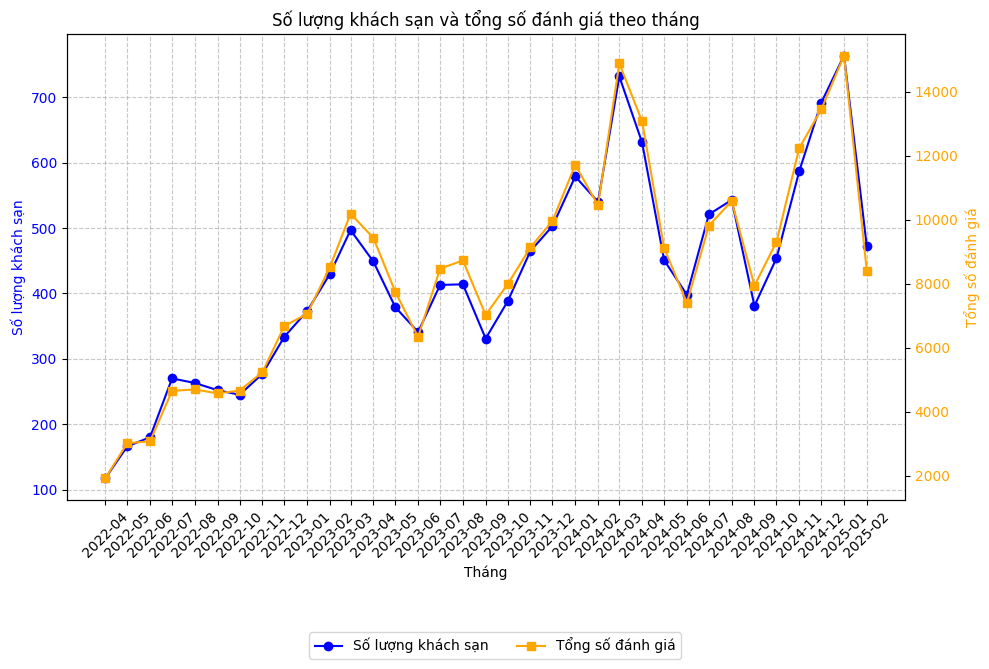


Đã lưu biểu đồ vào: output\hotels_and_reviews_plot.png


In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def visualize_hotels_and_reviews(filtered_df, output_dir='output'):
    """Loại bỏ các dòng cụ thể và trực quan hóa số lượng khách sạn và tổng số đánh giá theo tháng."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    

    
    # Tạo biểu đồ
    fig, ax1 = plt.subplots(figsize=(10, 6))
    
    # Vẽ đường cho num_hotels trên trục y bên trái
    ax1.plot(filtered_df['year_month'], filtered_df['num_hotels'], color='blue', label='Số lượng khách sạn', marker='o')
    ax1.set_xlabel('Tháng')
    ax1.set_ylabel('Số lượng khách sạn', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Tạo trục y bên phải cho total_reviews
    ax2 = ax1.twinx()
    ax2.plot(filtered_df['year_month'], filtered_df['total_reviews'], color='orange', label='Tổng số đánh giá', marker='s')
    ax2.set_ylabel('Tổng số đánh giá', color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')
    
    # Tiêu đề và chú thích
    plt.title('Số lượng khách sạn và tổng số đánh giá theo tháng')
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
    
    # Định dạng trục x để hiển thị năm-tháng
    ax1.set_xticks(filtered_df['year_month'])
    ax1.set_xticklabels(filtered_df['year_month'].dt.strftime('%Y-%m'), rotation=45)
    
    # Tối ưu hóa bố cục
    fig.tight_layout()
    
    # Lưu biểu đồ
    output_path = os.path.join(output_dir, 'hotels_and_reviews_plot.png')
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ vào: {output_path}")
    
    return filtered_df


# Chạy hàm
filtered_df = visualize_hotels_and_reviews(filtered_df)


Đã lưu kết quả vào: output\confidence_results_by_month_filtered.csv


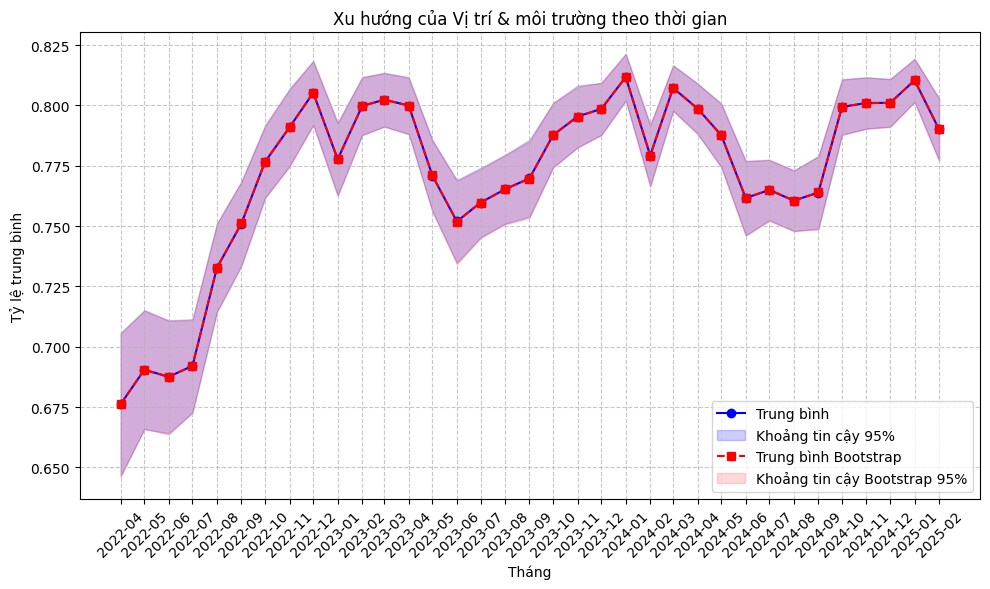


Đã lưu biểu đồ xu hướng cho Vị trí & môi trường: output\trend_Vị_trí_&_môi_trường_filtered.png


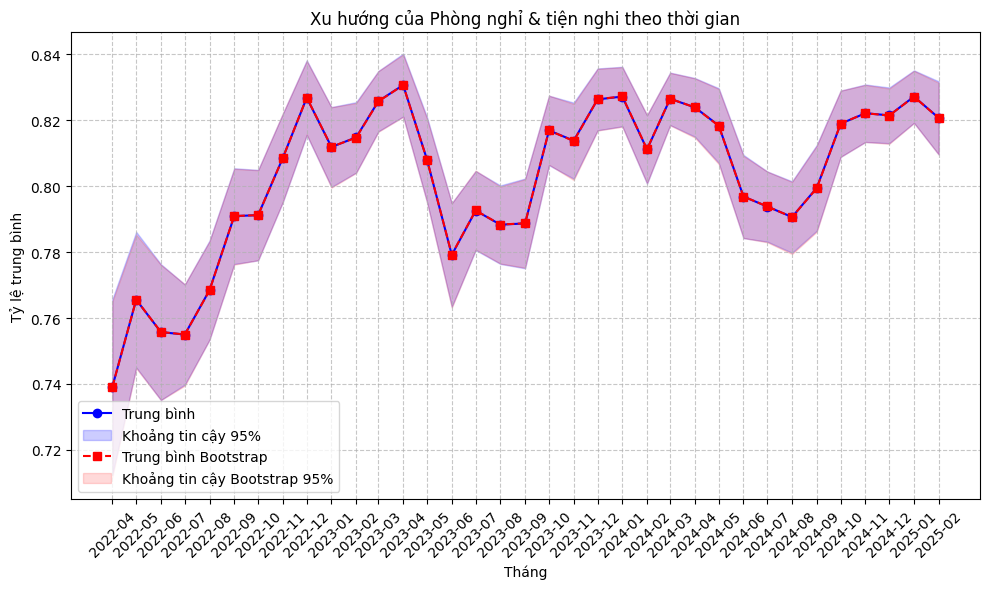


Đã lưu biểu đồ xu hướng cho Phòng nghỉ & tiện nghi: output\trend_Phòng_nghỉ_&_tiện_nghi_filtered.png


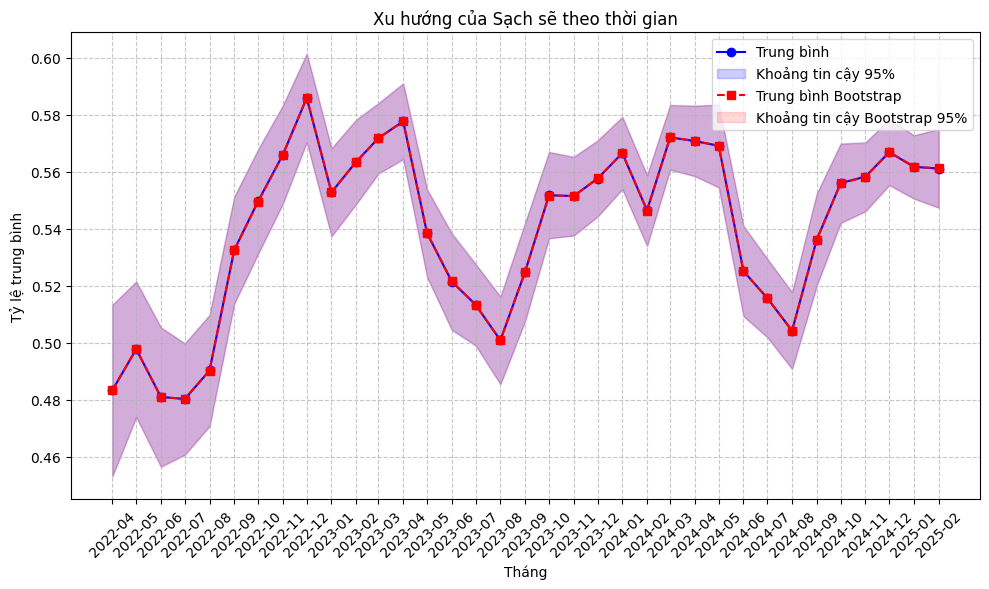


Đã lưu biểu đồ xu hướng cho Sạch sẽ: output\trend_Sạch_sẽ_filtered.png


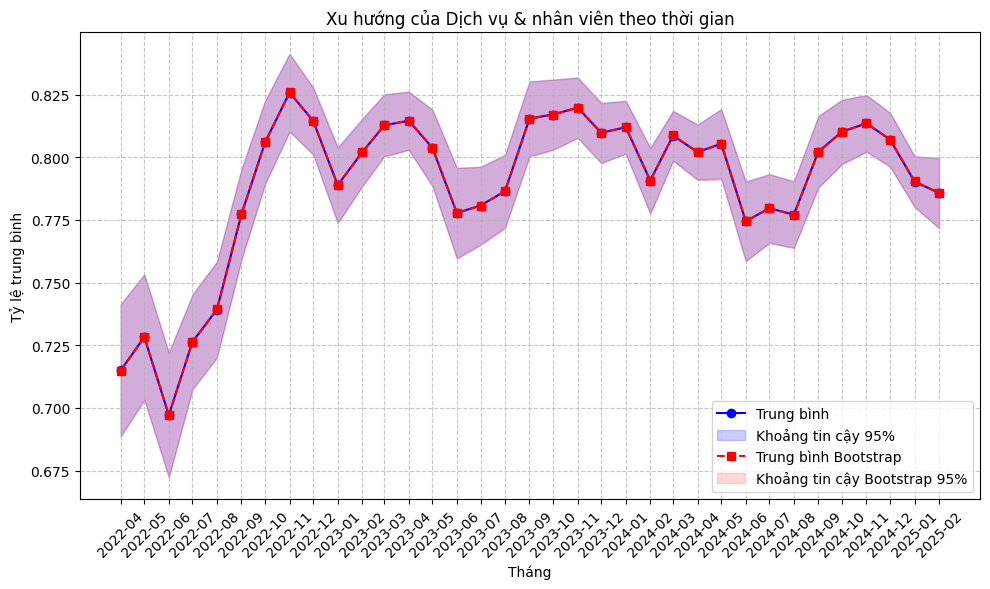


Đã lưu biểu đồ xu hướng cho Dịch vụ & nhân viên: output\trend_Dịch_vụ_&_nhân_viên_filtered.png


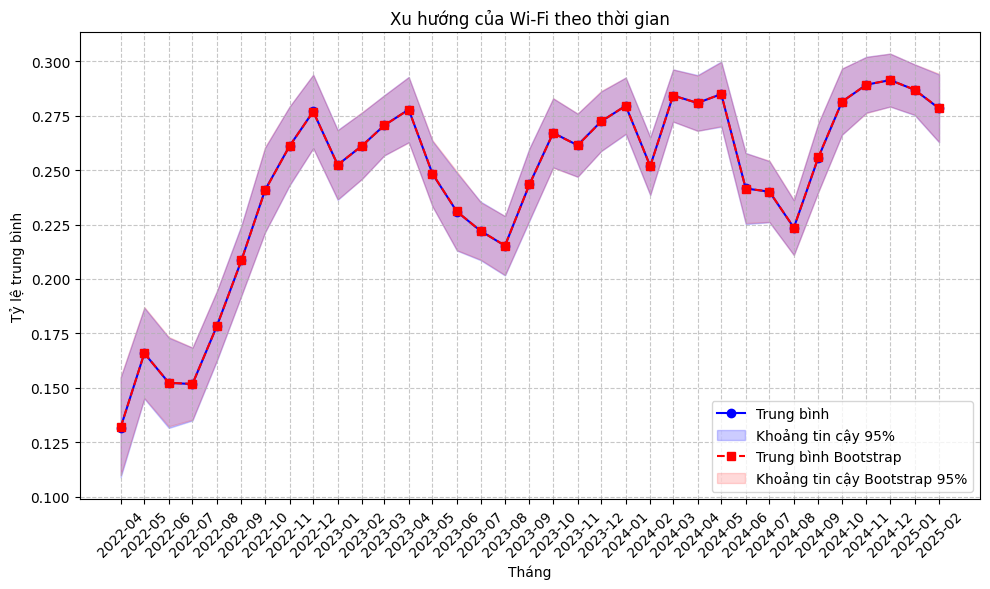


Đã lưu biểu đồ xu hướng cho Wi-Fi: output\trend_Wi-Fi_filtered.png


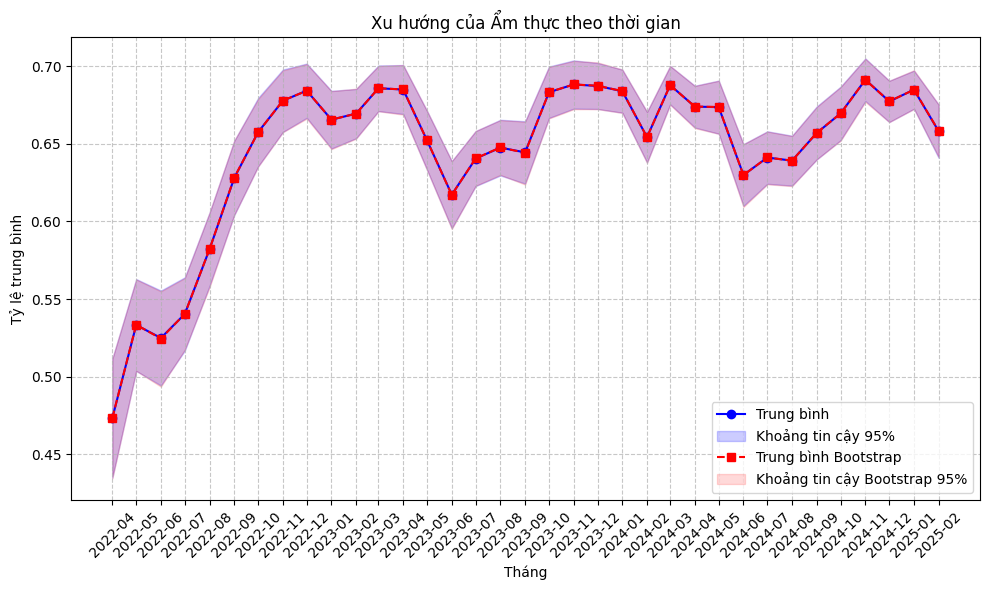


Đã lưu biểu đồ xu hướng cho Ẩm thực: output\trend_Ẩm_thực_filtered.png


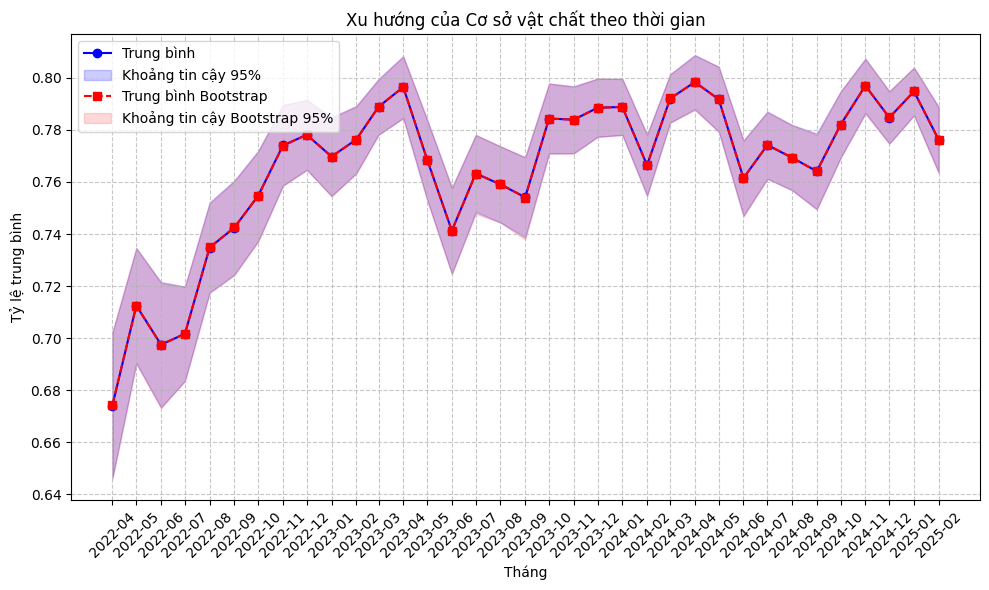


Đã lưu biểu đồ xu hướng cho Cơ sở vật chất: output\trend_Cơ_sở_vật_chất_filtered.png


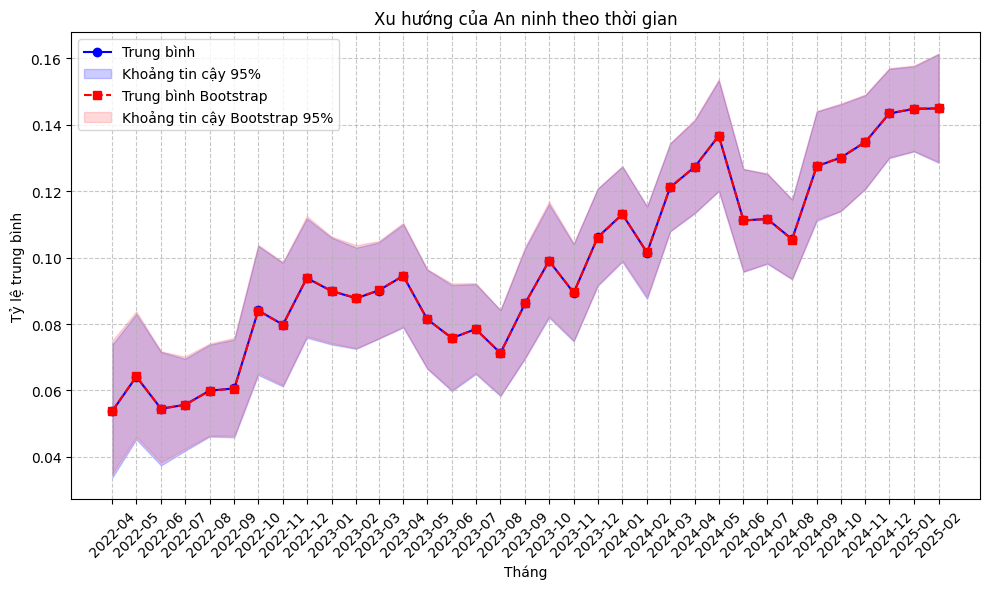


Đã lưu biểu đồ xu hướng cho An ninh: output\trend_An_ninh_filtered.png


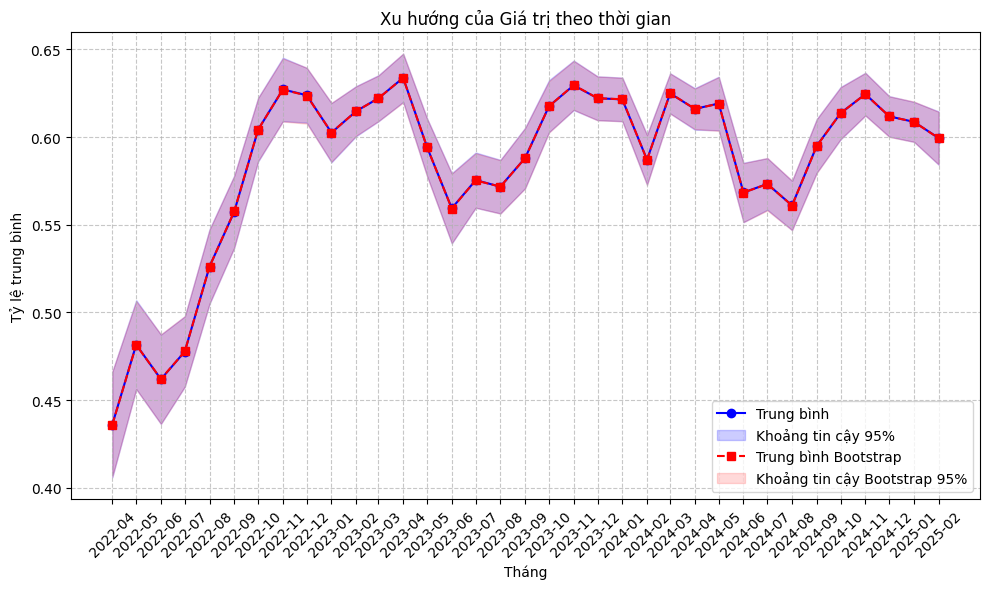


Đã lưu biểu đồ xu hướng cho Giá trị: output\trend_Giá_trị_filtered.png

=== Kết quả nghiên cứu ===
    year_month               Criterion  N_Hotels    Mean     Std  CI_Lower  \
0   2022-04-01     Vị trí & môi trường       117  0.6762  0.1634    0.6466   
1   2022-04-01  Phòng nghỉ & tiện nghi       117  0.7391  0.1467    0.7125   
2   2022-04-01                 Sạch sẽ       117  0.4832  0.1658    0.4532   
3   2022-04-01     Dịch vụ & nhân viên       117  0.7149  0.1468    0.6883   
4   2022-04-01                   Wi-Fi       117  0.1318  0.1264    0.1089   
..         ...                     ...       ...     ...     ...       ...   
310 2025-02-01                   Wi-Fi       472  0.2783  0.1726    0.2628   
311 2025-02-01                 Ẩm thực       472  0.6581  0.1906    0.6409   
312 2025-02-01          Cơ sở vật chất       472  0.7762  0.1404    0.7635   
313 2025-02-01                 An ninh       472  0.1450  0.1816    0.1286   
314 2025-02-01                 Giá trị    

In [39]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def bootstrap_ci(data, n_iterations=10000, ci=95):
    """Tính trung bình Bootstrap và khoảng tin cậy."""
    means = []
    n = len(data)
    if n < 2:
        return np.nan, np.nan, np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=True)
        means.append(np.mean(sample))
    
    mean_bootstrap = np.mean(means)
    lower = np.percentile(means, (100 - ci) / 2)
    upper = np.percentile(means, 100 - (100 - ci) / 2)
    return mean_bootstrap, lower, upper

def subsampling_sd(data, n_iterations=1000, subsample_ratio=0.1):
    """Tính độ lệch chuẩn của trung bình từ mẫu con."""
    means = []
    n = int(len(data) * subsample_ratio)
    if n < 2:
        return np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=False)
        means.append(np.mean(sample))
    
    return np.std(means, ddof=1)

def analyze_confidence_intervals_by_month(df, output_dir='output'):
    """Tính CI và Bootstrap cho các cột _ratio theo từng tháng và vẽ biểu đồ đường."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Loại bỏ các dòng có year_month trong danh sách
    exclude_dates = ['2022-02-01', '2022-03-01', '2025-03-01']
    df = df[~df['year_month'].isin(exclude_dates)].copy()
    
    # Danh sách cột _ratio
    ratio_columns = [
        'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio',
        'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio',
        'Wi-Fi_ratio', 'Ẩm thực_ratio',
        'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio'
    ]
    
    # Chuyển year_month thành datetime
    df['year_month'] = pd.to_datetime(df['year_month'])
    
    # Khởi tạo danh sách lưu kết quả
    all_results = []
    
    # Nhóm theo year_month
    for year_month, group in df.groupby('year_month'):
        results = []
        for col in ratio_columns:
            data = group[col].dropna()
            if len(data) > 1:
                # Khoảng tin cậy chuẩn
                mean = np.mean(data)
                std = np.std(data, ddof=1)
                se = std / np.sqrt(len(data))
                ci_lower, ci_upper = stats.norm.interval(0.95, loc=mean, scale=se)
                
                # Bootstrap
                mean_bootstrap, bootstrap_lower, bootstrap_upper = bootstrap_ci(data)
                
                # Subsampling_SD
                subsampling_std = subsampling_sd(data)
                
                results.append({
                    'year_month': year_month,
                    'Criterion': col.replace('_ratio', ''),
                    'N_Hotels': len(data),
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': mean_bootstrap,
                    'Bootstrap_CI_Lower': bootstrap_lower,
                    'Bootstrap_CI_Upper': bootstrap_upper,
                    'Subsampling_SD': subsampling_std
                })
            else:
                print(f"\nTháng {year_month.strftime('%Y-%m')}, tiêu chí {col}: Không đủ dữ liệu để tính.")
        
        # Tạo DataFrame kết quả cho tháng này
        month_results = pd.DataFrame(results)
        all_results.append(month_results)
    
    # Gộp tất cả kết quả
    results_df = pd.concat(all_results, ignore_index=True)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'confidence_results_by_month_filtered.csv')
    results_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    # Vẽ biểu đồ đường cho từng tiêu chí
    for criterion in results_df['Criterion'].unique():
        criterion_data = results_df[results_df['Criterion'] == criterion]
        criterion_data = criterion_data.sort_values('year_month')
        
        plt.figure(figsize=(10, 6))
        # Vẽ Mean và CI thông thường
        plt.plot(criterion_data['year_month'], criterion_data['Mean'], 
                 marker='o', label='Trung bình', color='blue', linestyle='-')
        plt.fill_between(criterion_data['year_month'], 
                         criterion_data['CI_Lower'], 
                         criterion_data['CI_Upper'], 
                         color='blue', alpha=0.2, label='Khoảng tin cậy 95%')
        
        # Vẽ Bootstrap_Mean và Bootstrap_CI (đè lên)
        plt.plot(criterion_data['year_month'], criterion_data['Bootstrap_Mean'], 
                 marker='s', label='Trung bình Bootstrap', color='red', linestyle='--')
        plt.fill_between(criterion_data['year_month'], 
                         criterion_data['Bootstrap_CI_Lower'], 
                         criterion_data['Bootstrap_CI_Upper'], 
                         color='red', alpha=0.15, label='Khoảng tin cậy Bootstrap 95%')
        
        plt.title(f'Xu hướng của {criterion} theo thời gian')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ trung bình')
        plt.xticks(criterion_data['year_month'], 
                   criterion_data['year_month'].dt.strftime('%Y-%m'), 
                   rotation=45)
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        
        # Lưu biểu đồ
        plot_path = os.path.join(output_dir, f'trend_{criterion.replace(" ", "_")}_filtered.png')
        plt.show()
        plt.close()
        print(f"\nĐã lưu biểu đồ xu hướng cho {criterion}: {plot_path}")
    
    return results_df


# Chạy hàm
try:
    results_df = analyze_confidence_intervals_by_month(ratios_df)
    print("\n=== Kết quả nghiên cứu ===")
    print(results_df.round(4))
except Exception as e:
    print(f"\nLỗi: {str(e)}")

In [46]:
results_df

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
0,2022-04-01,Vị trí & môi trường,117,0.676203,0.163376,0.646600,0.705807,0.676295,0.645882,0.705384,0.046485
1,2022-04-01,Phòng nghỉ & tiện nghi,117,0.739073,0.146718,0.712488,0.765658,0.739027,0.711656,0.764960,0.041808
2,2022-04-01,Sạch sẽ,117,0.483224,0.165827,0.453176,0.513272,0.483313,0.452679,0.513261,0.046549
3,2022-04-01,Dịch vụ & nhân viên,117,0.714935,0.146755,0.688343,0.741527,0.714909,0.689071,0.741232,0.042067
4,2022-04-01,Wi-Fi,117,0.131796,0.126388,0.108895,0.154697,0.131903,0.109911,0.155108,0.037046
...,...,...,...,...,...,...,...,...,...,...,...
310,2025-02-01,Wi-Fi,472,0.278323,0.172594,0.262752,0.293893,0.278421,0.262885,0.294258,0.024138
311,2025-02-01,Ẩm thực,472,0.658056,0.190558,0.640865,0.675247,0.658246,0.641419,0.675256,0.026706
312,2025-02-01,Cơ sở vật chất,472,0.776199,0.140385,0.763535,0.788864,0.776126,0.763372,0.788587,0.019703
313,2025-02-01,An ninh,472,0.144961,0.181615,0.128577,0.161345,0.145004,0.128895,0.161475,0.025613


In [47]:
exclude_dates = ['2022-04-01', '2022-05-01', '2022-06-01']
results_df_drop_month = results_df[~results_df['year_month'].isin(exclude_dates)].copy()

In [48]:
results_df_drop_month

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
27,2022-07-01,Vị trí & môi trường,270,0.692086,0.162120,0.672749,0.711424,0.692096,0.672684,0.710987,0.030123
28,2022-07-01,Phòng nghỉ & tiện nghi,270,0.754986,0.127459,0.739783,0.770189,0.754997,0.739465,0.770223,0.022935
29,2022-07-01,Sạch sẽ,270,0.480207,0.164287,0.460611,0.499803,0.480310,0.460757,0.499659,0.029166
30,2022-07-01,Dịch vụ & nhân viên,270,0.726388,0.159492,0.707363,0.745412,0.726326,0.707590,0.744932,0.030017
31,2022-07-01,Wi-Fi,270,0.151744,0.140160,0.135026,0.168462,0.151819,0.135404,0.168526,0.025518
...,...,...,...,...,...,...,...,...,...,...,...
310,2025-02-01,Wi-Fi,472,0.278323,0.172594,0.262752,0.293893,0.278421,0.262885,0.294258,0.024138
311,2025-02-01,Ẩm thực,472,0.658056,0.190558,0.640865,0.675247,0.658246,0.641419,0.675256,0.026706
312,2025-02-01,Cơ sở vật chất,472,0.776199,0.140385,0.763535,0.788864,0.776126,0.763372,0.788587,0.019703
313,2025-02-01,An ninh,472,0.144961,0.181615,0.128577,0.161345,0.145004,0.128895,0.161475,0.025613


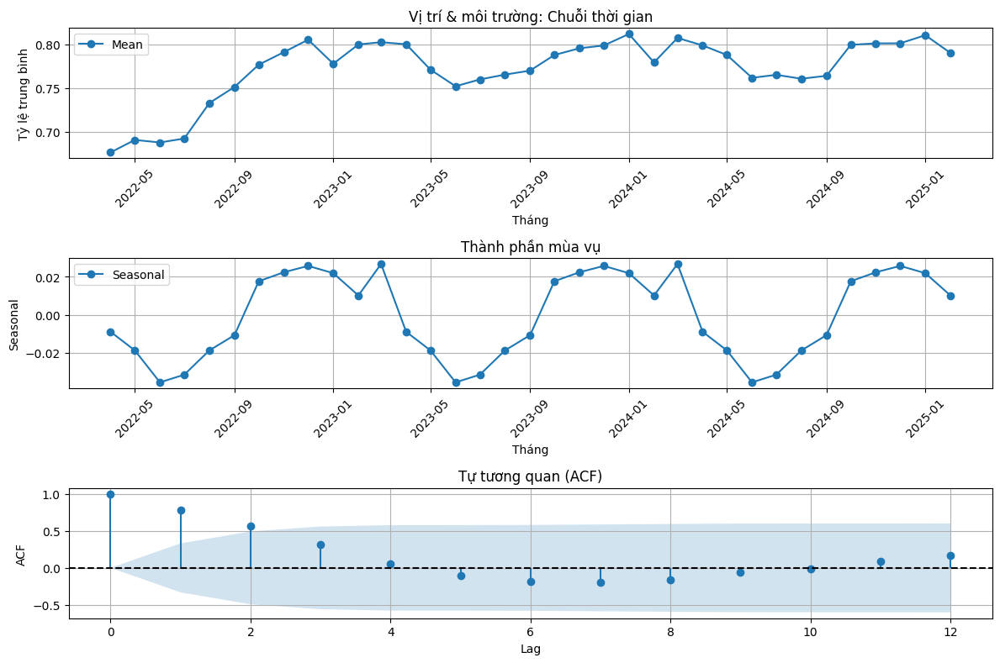


Đã lưu biểu đồ phân tích cho Vị trí & môi trường: output\time_series_analysis_Vị_trí_&_môi_trường.png


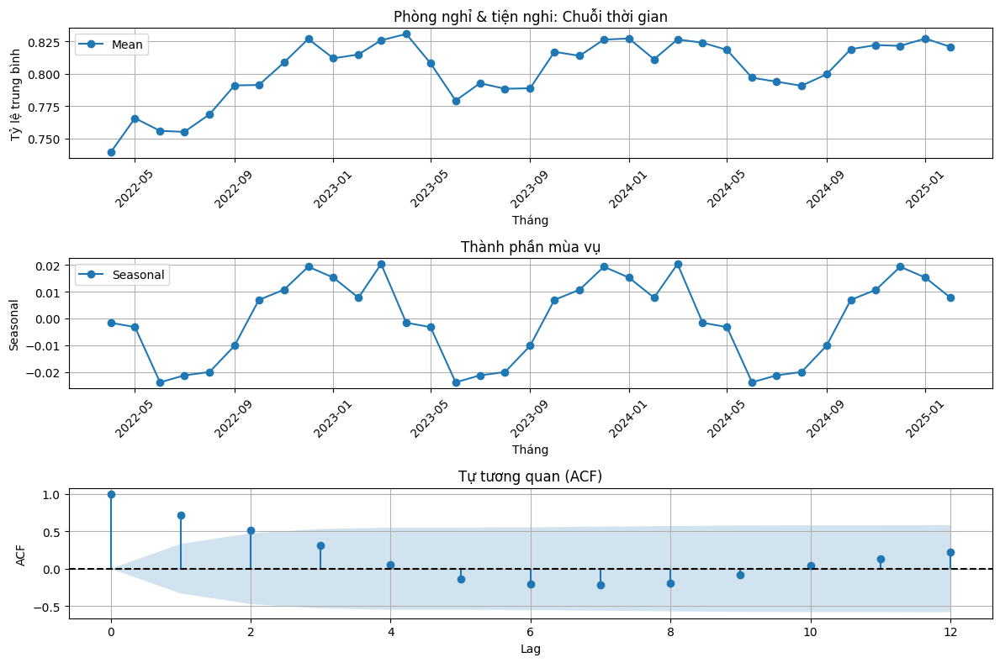


Đã lưu biểu đồ phân tích cho Phòng nghỉ & tiện nghi: output\time_series_analysis_Phòng_nghỉ_&_tiện_nghi.png


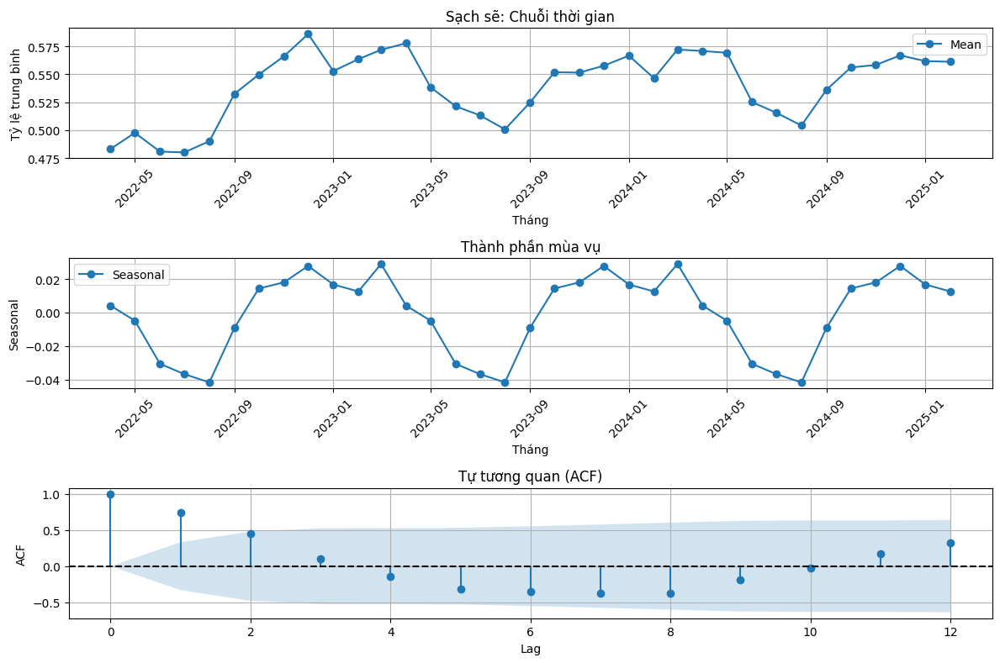


Đã lưu biểu đồ phân tích cho Sạch sẽ: output\time_series_analysis_Sạch_sẽ.png


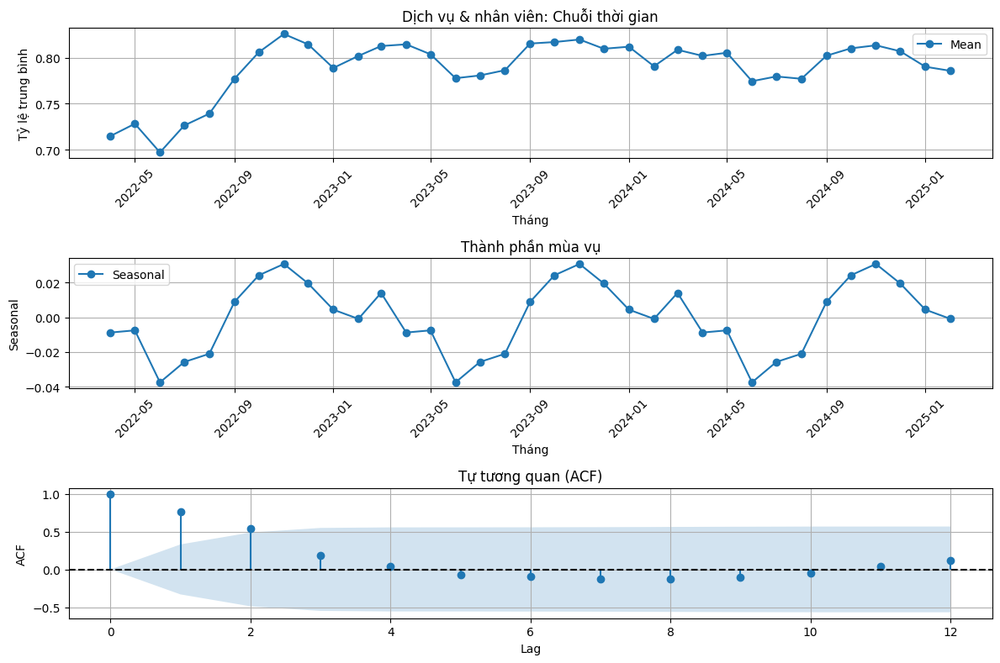


Đã lưu biểu đồ phân tích cho Dịch vụ & nhân viên: output\time_series_analysis_Dịch_vụ_&_nhân_viên.png


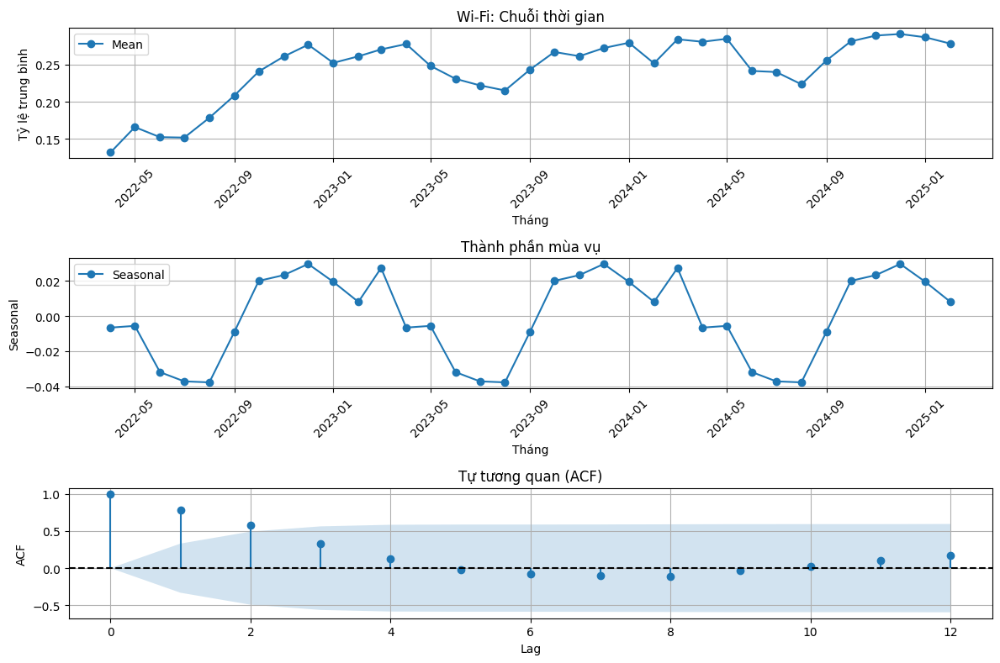


Đã lưu biểu đồ phân tích cho Wi-Fi: output\time_series_analysis_Wi-Fi.png


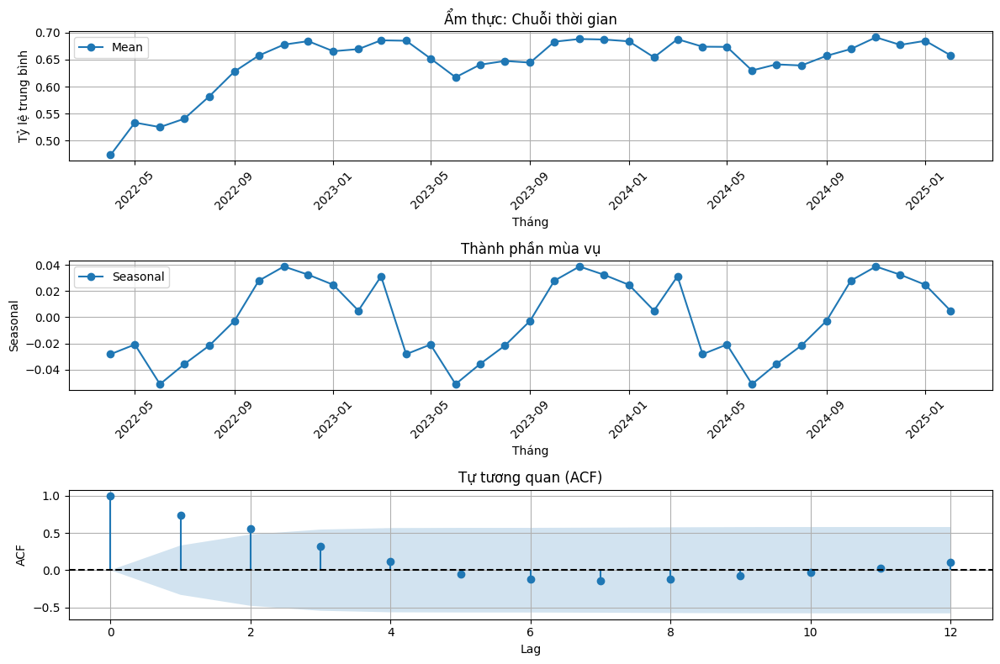


Đã lưu biểu đồ phân tích cho Ẩm thực: output\time_series_analysis_Ẩm_thực.png


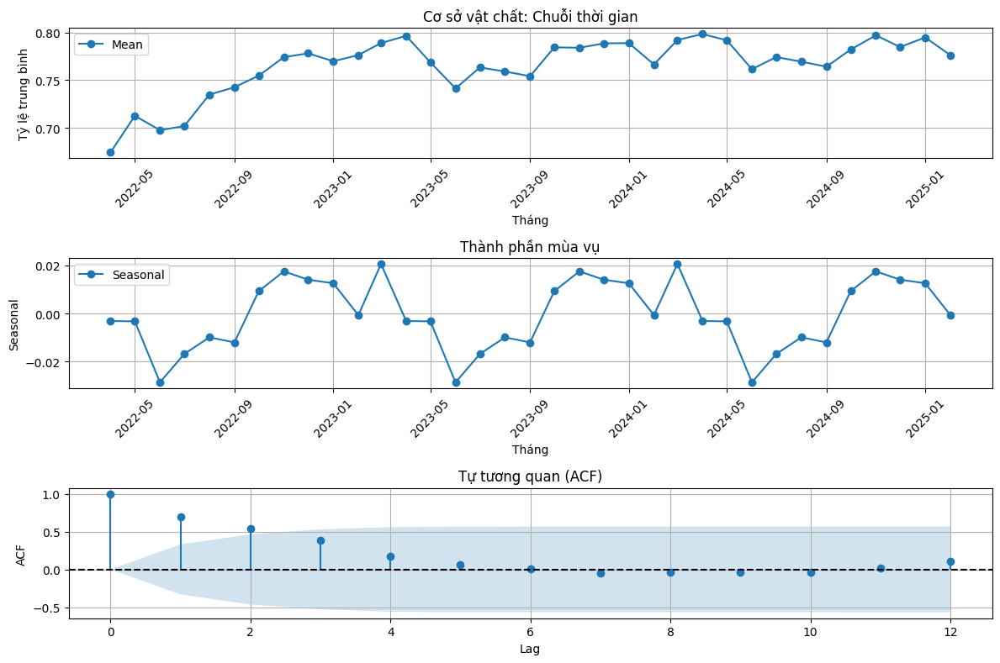


Đã lưu biểu đồ phân tích cho Cơ sở vật chất: output\time_series_analysis_Cơ_sở_vật_chất.png


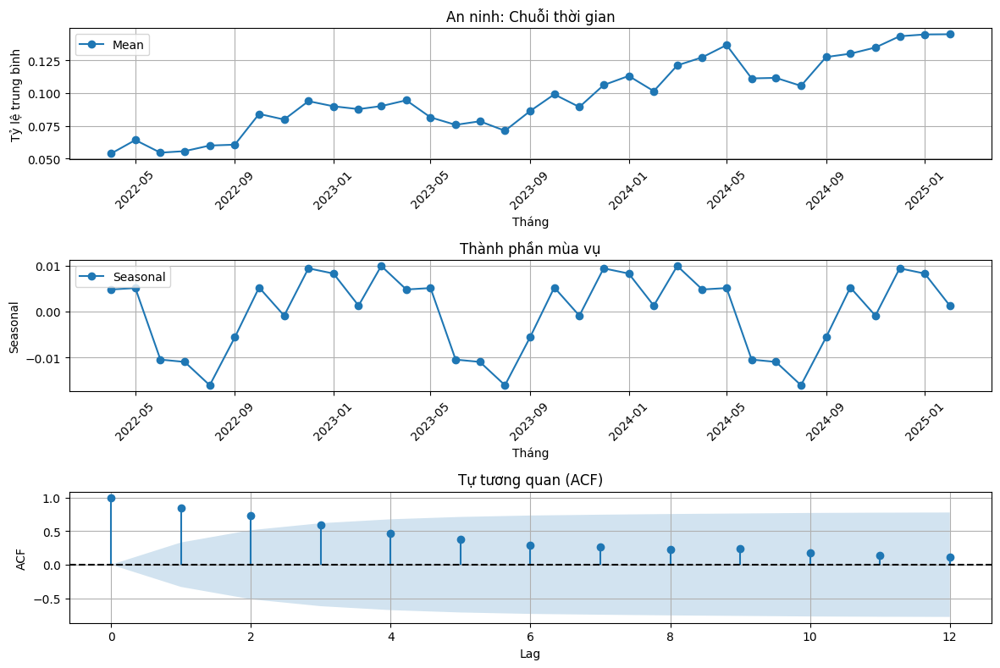


Đã lưu biểu đồ phân tích cho An ninh: output\time_series_analysis_An_ninh.png


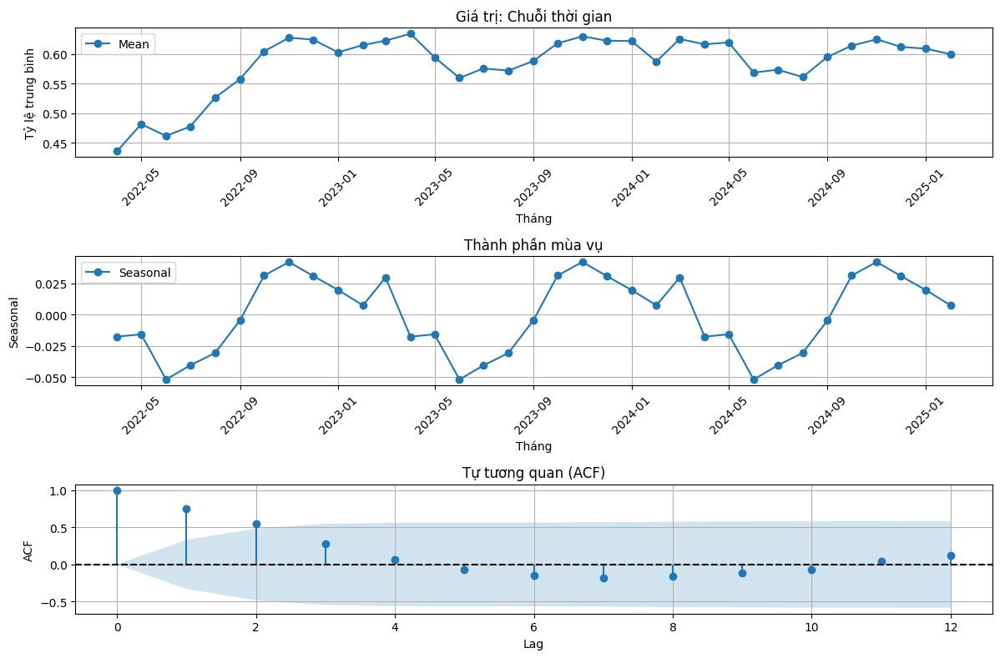


Đã lưu biểu đồ phân tích cho Giá trị: output\time_series_analysis_Giá_trị.png

Đã lưu kết quả kiểm định vào: output\time_series_test_results.csv

=== Kết quả kiểm định ===
                Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0021          0.0001   
1  Phòng nghỉ & tiện nghi         Tăng        0.0014          0.0002   
2                 Sạch sẽ         Tăng        0.0012          0.0127   
3     Dịch vụ & nhân viên         Tăng        0.0015          0.0032   
4                   Wi-Fi         Tăng        0.0029          0.0000   
5                 Ẩm thực         Tăng        0.0030          0.0002   
6          Cơ sở vật chất         Tăng        0.0020          0.0000   
7                 An ninh         Tăng        0.0025          0.0000   
8                 Giá trị         Tăng        0.0027          0.0008   

  Trend_MannKendall  P_Value_MK  Seasonal_Strength  Has_Seasonality  \
0        increasing      0.0024    

In [45]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, adfuller, q_stat
from statsmodels.stats.diagnostic import acorr_ljungbox  # Sử dụng acorr_ljungbox thay vì q_stat
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
from statsmodels.stats.stattools import durbin_watson  # Sửa import
from pymannkendall import original_test

def analyze_time_series_patterns(results_df, output_dir='output'):
    """Phân tích xu hướng, mùa vụ, tính độc lập và mẫu hình của các tiêu chí theo thời gian."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Đảm bảo year_month là datetime
    results_df['year_month'] = pd.to_datetime(results_df['year_month'])
    
    # Danh sách tiêu chí
    criteria = results_df['Criterion'].unique()
    
    # Khởi tạo danh sách lưu kết quả kiểm định
    test_results = []
    
    for criterion in criteria:
        # Lọc dữ liệu cho tiêu chí
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) < 3:
            print(f"\nTiêu chí {criterion}: Không đủ dữ liệu để phân tích.")
            continue
        
        # Chuẩn bị dữ liệu
        time_series = df_criterion['Mean'].values
        time_index = df_criterion['year_month']
        n = len(time_series)
        
        # 1. Hồi quy tuyến tính để kiểm tra xu hướng
        time_numeric = np.arange(n)
        X = sm.add_constant(time_numeric)
        model = OLS(time_series, X).fit()
        slope = model.params[1]
        p_value_slope = model.pvalues[1]
        trend_linear = 'Tăng' if slope > 0 and p_value_slope < 0.05 else 'Giảm' if slope < 0 and p_value_slope < 0.05 else 'Không rõ'
        
        # 2. Kiểm tra Mann-Kendall
        mk_result = original_test(time_series)
        trend_mk = mk_result.trend
        p_value_mk = mk_result.p
        
        # 3. Phân rã chuỗi thời gian
        try:
            decomposition = seasonal_decompose(time_series, model='additive', period=12, extrapolate_trend='freq')
            seasonal_strength = np.var(decomposition.seasonal) / np.var(time_series)
            has_seasonality = seasonal_strength > 0.1  # Ngưỡng tùy chọn
        except:
            seasonal_strength = np.nan
            has_seasonality = False
        
        # 4. Kiểm tra tự tương quan (ACF) tại lag 12
        acf_values, confint = acf(time_series, nlags=12, alpha=0.05)
        acf_lag12 = acf_values[12]
        acf_lag12_significant = abs(acf_lag12) > confint[12, 1] / 1.96  # So với khoảng tin cậy
        
        # 5. Kiểm tra Durbin-Watson
        dw_stat = durbin_watson(model.resid)
        dw_interpretation = 'Tự tương quan dương' if dw_stat < 1.5 else 'Tự tương quan âm' if dw_stat > 2.5 else 'Gần độc lập'
        
        # 6. Kiểm tra Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        
        # 7. Kiểm tra tính dừng (Dickey-Fuller)
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        stationary = adf_pvalue < 0.05
        
        # Lưu kết quả
        test_results.append({
            'Criterion': criterion,
            'Trend_Linear': trend_linear,
            'Slope_Linear': slope,
            'P_Value_Linear': p_value_slope,
            'Trend_MannKendall': trend_mk,
            'P_Value_MK': p_value_mk,
            'Seasonal_Strength': seasonal_strength,
            'Has_Seasonality': has_seasonality,
            'ACF_Lag12': acf_lag12,
            'ACF_Lag12_Significant': acf_lag12_significant,
            'Durbin_Watson': dw_stat,
            'DW_Interpretation': dw_interpretation,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'Stationary': stationary
        })
        
        # Vẽ biểu đồ phân rã và ACF
        plt.figure(figsize=(12, 8))
        plt.subplot(3, 1, 1)
        plt.plot(time_index, time_series, marker='o', label='Mean')
        plt.title(f'{criterion}: Chuỗi thời gian')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ trung bình')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        
        if not np.isnan(seasonal_strength):
            plt.subplot(3, 1, 2)
            plt.plot(time_index, decomposition.seasonal, marker='o', label='Seasonal')
            plt.title('Thành phần mùa vụ')
            plt.xlabel('Tháng')
            plt.ylabel('Seasonal')
            plt.xticks(rotation=45)
            plt.grid(True)
            plt.legend()
        
        plt.subplot(3, 1, 3)
        plt.stem(range(13), acf_values, basefmt=' ')
        plt.fill_between(range(13), confint[:, 0] - acf_values, confint[:, 1] - acf_values, alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan (ACF)')
        plt.xlabel('Lag')
        plt.ylabel('ACF')
        plt.grid(True)
        
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'time_series_analysis_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
        print(f"\nĐã lưu biểu đồ phân tích cho {criterion}: {plot_path}")
    
    # Tạo DataFrame kết quả
    results_summary = pd.DataFrame(test_results)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'time_series_test_results.csv')
    results_summary.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả kiểm định vào: {output_path}")
    
    return results_summary


criteria = ['Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên', 
            'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị']



summary_df = analyze_time_series_patterns(results_df)
print("\n=== Kết quả kiểm định ===")
print(summary_df.round(4))


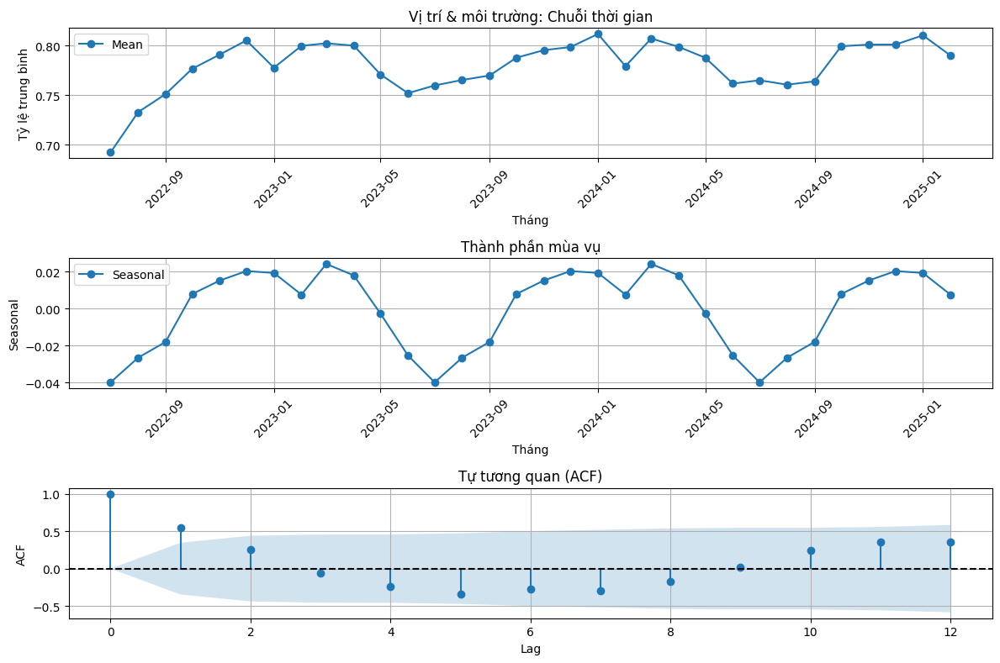


Đã lưu biểu đồ phân tích cho Vị trí & môi trường: output\time_series_analysis_Vị_trí_&_môi_trường.png


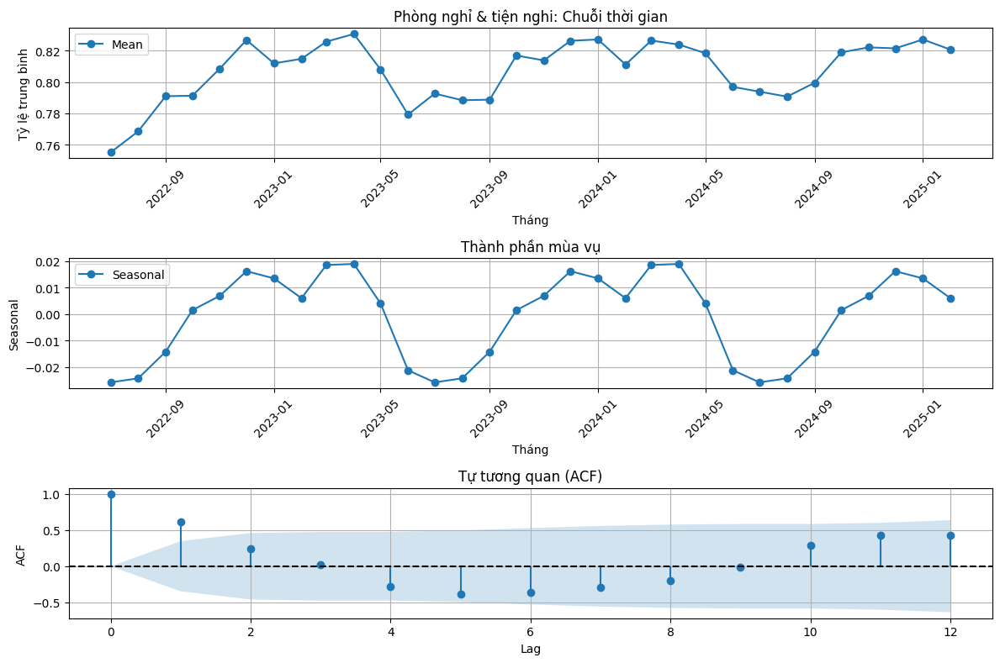


Đã lưu biểu đồ phân tích cho Phòng nghỉ & tiện nghi: output\time_series_analysis_Phòng_nghỉ_&_tiện_nghi.png


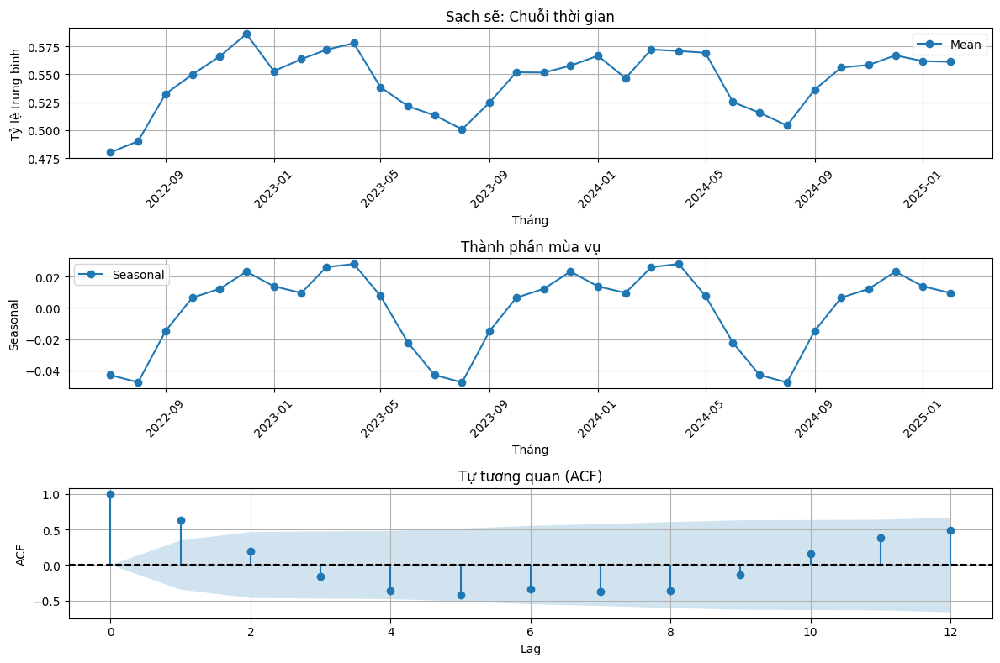


Đã lưu biểu đồ phân tích cho Sạch sẽ: output\time_series_analysis_Sạch_sẽ.png


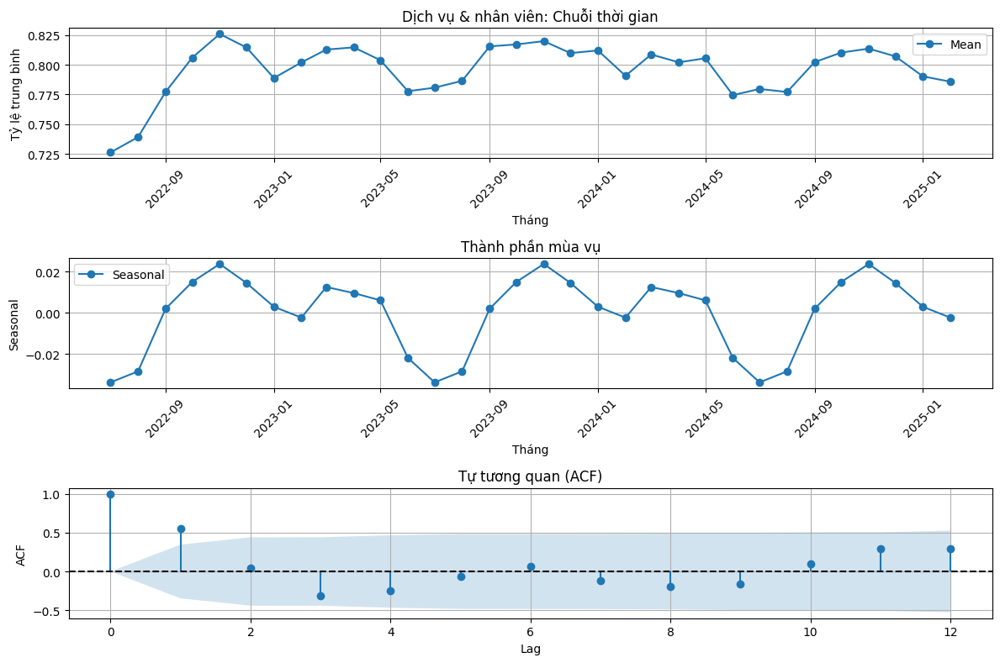


Đã lưu biểu đồ phân tích cho Dịch vụ & nhân viên: output\time_series_analysis_Dịch_vụ_&_nhân_viên.png


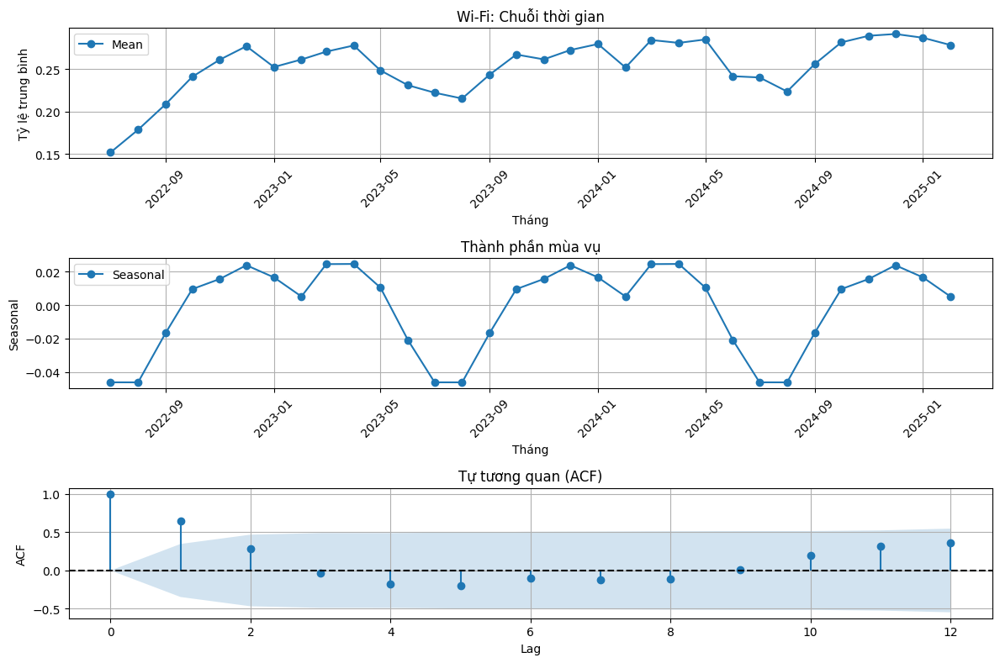


Đã lưu biểu đồ phân tích cho Wi-Fi: output\time_series_analysis_Wi-Fi.png


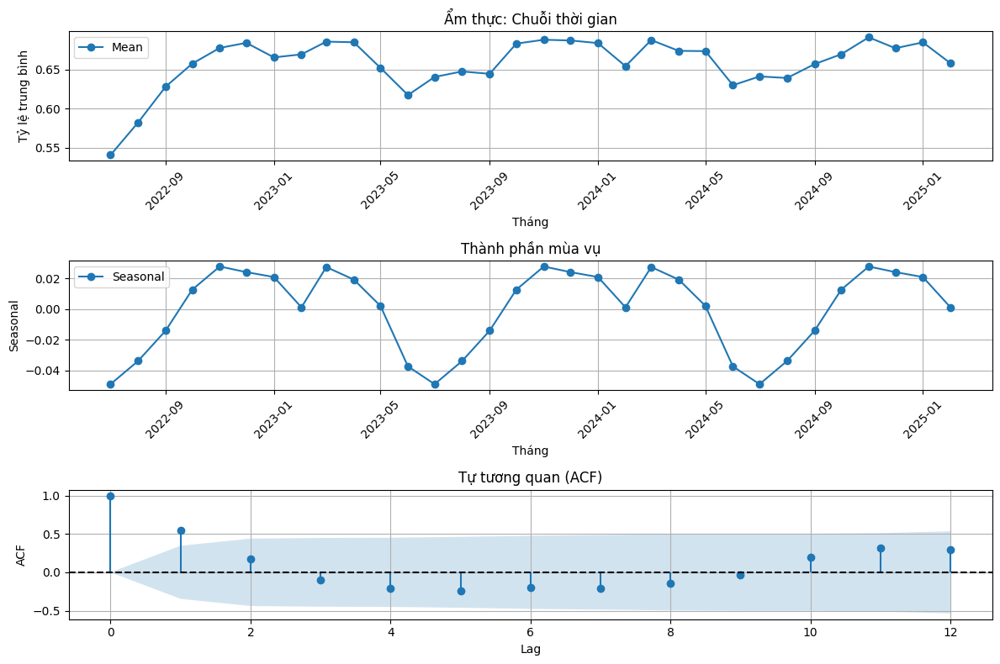


Đã lưu biểu đồ phân tích cho Ẩm thực: output\time_series_analysis_Ẩm_thực.png


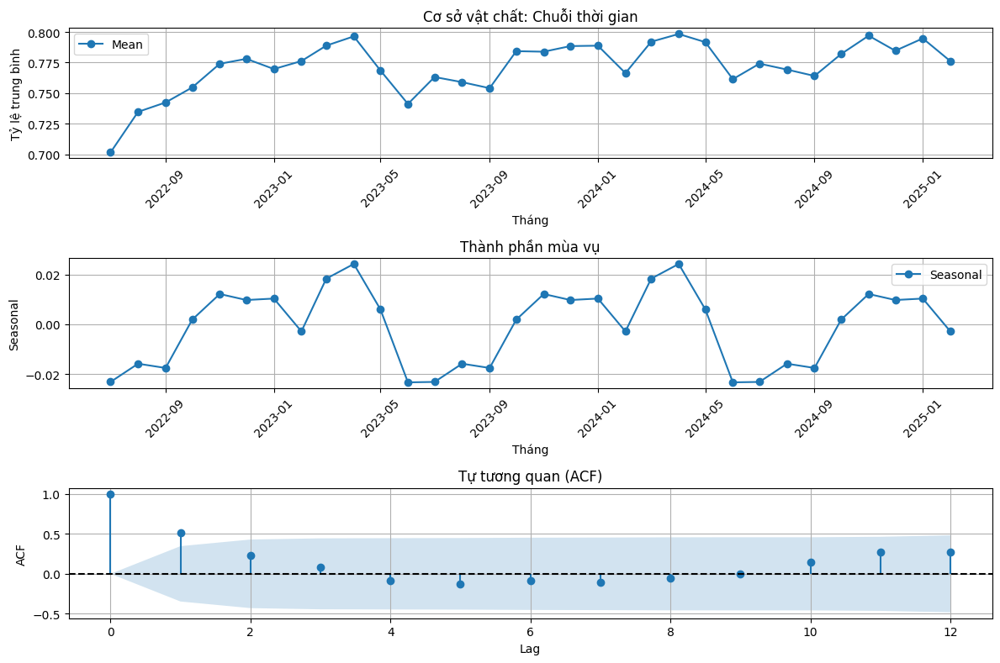


Đã lưu biểu đồ phân tích cho Cơ sở vật chất: output\time_series_analysis_Cơ_sở_vật_chất.png


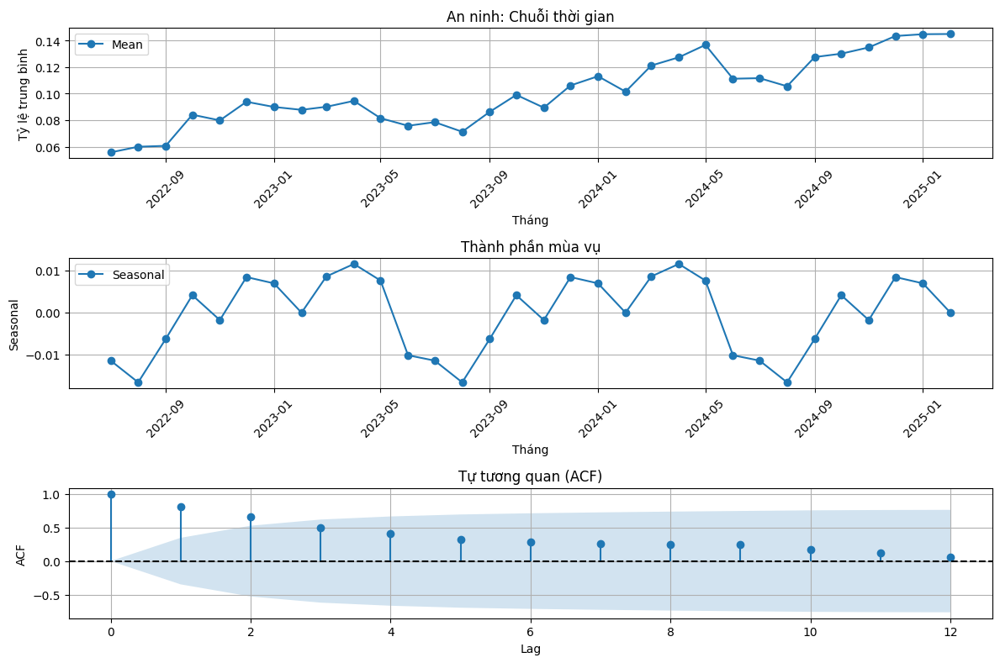


Đã lưu biểu đồ phân tích cho An ninh: output\time_series_analysis_An_ninh.png


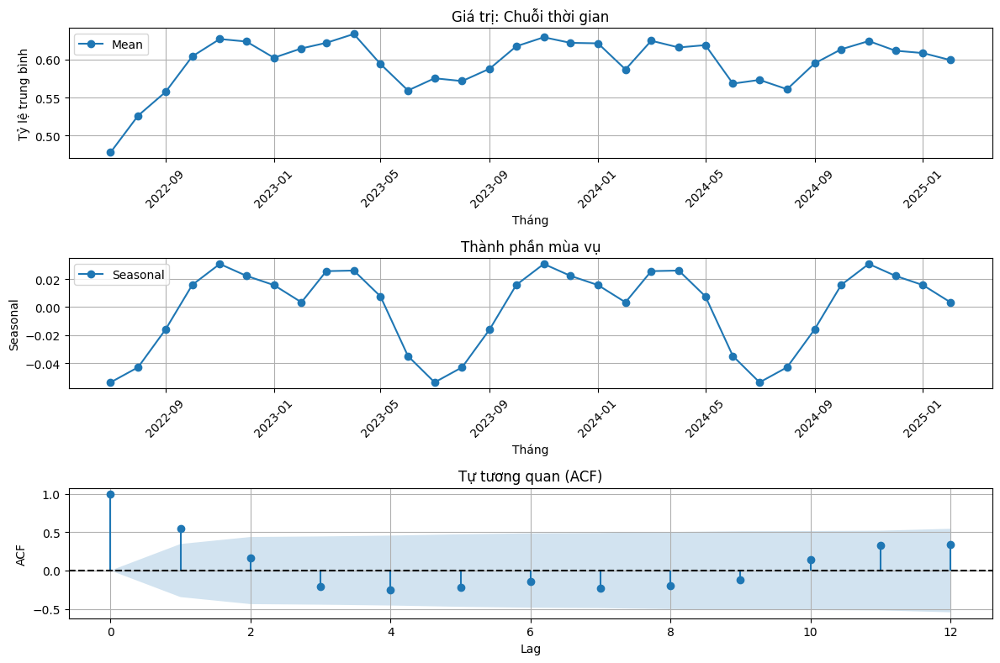


Đã lưu biểu đồ phân tích cho Giá trị: output\time_series_analysis_Giá_trị.png

Đã lưu kết quả kiểm định vào: output\time_series_test_results.csv

=== Kết quả kiểm định ===
                Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0011          0.0202   
1  Phòng nghỉ & tiện nghi         Tăng        0.0009          0.0161   
2                 Sạch sẽ     Không rõ        0.0006          0.2385   
3     Dịch vụ & nhân viên     Không rõ        0.0005          0.2247   
4                   Wi-Fi         Tăng        0.0020          0.0008   
5                 Ẩm thực         Tăng        0.0013          0.0303   
6          Cơ sở vật chất         Tăng        0.0012          0.0014   
7                 An ninh         Tăng        0.0025          0.0000   
8                 Giá trị     Không rõ        0.0011          0.0914   

  Trend_MannKendall  P_Value_MK  Seasonal_Strength  Has_Seasonality  \
0          no trend      0.0578    

In [49]:
summary_df = analyze_time_series_patterns(results_df_drop_month)
print("\n=== Kết quả kiểm định ===")
print(summary_df.round(4))


Đã lưu biểu đồ tương quan: output\criteria_correlation_heatmap.png


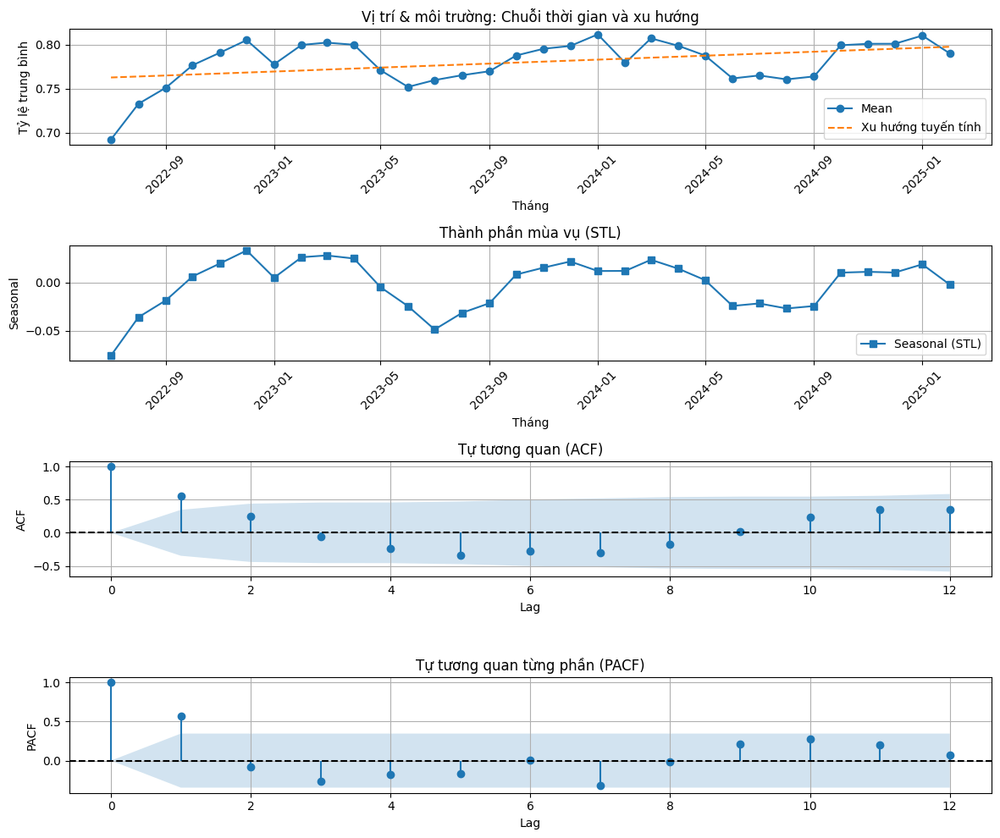


Đã lưu biểu đồ phân tích cho Vị trí & môi trường: output\time_series_analysis_Vị_trí_&_môi_trường.png


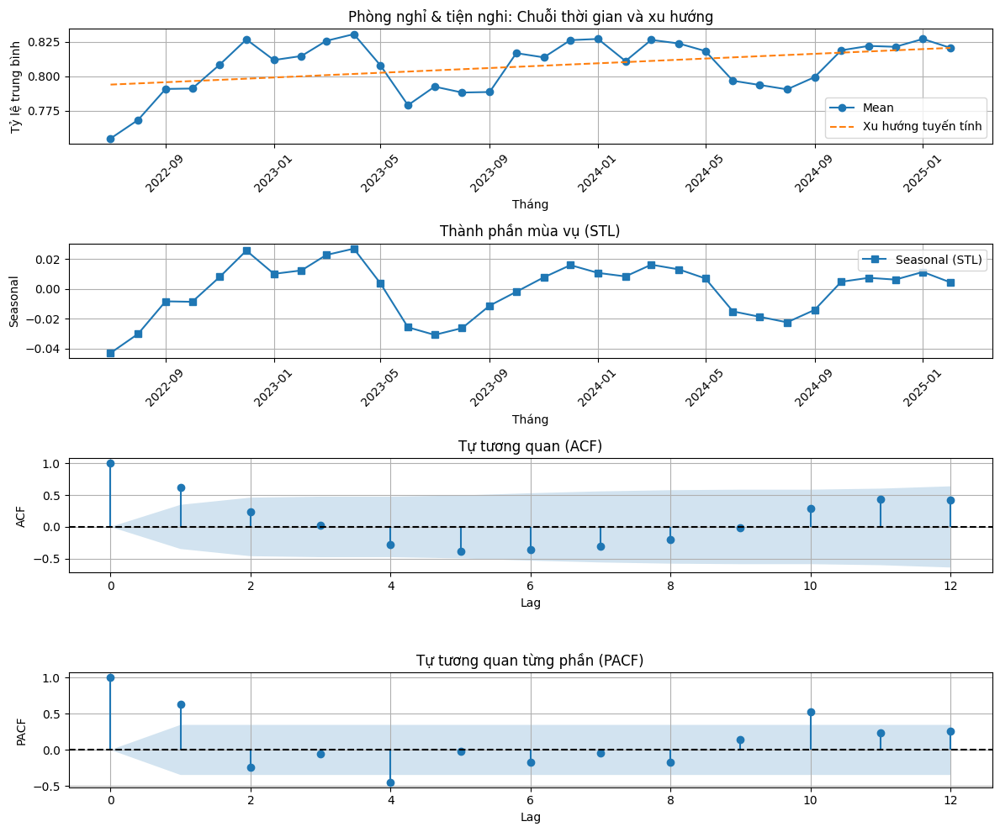


Đã lưu biểu đồ phân tích cho Phòng nghỉ & tiện nghi: output\time_series_analysis_Phòng_nghỉ_&_tiện_nghi.png


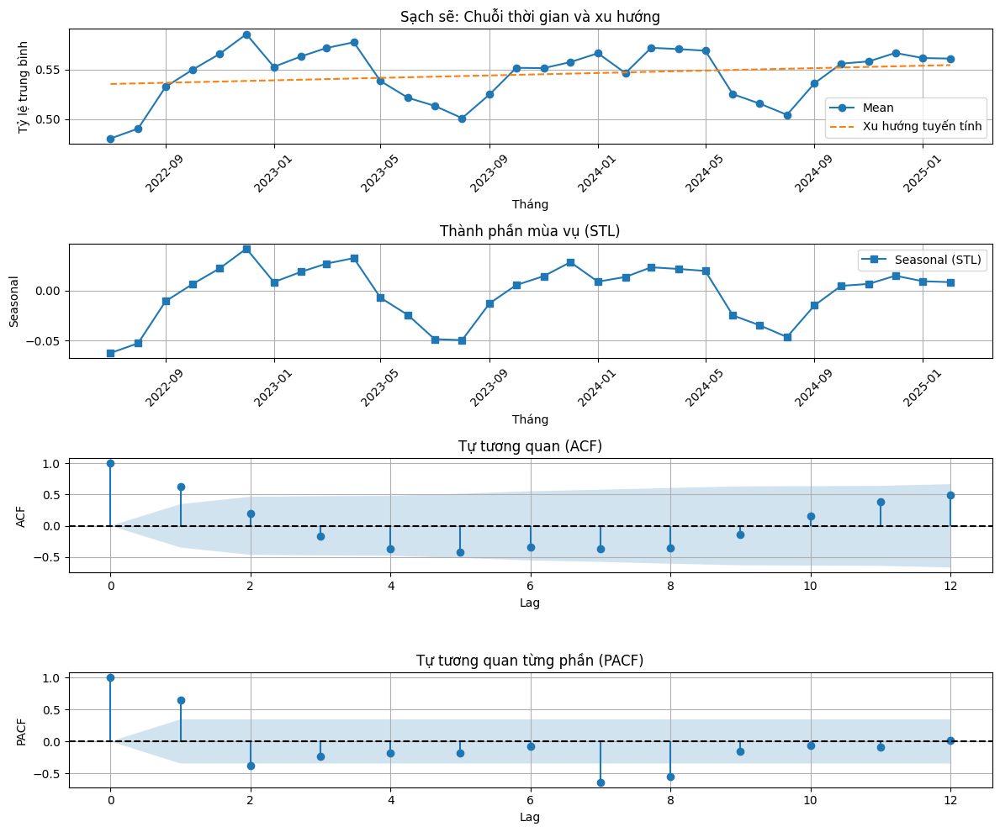


Đã lưu biểu đồ phân tích cho Sạch sẽ: output\time_series_analysis_Sạch_sẽ.png


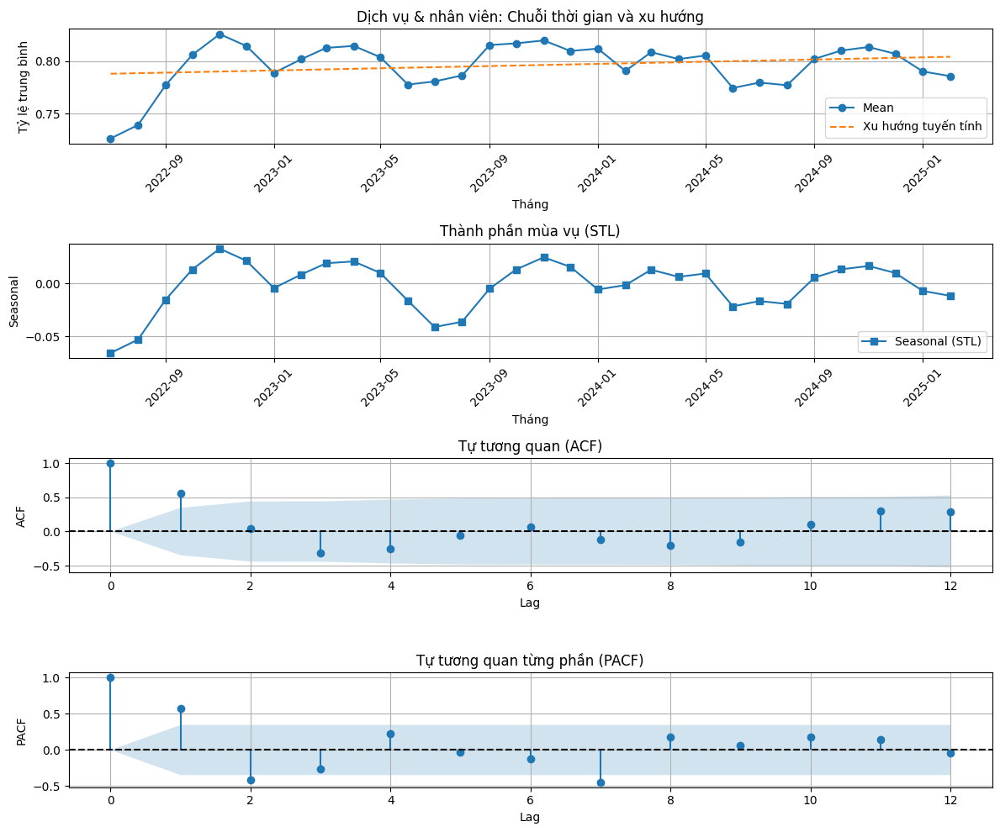


Đã lưu biểu đồ phân tích cho Dịch vụ & nhân viên: output\time_series_analysis_Dịch_vụ_&_nhân_viên.png


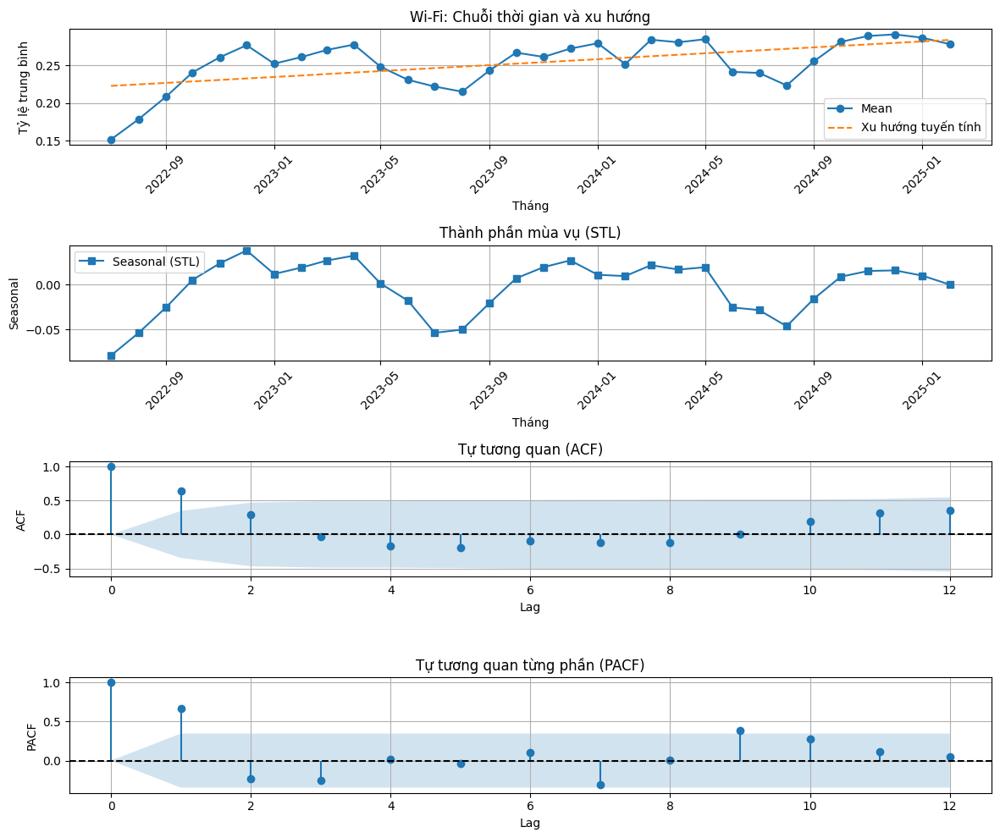


Đã lưu biểu đồ phân tích cho Wi-Fi: output\time_series_analysis_Wi-Fi.png


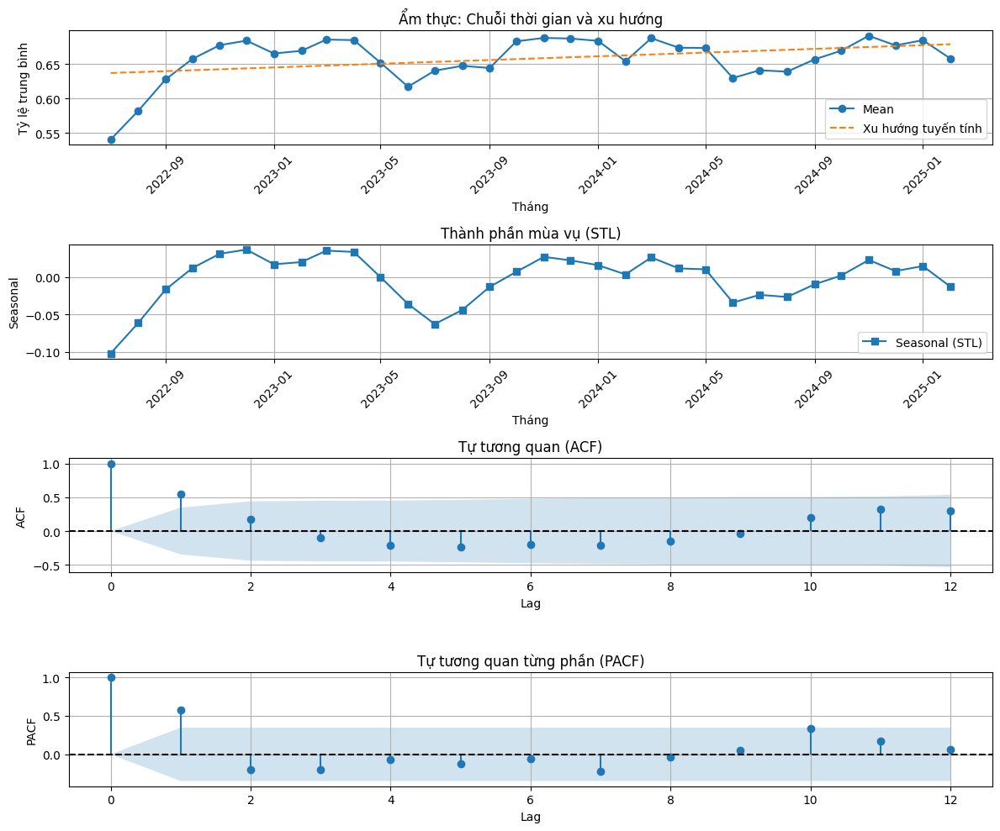


Đã lưu biểu đồ phân tích cho Ẩm thực: output\time_series_analysis_Ẩm_thực.png


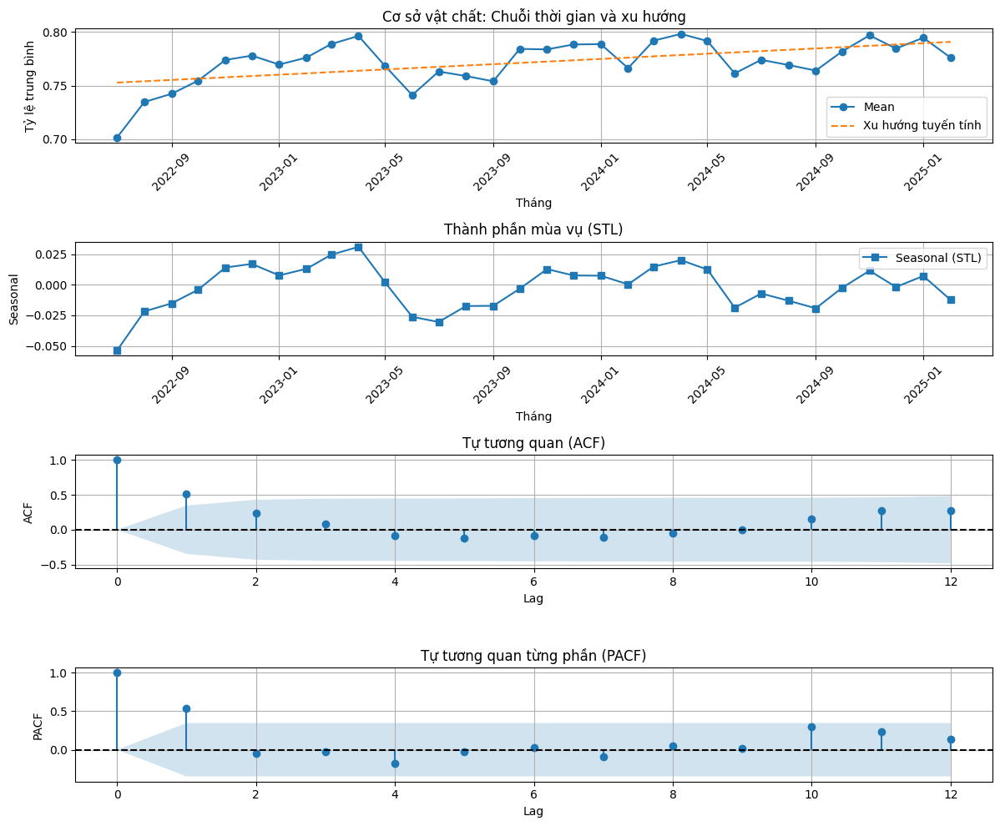


Đã lưu biểu đồ phân tích cho Cơ sở vật chất: output\time_series_analysis_Cơ_sở_vật_chất.png


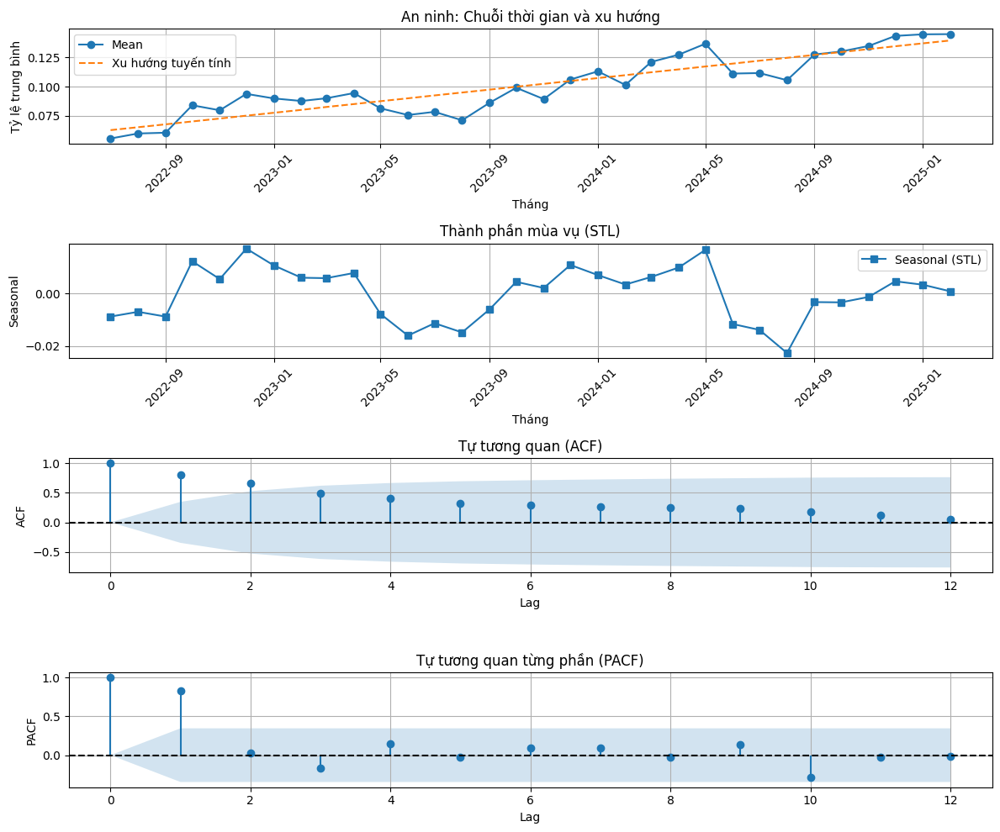


Đã lưu biểu đồ phân tích cho An ninh: output\time_series_analysis_An_ninh.png


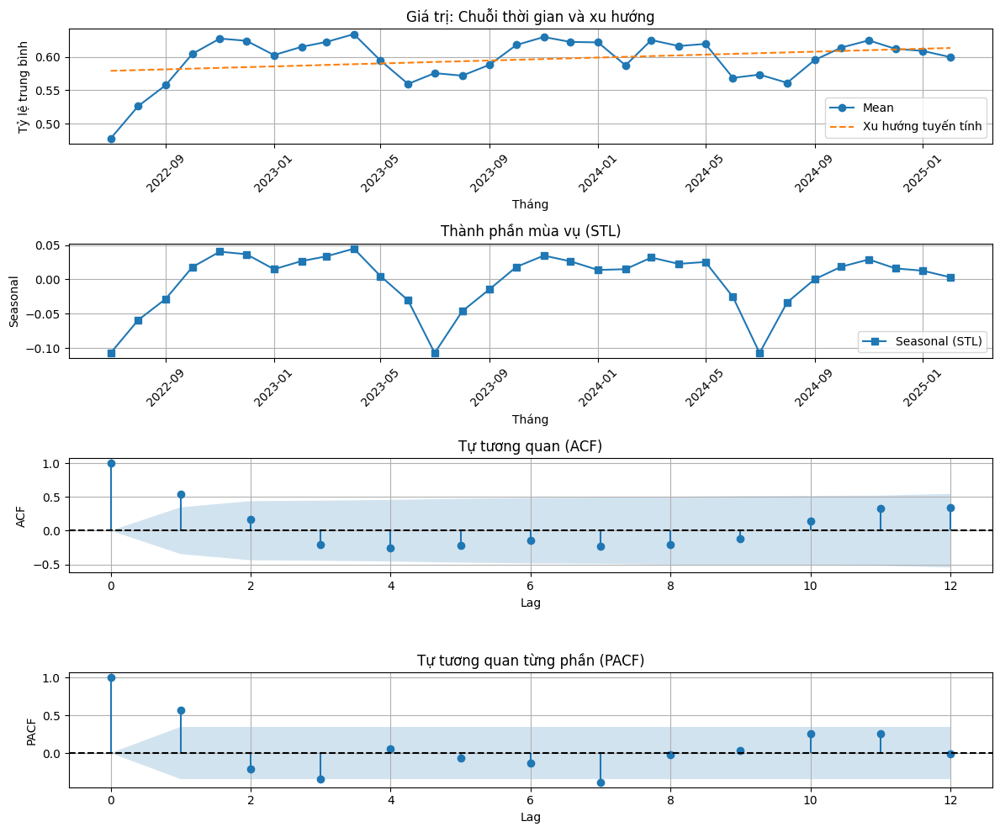


Đã lưu biểu đồ phân tích cho Giá trị: output\time_series_analysis_Giá_trị.png

Đã lưu kết quả kiểm định vào: output\time_series_result_enhanced.csv


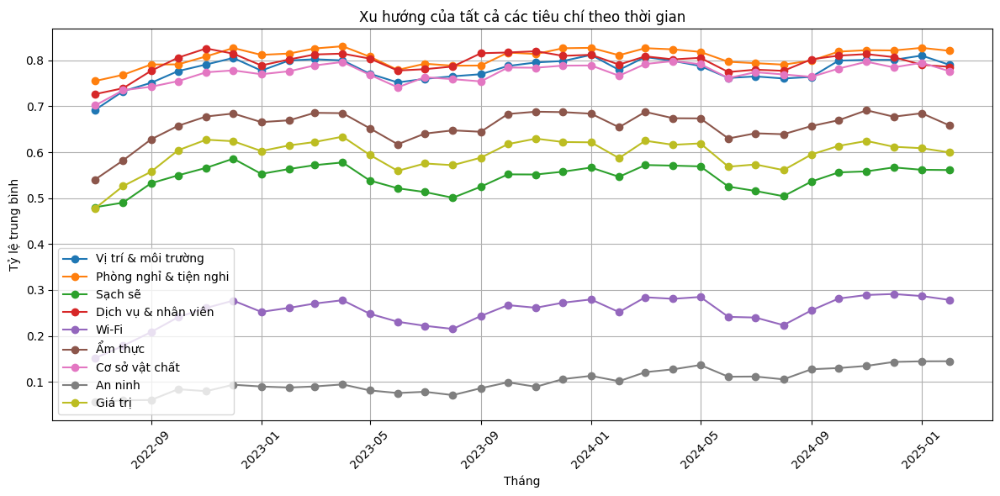


Đã lưu biểu đồ tổng hợp: output\all_criteria_trend.pdf

=== Kết quả kiểm định ===
                Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0011          0.0202   
1  Phòng nghỉ & tiện nghi         Tăng        0.0009          0.0161   
2                 Sạch sẽ     Không rõ        0.0006          0.2385   
3     Dịch vụ & nhân viên     Không rõ        0.0005          0.2247   
4                   Wi-Fi         Tăng        0.0020          0.0008   
5                 Ẩm thực         Tăng        0.0013          0.0303   
6          Cơ sở vật chất         Tăng        0.0012          0.0014   
7                 An ninh         Tăng        0.0025          0.0000   
8                 Giá trị     Không rõ        0.0011          0.0914   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0             True                   False          no trend      0.0578   
1             True                   False  

In [54]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import acf, pacf, adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro
from pymannkendall import original_test
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')  # Bỏ qua cảnh báo từ KPSS

def analyze_time_series_patterns_enhanced(results_df, output_dir='output'):
    """Phân tích xu hướng, mùa vụ, tính độc lập và mẫu hình của các tiêu chí theo thời gian."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Đảm bảo year_month là datetime
    results_df['year_month'] = pd.to_datetime(results_df['year_month'])
    
    # Danh sách tiêu chí
    criteria = results_df['Criterion'].unique()
    
    # Khởi tạo danh sách lưu kết quả kiểm định
    test_results = []
    
    # Phân tích tương quan giữa các tiêu chí
    pivot_df = results_df.pivot_table(index='year_month', columns='Criterion', values='Mean')
    correlation_matrix = pivot_df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Ma trận tương quan giữa các tiêu chí')
    plt.tight_layout()
    corr_plot_path = os.path.join(output_dir, 'criteria_correlation_heatmap.png')
    plt.savefig(corr_plot_path, bbox_inches='tight')
    plt.close()
    print(f"\nĐã lưu biểu đồ tương quan: {corr_plot_path}")
    
    for criterion in criteria:
        # Lọc dữ liệu cho tiêu chí
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) < 3:
            print(f"\nTiêu chí {criterion}: Không đủ dữ liệu để phân tích.")
            continue
        
        # Chuẩn bị dữ liệu
        time_series = df_criterion['Mean'].values
        time_index = df_criterion['year_month']
        n = len(time_series)
        
        # 1. Hồi quy tuyến tính
        time_numeric = np.arange(n)
        X = sm.add_constant(time_numeric)
        model = OLS(time_series, X).fit()
        slope = model.params[1]
        p_value_slope = model.pvalues[1]
        trend_linear = 'Tăng' if slope > 0 and p_value_slope < 0.05 else 'Giảm' if slope < 0 and p_value_slope < 0.05 else 'Không rõ'
        
        # Kiểm tra giả định phần dư
        shapiro_pvalue = shapiro(model.resid)[1]
        resid_normality = shapiro_pvalue > 0.05
        bp_test = het_breuschpagan(model.resid, X)
        resid_homoscedasticity = bp_test[1] > 0.05
        
        # 2. Kiểm tra Mann-Kendall
        mk_result = original_test(time_series)
        trend_mk = mk_result.trend
        p_value_mk = mk_result.p
        
        # 3. Phân rã STL
        try:
            stl = STL(time_series, period=12, robust=True).fit()
            seasonal_strength = np.var(stl.seasonal) / np.var(time_series)
            has_seasonality = seasonal_strength > 0.1
        except:
            seasonal_strength = np.nan
            has_seasonality = False
        
        # 4. Kiểm tra tự tương quan (ACF) và PACF
        acf_values, acf_confint = acf(time_series, nlags=min(12, n-1), alpha=0.05)
        pacf_values, pacf_confint = pacf(time_series, nlags=min(12, n-1), alpha=0.05)
        acf_lag12 = acf_values[12] if len(acf_values) > 12 else np.nan
        acf_lag12_significant = abs(acf_lag12) > acf_confint[12, 1] / 1.96 if len(acf_confint) > 12 else False
        
        # 5. Kiểm tra Durbin-Watson
        dw_stat = durbin_watson(model.resid)
        dw_interpretation = 'Tự tương quan dương' if dw_stat < 1.5 else 'Tự tương quan âm' if dw_stat > 2.5 else 'Gần độc lập'
        
        # 6. Kiểm tra Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        # 7. Kiểm tra tính dừng (ADF và KPSS)
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        adf_stationary = adf_pvalue < 0.05
        kpss_result = kpss(time_series, regression='c')
        kpss_stat = kpss_result[0]
        kpss_pvalue = kpss_result[1]
        kpss_stationary = kpss_pvalue > 0.05
        
        # Lưu kết quả
        test_results.append({
            'Criterion': criterion,
            'Trend_Linear': trend_linear,
            'Slope_Linear': slope,
            'P_Value_Linear': p_value_slope,
            'Resid_Normality': resid_normality,
            'Resid_Homoscedasticity': resid_homoscedasticity,
            'Trend_MannKendall': trend_mk,
            'P_Value_MK': p_value_mk,
            'Seasonal_Strength': seasonal_strength,
            'Has_Seasonality': has_seasonality,
            'ACF_Lag12': acf_lag12,
            'ACF_Lag12_Significant': acf_lag12_significant,
            'Durbin_Watson': dw_stat,
            'DW_Interpretation': dw_interpretation,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'ADF_Stationary': adf_stationary,
            'KPSS_PValue': kpss_pvalue,
            'KPSS_Stationary': kpss_stationary
        })
        
        # Vẽ biểu đồ phân tích
        plt.figure(figsize=(12, 10))
        
        # Chuỗi thời gian và xu hướng
        plt.subplot(4, 1, 1)
        plt.plot(time_index, time_series, marker='o', label='Mean')
        plt.plot(time_index, model.fittedvalues, linestyle='--', label='Xu hướng tuyến tính')
        plt.title(f'{criterion}: Chuỗi thời gian và xu hướng')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ trung bình')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        
        # Thành phần mùa vụ STL
        if not np.isnan(seasonal_strength):
            plt.subplot(4, 1, 2)
            plt.plot(time_index, stl.seasonal, marker='s', label='Seasonal (STL)')
            plt.title('Thành phần mùa vụ (STL)')
            plt.xlabel('Tháng')
            plt.ylabel('Seasonal')
            plt.xticks(rotation=45)
            plt.grid(True)
            plt.legend()
        
        # ACF
        plt.subplot(4, 1, 3)
        plt.stem(range(min(13, n)), acf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), acf_confint[:min(13, n), 0] - acf_values[:min(13, n)], 
                         acf_confint[:min(13, n), 1] - acf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan (ACF)')
        plt.xlabel('Lag')
        plt.ylabel('ACF')
        plt.grid(True)
        
        # PACF
        plt.subplot(4, 1, 4)
        plt.stem(range(min(13, n)), pacf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), pacf_confint[:min(13, n), 0] - pacf_values[:min(13, n)], 
                         pacf_confint[:min(13, n), 1] - pacf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan từng phần (PACF)')
        plt.xlabel('Lag')
        plt.ylabel('PACF')
        plt.grid(True)
        
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'time_series_analysis_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
        print(f"\nĐã lưu biểu đồ phân tích cho {criterion}: {plot_path}")
    
    # Tạo DataFrame kết quả
    results_summary = pd.DataFrame(test_results)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'time_series_result_enhanced.csv')
    results_summary.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả kiểm định vào: {output_path}")
    
    # Vẽ biểu đồ tổng hợp cho tất cả tiêu chí
    plt.figure(figsize=(12, 6))
    for criterion in criteria:
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) >= 3:
            plt.plot(df_criterion['year_month'], df_criterion['Mean'], marker='o', label=criterion)
    plt.title('Xu hướng của tất cả các tiêu chí theo thời gian')
    plt.xlabel('Tháng')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    all_criteria_plot_path = os.path.join(output_dir, 'all_criteria_trend.pdf')  # Lưu PDF cho chất lượng cao
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ tổng hợp: {all_criteria_plot_path}")
    
    return results_summary, correlation_matrix


# Chạy hàm
try:
    summary_df, corr_matrix = analyze_time_series_patterns_enhanced(results_df_drop_month)
    print("\n=== Kết quả kiểm định ===")
    print(summary_df.round(4))
    print("\n=== Ma trận tương quan ===")
    print(corr_matrix.round(4))
except Exception as e:
    print(f"\nLỗi: {str(e)}")